In [1]:
rm(list=ls())

剔除干旱点进行分析

1.计算AI

In [ ]:
#1)pet========================================
filename1="H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\data_fd_total.RData"
filename2="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\data_fd_total.RData"
filename3="H:\\NO.1 flash drought\\03data\\ERA5\\2.fd_result\\data_fd_total.RData"

data_name <- c("GLEAM","ERA5LAND","ERA5")
j=3
fun_combine=function(var,data_name,filename){
  load(filename)
  data_fd_total$start_pentad <- (data_fd_total$occ_year-1981)*73+data_fd_total$occ_start                        #计算骤旱发生的开始时间
  data_fd_total$end_pentad <- (data_fd_total$occ_year-1981)*73+data_fd_total$occ_start+data_fd_total$fd_length  #计算骤旱发生的结束时间
  fd_order <- unique(data_fd_total$number)  #发生骤旱的点
  
  #var="pet"
  
  #var_file=sm2
  #fun_combine=function(var,var_file){
  data_var_fd=NULL
  for(i_batch in 1:36){
    load(paste0("H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\","pet2","\\pentad.data.z_1_",i_batch,".RData"))
    data=pentad.data
    data1=matrix(NA,ncol = 40,nrow = 7200)
    for(k in 1:40){
      aa <-rowMeans(data[,(73*(k-1)+1):(73*k)],na.rm = T)
      data1[,k] <-aa
    }#计算每年的日平均
    number <- c((i_batch-1)*7200+1):(i_batch*7200)
    data_var <- data.frame(number,data1)
    #dim(pentad.data.z)
    data_var_fd1 <- data_var[which(data_var$number%in%fd_order),]  #发生骤旱点的土壤湿度数据
    data_var_fd <- rbind(data_var_fd,data_var_fd1)
    print(i_batch)
  }
  save(data_var_fd,file=paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a1_",
                               "pet","_fd_",data_name[j],".RData") )#所有发生骤旱点的土壤湿度数据
}


In [ ]:
#2)p=============================
#load(paste0("I:\\1.data_file\\10气象数据\\1降水数据\\MSWEPV2.2\\P2\\pentad.data.z_",data_name[j],".RData"))

fname="H:\\NO.1 flash drought\\04code\\2.R_copyTX\\function"
source(paste0(fname,"/fanomaly.R"))
source(paste0(fname,"/fpentad.R"))
source(paste0(fname,"/fpercentile.R"))
source(paste0(fname,"/fyear.R"))
source("H:\\NO.1 flash drought\\04code\\6.R_code\\4.paper_function.R")
library(dplyr)
fun_pentad=function(k){
  load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\data_",
              "P","_fd_1_",data_name[k],".RData") )  #骤旱发生的日降水值
  
  m=dim(data_var_fd)
  
  year=1985:2016
  time = seq(from = as.POSIXct('1985-01-01', tz = "GMT"), to = as.POSIXct('2016-12-31', tz = "GMT"), by = 'day')
  
  pentad.data = pentad.data.z= matrix(NA, nrow=m[1], ncol=(length(year) * 73 ))  #7200*2920
  #j=3879
  #k=3
  eta=data_var_fd
  
  for(j in 1:m[1]){
    #for (k in 1:m[2]) {
    eta1 = eta[j,]
    #eta1[eta1<0] = NA
    if (length(eta1[is.na(eta1)]) < 0.1 * m[2] ) {
      # if (! mean(eta1, na.rm = T) == mean(pet1, na.rm = T)  ){
      dat = data_clean_data (vtime=time,var=eta1, threshold = 1)  
      #注意根据不同的变量修改公式，有些变量是5天平均，有些是求和
      #  output <- list('pentad_timestamp' = series.esr, 'pentad_matrix' = pentad.esr)
      dat_series = as.vector(dat$pentad_matrix)
      if( length(dat_series[dat_series==1]) < 0.1* length(dat_series) ){
        pentad.data[j, ] = dat_series
        pentad.data.z[j,  ] <- as.vector( t(apply(dat$pentad_matrix,1, f.anomaly)) )
        #pentad.delta_sesr[j,  ] <-  c(dat$pentad_matrix) %>% diff(lag = 1) %>% append(NA,.) %>% as.vector(.)
        #print("Pass the data clean!")
        #}
      }
    }
    print(j)
  }
  save(pentad.data,pentad.data.z,file=paste0("I:\\1.data_file\\10气象数据\\1降水数据\\MSWEPV2.2\\P2\\pentad.data.z_",data_name[k],".RData"))
  
  # data_var_fd=pentad.data.z
  # save(data_var_fd,file=paste0("H:\\NO.1 flash drought\\03data\\meteorological\\data_",
  #                              "P","_fd_2_",data_name,".RData") )    #骤旱发生的pentad标准化值
  return(pentad.data)
}

fun_pentad(1)
fun_pentad(2)
fun_pentad(3)

In [54]:
#3)AI
data_name=c("GLEAM","ERA5LAND","ERA5")
#j=3
filename1="H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\data_fd_total.RData"
filename2="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\data_fd_total.RData"
filename3="H:\\NO.1 flash drought\\03data\\ERA5\\2.fd_result\\data_fd_total.RData"

#ai_fun=function(j,filename){
load(paste0("I:\\1.data_file\\10气象数据\\1降水数据\\MSWEPV2.2\\P2\\pentad.data.z_",data_name[j],".RData"))
load(filename)
data_fd_total <- data_fd_total[-which(data_fd_total$occ_year<1985|data_fd_total$occ_year>2016),] 
data_fd_total$start_pentad <- (data_fd_total$occ_year-1981)*73+data_fd_total$occ_start                        #计算骤旱发生的开始时间
data_fd_total$end_pentad <- (data_fd_total$occ_year-1981)*73+data_fd_total$occ_start+data_fd_total$fd_length  #计算骤旱发生的结束时间
fd_order <- unique(data_fd_total$number)  
#fd_order1 <- unique(data_fd_total$number)  

data=pentad.data
data1=matrix(NA,ncol = 32,nrow=dim(data)[1])
for(k in 1:32){
  aa <-rowMeans(data[,(73*(k-1)+1):(73*k)],na.rm = T)
  data1[,k] <-aa
}#计算每年的日平均
#number <- c((i_batch-1)*7200+1):(i_batch*7200)
data_var <- data.frame(fd_order,data1)
save(data_var,file=paste0("H:\\NO.1 flash drought\\03data\\data_recal\\data_P_",data_name[j],".RData"))


In [142]:
data_name=c("GLEAM","ERA5LAND","ERA5")
ai_fun=function(j,filename){
load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\data_P_",data_name[j],".RData"))
data_var_p <- rowMeans(data_var[,-1])  #降水的年平均值

load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a1_",
            "pet","_fd_",data_name[j],".RData") )

 load(filename)#修改
 data_fd_total <- data_fd_total[-which(data_fd_total$occ_year<1985|data_fd_total$occ_year>2016),] #GLEAM不需要运行这行
 data_fd_total$start_pentad <- (data_fd_total$occ_year-1981)*73+data_fd_total$occ_start                        #计算骤旱发生的开始时间
 data_fd_total$end_pentad <- (data_fd_total$occ_year-1981)*73+data_fd_total$occ_start+data_fd_total$fd_length  #计算骤旱发生的结束时间
 fd_order <- unique(data_fd_total$number)  #发生骤旱的点

data_var_fd <-data_var_fd[which(data_var_fd$number%in%fd_order),]
aa=data_var_fd[,c(6:37)]
data_var_pet <-rowMeans(aa)  #1981:2020---1985-2016 #蒸发的年平均值

DATA <- data.frame(data_var_pet,data_var_p)
DATA$AI <-DATA$data_var_pet/DATA$data_var_p 
#summary(AI)

 
DATA$number <- fd_order #发生骤旱的点

arid <- DATA[which(DATA$AI>2.25),]
arid_number <- unique(arid$number)   #干旱的点
save(arid_number,file=paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number_",data_name[j],".RData"))

transitional <- DATA[which(DATA$AI>0.9 & DATA$AI<=2.25),]
transitional_number <- unique(transitional$number)   #湿润的点
save(transitional_number,file=paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_transitional_number_",data_name[j],".RData"))

transitional <- DATA[which(DATA$AI<=0.9),]
transitional_number <- unique(transitional$number)   #湿润的点
save(transitional_number,file=paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_transitional_number_",data_name[j],".RData"))

}


In [143]:
data_name=c("GLEAM","ERA5LAND","ERA5")
# filename="H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\data_fd_total.RData"
# ai_fun(1,filename)
filename="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\data_fd_total.RData"
ai_fun(2,filename)
filename="H:\\NO.1 flash drought\\03data\\ERA5\\2.fd_result\\data_fd_total.RData"
ai_fun(3,filename)

In [60]:

#总和干旱点
j=1
load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number_",data_name[j],".RData"))
arid_number1=arid_number
j=2
load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number_",data_name[j],".RData"))
arid_number2=arid_number
j=3
load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number_",data_name[j],".RData"))
arid_number3=unique(c(arid_number2,arid_number1,arid_number))
save(arid_number3,file=paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number.RData"))
#(之前画的空间图是arid_number2)


In [144]:
#总湿润点
j=1
load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_humid_number_",data_name[j],".RData"))
humid_number1=humid_number
j=2
load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_humid_number_",data_name[j],".RData"))
humid_number2=humid_number
j=3
load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_humid_number_",data_name[j],".RData"))
humid_number3=unique(c(humid_number2,humid_number1,humid_number))
save(humid_number3,file=paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_humid_number.RData"))


In [145]:
#总过度点
j=1
load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_transitional_number_",data_name[j],".RData"))
transitional_number1=transitional_number
j=2
load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_transitional_number_",data_name[j],".RData"))
transitional_number2=transitional_number
j=3
load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_transitional_number_",data_name[j],".RData"))
transitional_number3=unique(c(transitional_number2,transitional_number1,transitional_number))
save(transitional_number3,file=paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_transitional_number.RData"))


1.1绘制干旱、湿润，过渡分区

In [156]:
load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number.RData"))
load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_transitional_number.RData"))
load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_humid_number.RData"))
load("H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData")
grid2$number=seq(1,dim(grid2)[1],1)
grid2$kind=0
head(humid_number3)
head(transitional_number3)
head(arid_number3)
head(grid2)
dim(grid2)

grid2$kind[which(grid2$number%in%humid_number3)]=1
grid2$kind[which(grid2$number%in%transitional_number3)]=2
grid2$kind[which(grid2$number%in%arid_number3)]=3
grid=grid2[-which(grid2$kind==0),]
head(grid)

[1] 28493 29199 29916 29917 30672 30674

[1] 62381 62382 62384 62385 62386 62387

[1] 66790 66791 66792 67512 67519 68219

,lat,lon,number,kind
,<dbl>,<dbl>,<dbl>,<dbl>
1,90,-180.0,1,0
2,90,-179.5,2,0
3,90,-179.0,3,0
4,90,-178.5,4,0
5,90,-178.0,5,0
6,90,-177.5,6,0


[1] 259200      4

OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Warning message:
"Removed 415 rows containing missing values (geom_tile)."


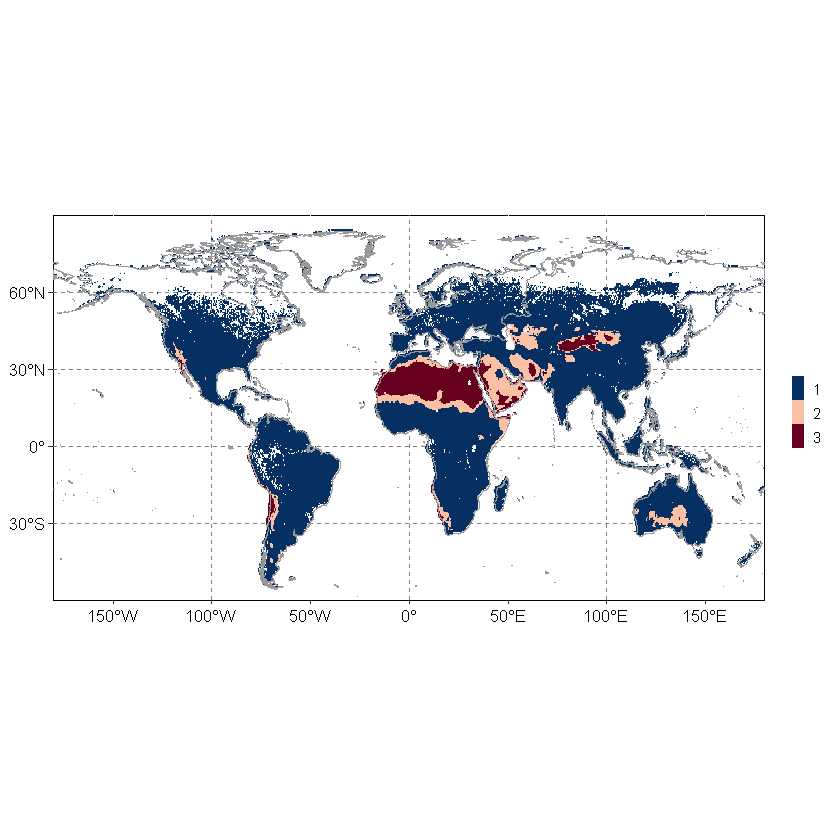

In [163]:
library(raster)
  library(rgdal)
  library(ggplot2)
  library(ggthemes)
  library(rcartocolor)
  library(viridis)
  continent<-rgdal::readOGR('H:\\NO.1 flash drought\\02 地图文件\\continent shapefile\\continent.shp')
  fontsize=10
  colour <- c("#67001f","#b2182b","#d6604d","#f4a582","#fddbc7","#92c5de","#4393c3","#053061")
  p=ggplot()+
    geom_hline(aes(yintercept = 60),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_hline(aes(yintercept = 30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_hline(aes(yintercept = -30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_vline(aes(xintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_vline(aes(xintercept = -100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_vline(aes(xintercept = 100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_tile(data = grid,aes(x=lon,y=lat,fill=kind))+
    # geom_contour_filled()
    #geom_tile(data = data,aes(x=lon,y=lat,color=percent))+
    geom_polygon(data = fortify(continent),aes(x = long, y = lat, group = group), colour ="grey60" ,fill = NA,size=0.1) + #
    theme(panel.background = element_rect(fill = 'transparent',color = 'black'),
          panel.grid.minor = element_blank(),
          axis.text = element_text(colour='black',size=fontsize,hjust=.5),
          #axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5),
          axis.title=element_blank(),
          legend.position=c('right'),
          legend.direction = c('vertical'),
          legend.key = element_rect(fill = 'transparent'),
          legend.title = element_blank()
          #legend.spacing.x = unit(0, 'cm'),
    )+#legend.title = element_blank()
    #legend.title = element_text(size = fontsize,vjust=0.5,angle=90,hjust=0.5))+
    #scale_fill_viridis(option="H",discrete=F)+
    #legend.key.size = unit(0.7, "cm"))+
    #scale_fill_manual(values = colour)+
    #scale_fill_brewer(palette ="YlOrRd")+
    #scale_fill_distiller(palette = "YlOrBr")+
    scale_fill_gradientn(colours=rev(colour),breaks=c(1,2,3))+
    #scale_fill_gradientn(colours =rev(colorspacH::diverge_hcl(7)),breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
    # scico::scale_fill_scico(palette = "lajolla",breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
    #labs(fill="% of Years with a Flash drought",family="serif")+   #设置图片标题
    coord_fixed(1.3)+
    scale_y_continuous(breaks=c(-30,0,30,60),labels=c("30°S","0°","30°N","60°N"),limits =c(-60,90),expand = c(0,0))+
    scale_x_continuous(breaks=c(-150,-100,-50,0,50,100,150),labels=c("150°W","100°W","50°W","0°","50°E","100°E","150°E"),expand = c(0,0))+
    #ylim(-60,90)+
    guides(fill=guide_legend(ncol=1,label.position = "right",keyheight =1,keywidth = 0.5)) #图例分为几行或者几列展示
    p

2.骤旱年占比图（图1）

In [79]:
year_occ=function(file_name,lonlat_name){
  library(dplyr)
  load(file_name)
  load(lonlat_name)
  load("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number.RData") #添加干旱点
  #occ_total = rowSums(occ_number, na.rm = T)    #骤旱发生的数量
  fun <- function(data){
    aa=40-length(which(is.na(data)))
    return(aa)
  }
  occ_total <- apply(occ_number,1,fun)
  #to_raster(occ_total  ,  filename = "occ_total_Christian")
  #load(file="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData")
  dat = data.frame(x=grid2$lon, y=grid2$lat, z= occ_total)#[(720*5*18+1):(720*5*19)]
  names(dat)=c("lon","lat","occ_total")
  dat$percent <- (dat$occ_total*100)/40
  
  dat$number <- seq(1,dim(dat)[1],1)
  
  dat <- dat[-which(dat$occ_total==0),]
  
  dat <-dat[-which(dat$number%in%arid_number3),]
  
  library(raster)
  library(rgdal)
  library(ggplot2)
  library(ggthemes)
  library(rcartocolor)
  library(viridis)
  continent<-rgdal::readOGR('H:\\NO.1 flash drought\\02 地图文件\\continent shapefile\\continent.shp')
  #continent<-rgdal::readOGR('H:\\NO.1 flash drought\\02 地图文件\\world map\\TM_WORLD_BORDERS-0.3.shp')
  fontsize=10
  #dat$per <-cut(dat$percent,breaks=c(0,5,10,15,20,25,30,35,40,50,60,70))#,
  #labels=c("1","2","3","4","5","6","7","8","9","10","11"))
  #colour <- c("#67001f","#b2182b","#d6604d","#f4a582","#fddbc7","#d1e5f0","#92c5de","#4393c3","#2166ac","#053061")#,"#e31a1c","#bd0026","#800026")
  #colour <- c("#ffffcc","#fed976","#fd8d3c","#e31a1c","#800026")
  #colour <- c("#fff7e5","#ffdd99","#ffc34d","#ffaa00", "#cc8800","#ff8080","#ff5050","#ff1a1a","#b30000","#660000","#4d0000")
  colour <- c("#67001f","#b2182b","#d6604d","#f4a582","#fddbc7","#92c5de","#4393c3","#053061")
  p=ggplot()+
    geom_hline(aes(yintercept = 60),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_hline(aes(yintercept = 30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_hline(aes(yintercept = -30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_vline(aes(xintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_vline(aes(xintercept = -100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_vline(aes(xintercept = 100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_tile(data = dat,aes(x=lon,y=lat,fill=percent))+
    # geom_contour_filled()
    #geom_tile(data = data,aes(x=lon,y=lat,color=percent))+
    geom_polygon(data = fortify(continent),aes(x = long, y = lat, group = group), colour ="grey60" ,fill = NA,size=0.1) + #
    theme(panel.background = element_rect(fill = 'transparent',color = 'black'),
          panel.grid.minor = element_blank(),
          axis.text = element_text(colour='black',size=fontsize,hjust=.5),
          #axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5),
          axis.title=element_blank(),
          legend.position=c('right'),
          legend.direction = c('vertical'),
          legend.key = element_rect(fill = 'transparent'),
          legend.title = element_blank()
          #legend.spacing.x = unit(0, 'cm'),
    )+#legend.title = element_blank()
    #legend.title = element_text(size = fontsize,vjust=0.5,angle=90,hjust=0.5))+
    #scale_fill_viridis(option="H",discrete=F)+
    #legend.key.size = unit(0.7, "cm"))+
    #scale_fill_manual(values = colour)+
    #scale_fill_brewer(palette ="YlOrRd")+
    #scale_fill_distiller(palette = "YlOrBr")+
    scale_fill_gradientn(colours=rev(colour),breaks=c(0,5,10,15,20,25,30,35,40,50,60,70,80,90,100))+
    #scale_fill_gradientn(colours =rev(colorspacH::diverge_hcl(7)),breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
    # scico::scale_fill_scico(palette = "lajolla",breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
    #labs(fill="% of Years with a Flash drought",family="serif")+   #设置图片标题
    coord_fixed(1.3)+
    scale_y_continuous(breaks=c(-30,0,30,60),labels=c("30°S","0°","30°N","60°N"),limits =c(-60,90),expand = c(0,0))+
    scale_x_continuous(breaks=c(-150,-100,-50,0,50,100,150),labels=c("150°W","100°W","50°W","0°","50°E","100°E","150°E"),expand = c(0,0))+
    #ylim(-60,90)+
    guides(fill=guide_legend(ncol=1,label.position = "right",keyheight =1,keywidth = 0.5)) #图例分为几行或者几列展示
    

  region_name <- c("WUS","MXO","EBZ","ATD","SPN","SAH","GRV","SAF","MDE","WCN","IND","NAT")
  x=c(-135,-115.5,-25.45,-82.35,-19.7,6.75,50.3,3.75,60.05,89.2,79.9,116.4)
  y=c(36.5,21.35,-13.1,-22,40.35,21.8,1.6,-17.15,15.7,43.1,3.3,-15.05)
  text_size=3
  text_colur="black"
  p+annotate("rect",ymin=31.5,ymax =41.5 ,xmin =-123.9 ,xmax =-96.1 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=16.7,ymax =26 ,xmin =-106.5 ,xmax =-96.5 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=-22.4,ymax =-3.8 ,xmin =-48 ,xmax =-34.9 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=-30.1,ymax =-13.9 ,xmin =-75.2 ,xmax =-65.5 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=36.1,ymax =44.6 ,xmin =-8.6 ,xmax =-0.8 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=17.0,ymax =8.6 ,xmin =-16 ,xmax =29.5 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=-7.6,ymax =10.8 ,xmin =30.5 ,xmax =42.1 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=-20.5,ymax =-13.8 ,xmin =11.6 ,xmax =35.9 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=12.3,ymax =37.1 ,xmin =36 ,xmax =68.1 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=27.5,ymax =40.7 ,xmin =77.4 ,xmax =101 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=6.5,ymax =26.1 ,xmin =71.7 ,xmax =88.1 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=-19.3,ymax =-10.8 ,xmin =127.3 ,xmax =145.5 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("text",y=y[1],x=x[1],label=region_name[1],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[2],x=x[2],label=region_name[2],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[3],x=x[3],label=region_name[3],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[4],x=x[4],label=region_name[4],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[5],x=x[5],label=region_name[5],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[6],x=x[6],label=region_name[6],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[7],x=x[7],label=region_name[7],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[8],x=x[8],label=region_name[8],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[9],x=x[9],label=region_name[9],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[10],x=x[10],label=region_name[10],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[11],x=x[11],label=region_name[11],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[12],x=x[12],label=region_name[12],alpha=.8,size=text_size,color=text_colur)
  #return(p)
}


In [80]:
#综合
file_name= "H:\\NO.1 flash drought\\03data\\data_GEE5\\fd_characteristics_detrend.RData"
lonlat_name="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData"

pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture2\\1.year of acount")
 pdf(paste0(pic_name,"2.pdf"),width = 8, height = 6)
year_occ(file_name5,lonlat_name5)
  dev.off()


OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Warning message:
"Removed 731 rows containing missing values (geom_tile)."


png 
  2

In [150]:
#ERA5-LAND-0.5
file_name1="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\fd_characteristics_detrend.RData"
lonlat_name1="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData"
#GLEAM-0.25
file_name2="H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\fd_result6\\fd_characteristics_detrend.RData"
lonlat_name2="H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\grid_lon_lat.RData"
#GLEAM-0.5
file_name3="H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\fd_characteristics_detrend.RData"
lonlat_name3="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData"
#ERA5-0.5
file_name4= "H:\\NO.1 flash drought\\03data\\ERA5\\2.fd_result\\fd_characteristics_detrend.RData"
lonlat_name4="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData"
#综合
file_name5= "H:\\NO.1 flash drought\\03data\\data_GEE5\\fd_characteristics_detrend.RData"
lonlat_name5="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData"


pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture2\\1.year of acount")
 pdf(paste0(pic_name,"_ERA5.pdf"),width = 8, height = 6)
year_occ(file_name4,lonlat_name4)
  dev.off()

pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture2\\1.year of acount")
 pdf(paste0(pic_name,"_GLEAM.pdf"),width = 8, height = 6)
year_occ(file_name3,lonlat_name3)
  dev.off()

pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture2\\1.year of acount")
 pdf(paste0(pic_name,"_ERA5LAND.pdf"),width = 8, height = 6)
year_occ(file_name1,lonlat_name1)
  dev.off()





OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Warning message:
"Removed 707 rows containing missing values (geom_tile)."


png 
  2

OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons



png 
  2

OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Warning message:
"Removed 29 rows containing missing values (geom_tile)."


png 
  2

3.计算年占比CV(集合3个数据集)(附图1)

In [82]:
#计算年占比
fun <- function(data){
  aa=40-length(which(is.na(data)))
  return(aa)
}     


load("H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\fd_characteristics_detrend.RData")
occ_total <- apply(occ_number,1,fun)
aa <- (occ_total*100)/40

load("H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\fd_characteristics_detrend.RData")
occ_total <- apply(occ_number,1,fun)
bb <- (occ_total*100)/40

load("H:\\NO.1 flash drought\\03data\\ERA5\\2.fd_result\\fd_characteristics_detrend.RData")
occ_total <- apply(occ_number,1,fun)
cc <- (occ_total*100)/40

load(file="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData")

fd_data <- data.frame(aa,bb,cc)
fd_data$MEAN <- apply(fd_data,1,mean,na.rm=T)
fd_data$SD <- apply(fd_data[,1:3],1,sd,na.rm=T)
fd_data$CV <- (fd_data$SD/fd_data$MEAN)
#save(fd_data,file = "H:\\NO.1 flash drought\\03data\\data_GEE5\\occ_number_sd_cv.RData")




In [20]:
dim(fd_data)
head(fd_data)

[1] 259200      6

,aa,bb,cc,MEAN,SD,CV
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0,0,0,0,0,NaN
2,0,0,0,0,0,NaN
3,0,0,0,0,0,NaN
4,0,0,0,0,0,NaN
5,0,0,0,0,0,NaN
6,0,0,0,0,0,NaN


In [84]:
#to_raster(occ_dur  ,  filename = "occ_dur_Christian")
  dat = data.frame(x=grid2$lon, y=grid2$lat, z=fd_data$CV)#[(720*5*18+1):(720*5*19)]
  names(dat)=c("lon","lat","occ_dur")
  dat$number <- seq(1,dim(dat)[1],1)
  load("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number.RData") #添加干旱点
  dat <-dat[-which(dat$number%in%arid_number3),]
  data <- na.omit(dat)
  data1 <- data[data$occ_dur<1,]
  
  library(raster)
  library(rgdal)
  library(ggplot2)
  library(viridis)
  continent<-rgdal::readOGR('H:\\NO.1 flash drought\\02 地图文件\\continent shapefile\\continent.shp')
  #continent<-rgdal::readOGR('E:\\NO.1 flash drought\\02 地图文件\\world map\\TM_WORLD_BORDERS-0.3.shp')
  colour <- c("#67001f","#b2182b","#d6604d","#f4a582","#fddbc7","#92c5de","#4393c3","#053061")
  fontsize=10
  p=ggplot()+
    geom_hline(aes(yintercept = 60),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_hline(aes(yintercept = 30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_hline(aes(yintercept = -30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_vline(aes(xintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_vline(aes(xintercept = -100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_vline(aes(xintercept = 100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    geom_tile(data = data,aes(x=lon,y=lat,fill=occ_dur))+
    # geom_contour_filled()
    #geom_tile(data = data,aes(x=lon,y=lat,color=percent))+
    geom_polygon(data = fortify(continent),aes(x = long, y = lat, group = group), colour ="grey60" ,fill = NA,size=0.1) + #
    theme(panel.background = element_rect(fill = 'transparent',color = 'black'),
          panel.grid.minor = element_blank(),
          axis.text = element_text(colour='black',size=fontsize,hjust=.5),
          #axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5),
          axis.title=element_blank(),
          legend.position=c('right'),
          legend.direction = c('vertical'),
          legend.key = element_rect(fill = 'transparent'),
          #legend.spacing.x = unit(0, 'cm'),
          legend.title = element_blank())+
    #legend.title = element_text(size = fontsize,vjust=0.5,angle=90,hjust=0.5))+
    #scale_fill_viridis(option="H",discrete=F)+
    #legend.key.size = unit(0.7, "cm"))+
    #scale_fill_manual(values = colour)+
    #scale_fill_brewer(palette ="YlOrRd")+
    #scale_fill_distiller(palette = "YlOrBr")+
    scale_fill_gradientn(colours=rev(colour),breaks=c(0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,1.2,1.5))+
    #scale_fill_gradientn(colours =rev(colorspace::diverge_hcl(7)),breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
    # scico::scale_fill_scico(palette = "lajolla",breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
    #labs(fill="% of Years with a Flash drought")+   #设置图片标题
    coord_fixed(1.3)+
    scale_y_continuous(breaks=c(-30,0,30,60),labels=c("30°S","0°","30°N","60°N"),limits =c(-60,90),expand = c(0,0))+
    scale_x_continuous(breaks=c(-150,-100,-50,0,50,100,150),labels=c("150°W","100°W","50°W","0°","50°E","100°E","150°E"),expand = c(0,0))+
    #ylim(-60,90)+
    guides(fill=guide_legend(ncol=1,label.position = "right",keyheight =1,keywidth = 0.5)) #图例分为几行或者几列展示
  


OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons



In [85]:
pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture2\\1.1year of acount cv")
 pdf(paste0(pic_name,"2.pdf"),width = 8, height = 6)
 region_name <- c("WUS","MXO","EBZ","ATD","SPN","SAH","GRV","SAF","MDE","WCN","IND","NAT")
  x=c(-135,-115.5,-25.45,-82.35,-19.7,6.75,50.3,3.75,60.05,89.2,79.9,116.4)
  y=c(36.5,21.35,-13.1,-22,40.35,21.8,1.6,-17.15,15.7,43.1,3.3,-15.05)
  text_size=3
  text_colur="black"
  p+annotate("rect",ymin=31.5,ymax =41.5 ,xmin =-123.9 ,xmax =-96.1 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=16.7,ymax =26 ,xmin =-106.5 ,xmax =-96.5 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=-22.4,ymax =-3.8 ,xmin =-48 ,xmax =-34.9 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=-30.1,ymax =-13.9 ,xmin =-75.2 ,xmax =-65.5 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=36.1,ymax =44.6 ,xmin =-8.6 ,xmax =-0.8 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=17.0,ymax =8.6 ,xmin =-16 ,xmax =29.5 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=-7.6,ymax =10.8 ,xmin =30.5 ,xmax =42.1 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=-20.5,ymax =-13.8 ,xmin =11.6 ,xmax =35.9 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=12.3,ymax =37.1 ,xmin =36 ,xmax =68.1 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=27.5,ymax =40.7 ,xmin =77.4 ,xmax =101 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=6.5,ymax =26.1 ,xmin =71.7 ,xmax =88.1 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=-19.3,ymax =-10.8 ,xmin =127.3 ,xmax =145.5 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("text",y=y[1],x=x[1],label=region_name[1],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[2],x=x[2],label=region_name[2],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[3],x=x[3],label=region_name[3],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[4],x=x[4],label=region_name[4],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[5],x=x[5],label=region_name[5],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[6],x=x[6],label=region_name[6],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[7],x=x[7],label=region_name[7],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[8],x=x[8],label=region_name[8],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[9],x=x[9],label=region_name[9],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[10],x=x[10],label=region_name[10],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[11],x=x[11],label=region_name[11],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[12],x=x[12],label=region_name[12],alpha=.8,size=text_size,color=text_colur)
  
  dev.off()        

Warning message:
"Removed 731 rows containing missing values (geom_tile)."


png 
  2

4.四季分布(图3)

In [103]:
 sea_fun=function(i){
    load("H:\\NO.1 flash drought\\03data\\data_GEE5\\sea_mean_3data.RData")
    load("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number.RData") #添加干旱点
    dat$number <- seq(1,dim(dat)[1],1)
    dat <-dat[-which(dat$number%in%arid_number3),]
    season_name <- c("DJF","SON","JJA","MAM")
    dat=dat[,c(1,2,(i+2))]
    dat=dat[dat[,3]!=0,]
    dat=dat[-which(is.na(dat[,3])),]
    
    #data11 <- dat[which(dat$intensity_total>20),]
    #dim(data11)[1]/dim(dat)[1]
    
    dat$FOC <- cut(dat[,3],breaks=c(0,10,20,30,40,50,60,70,80,90,101),
                   labels=c("10","20","30","40","50","60","70","80","90","100"))
    colour <- c("#67001f","#b2182b","#d6604d","#f4a582","#fddbc7","#92c5de","#4393c3","#053061") 
     #colour <- c("#fff5f0","#fee0d2","#fcbba1","#fc9272","#fb6a4a","#ef3b2c","#cb181d","#a50f15","#67000d")
    #colour <- c("#762a83","#9970ab","#c2a5cf","#e7d4e8","#d9f0d3","#a6dba0","#5aae61","#1b7837")
    #colour <- c("#0000FF","#00FF00","#FFFF33","#FF0000","#FF00FF")
    #library(raster)
    library(rgdal)
    library(ggplot2)
    library(RColorBrewer)
    continent<-rgdal::readOGR('H:\\NO.1 flash drought\\02 地图文件\\continent shapefile\\continent.shp')
    p<- ggplot(dat,aes(x=lon,y=lat,fill=dat[,3]))+
      geom_tile()+#shape=15,size=0.2
      geom_polygon(data = fortify(continent),aes(x = long, y = lat, group = group), colour = "grey60",fill = NA,size=0.2) +
      #scale_colour_brewer(palette = "Paired")+
      #scale_fill_brewer(palette = "Paired")+
      scale_fill_gradientn(colours=rev(colour),breaks=c(0,5,10,15,20,25,30,35,40,50,60,70,80,90,100))+
      #scale_fill_gradientn(colours= colour,breaks=c(0,3,6,9,12,15,18,21,24,27,30,33))+
      #scale_fill_gradientn(colours= colour,breaks=c(0,6,12,18,33))+
      # scale_fill_manual(values = colour)+
      # scale_colour_manual(values = colour)+
      #xlab('Longitude')+
      #ylab('Latitude')+
      #labs(title =intensity_name[i],vjust=.5,family="Times New Roman")+  #"Spring""Summer""Autumn""Winter"colour = "",
      guides(fill=guide_legend(nrow=1,label.position = "bottom",keyheight =0.8,keywidth = 2,size=24) )+
      #    geom_hline(aes(yintercept = 23.6),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
      #    geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
      #    geom_hline(aes(yintercept = -23.6),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
      #    geom_hline(aes(yintercept = 66),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
      #    geom_hline(aes(yintercept = -66),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
      #    geom_hline(aes(yintercept = 35),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
      #    geom_hline(aes(yintercept = -35),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
      coord_fixed(1.3)+
      theme(panel.background = element_rect(fill = 'transparent',color ="transparent"),#black'
            panel.grid.minor = element_blank(),
            # axis.text = element_text(face='bold',colour='black',size=fontsize,hjust=.5),
            axis.text = element_blank(),
            # axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5),
            axis.title = element_blank(),
            axis.ticks = element_blank(),
            #axis.ticks.margin =element_blank(),
            strip.text = element_blank(),
            legend.position=c('bottom'),
            #legend.position=c('none'),
            legend.direction = c('horizontal'),
            legend.key = element_rect(fill = 'transparent'),
            legend.spacing.x = unit(0, 'cm'),
            legend.key.size = unit(0.7, "cm"),
            plot.title=element_text(hjust=0.5,vjust = -10))+
      scale_y_continuous(expand = c(0,0))+#这个可以去掉与X轴间隙
      scale_x_continuous(expand = c(0,0))+#这个可以去掉与Y轴间隙
      ylim(-60,90)+
      annotate("text",x=0,y=90,label=season_name[i],size=6,family="serif")
    region_name <- c("WUS","MXO","EBZ","ATD","SPN","SAH","GRV","SAF","MDE","WCN","IND","NAT")
    x=c(-135,-115.5,-25.45,-82.35,-19.7,6.75,50.3,3.75,60.05,89.2,79.9,116.4)
    y=c(36.5,21.35,-13.1,-22,40.35,21.8,1.6,-17.15,15.7,43.1,3.3,-15.05)
    text_size=5
    text_colur="black"
    p+annotate("rect",ymin=31.5,ymax =41.5 ,xmin =-123.9 ,xmax =-96.1 ,size=0.5,color = 'red',fill='transparent' )+
      annotate("rect",ymin=16.7,ymax =26 ,xmin =-106.5 ,xmax =-96.5 ,size=0.5,color = 'red',fill='transparent' )+
      annotate("rect",ymin=-22.4,ymax =-3.8 ,xmin =-48 ,xmax =-34.9 ,size=0.5,color = 'red',fill='transparent' )+
      annotate("rect",ymin=-30.1,ymax =-13.9 ,xmin =-75.2 ,xmax =-65.5 ,size=0.5,color = 'red',fill='transparent' )+
      annotate("rect",ymin=36.1,ymax =44.6 ,xmin =-8.6 ,xmax =-0.8 ,size=0.5,color = 'red',fill='transparent' )+
      annotate("rect",ymin=17.0,ymax =8.6 ,xmin =-16 ,xmax =29.5 ,size=0.5,color = 'red',fill='transparent' )+
      annotate("rect",ymin=-7.6,ymax =10.8 ,xmin =30.5 ,xmax =42.1 ,size=0.5,color = 'red',fill='transparent' )+
      annotate("rect",ymin=-20.5,ymax =-13.8 ,xmin =11.6 ,xmax =35.9 ,size=0.5,color = 'red',fill='transparent' )+
      annotate("rect",ymin=12.3,ymax =37.1 ,xmin =36 ,xmax =68.1 ,size=0.5,color = 'red',fill='transparent' )+
      annotate("rect",ymin=27.5,ymax =40.7 ,xmin =77.4 ,xmax =101 ,size=0.5,color = 'red',fill='transparent' )+
      annotate("rect",ymin=6.5,ymax =26.1 ,xmin =71.7 ,xmax =88.1 ,size=0.5,color = 'red',fill='transparent' )+
      annotate("rect",ymin=-19.3,ymax =-10.8 ,xmin =127.3 ,xmax =145.5 ,size=0.5,color = 'red',fill='transparent' )+
      annotate("text",y=y[1],x=x[1],label=region_name[1],alpha=.8,size=text_size,color=text_colur)+
      annotate("text",y=y[2],x=x[2],label=region_name[2],alpha=.8,size=text_size,color=text_colur)+
      annotate("text",y=y[3],x=x[3],label=region_name[3],alpha=.8,size=text_size,color=text_colur)+
      annotate("text",y=y[4],x=x[4],label=region_name[4],alpha=.8,size=text_size,color=text_colur)+
      annotate("text",y=y[5],x=x[5],label=region_name[5],alpha=.8,size=text_size,color=text_colur)+
      annotate("text",y=y[6],x=x[6],label=region_name[6],alpha=.8,size=text_size,color=text_colur)+
      annotate("text",y=y[7],x=x[7],label=region_name[7],alpha=.8,size=text_size,color=text_colur)+
      annotate("text",y=y[8],x=x[8],label=region_name[8],alpha=.8,size=text_size,color=text_colur)+
      annotate("text",y=y[9],x=x[9],label=region_name[9],alpha=.8,size=text_size,color=text_colur)+
      annotate("text",y=y[10],x=x[10],label=region_name[10],alpha=.8,size=text_size,color=text_colur)+
      annotate("text",y=y[11],x=x[11],label=region_name[11],alpha=.8,size=text_size,color=text_colur)+
      annotate("text",y=y[12],x=x[12],label=region_name[12],alpha=.8,size=text_size,color=text_colur)
    
    #return(p)
    #dev.off()
  }

OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.

Warning message:
"Removed 339 rows containing missing values (geom_tile)."


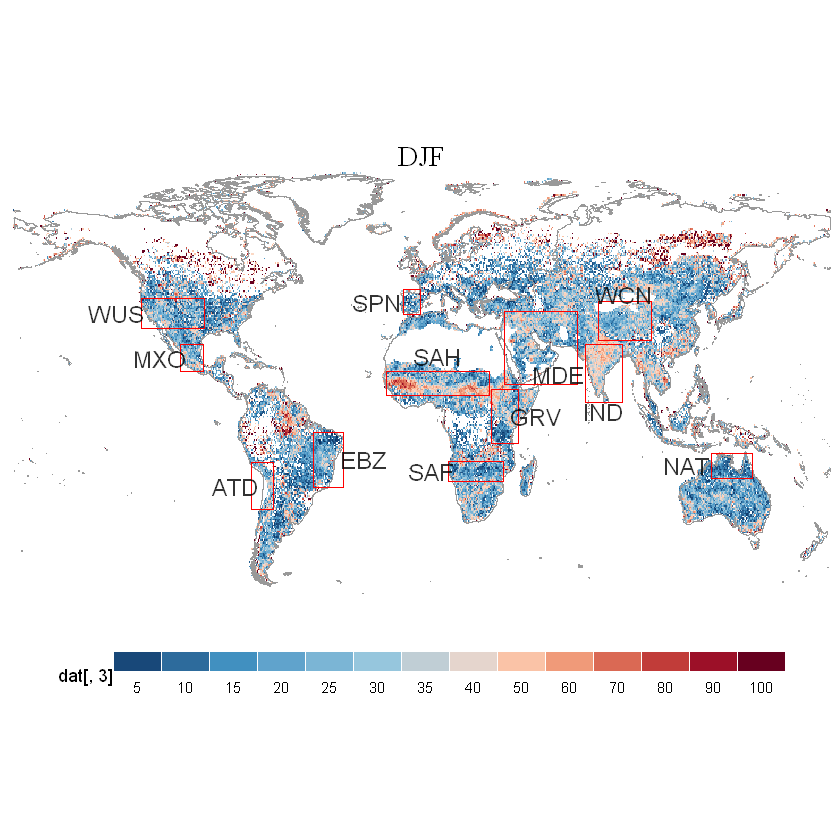

In [104]:
sea_fun(1)

In [105]:
p1=sea_fun(1)
p2=sea_fun(2)
p3=sea_fun(3)
p4=sea_fun(4)
pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture2\\")
pdf(paste0(pic_name,"3.season_change2.pdf"),width = 16, height =12)
ggpubr::ggarrange(p1,p4,p3,p2,ncol = 2, nrow =2,common.legend = T,legend = "bottom") 
dev.off()

OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.



OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.



OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.



OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.

Warning message:
"Removed 339 rows containing missing values (geom_tile)."
Warning message:
"Removed 339 rows containing missing values (geom_tile)."
Warning message:
"Removed 397 rows containing missing values (geom_tile)."
Warning message:
"Removed 388 rows containing missing values (geom_tile)."
Warning message:
"Removed 447 rows containing missing values (geom_tile)."


png 
  2

4.1骤旱四季的比例

In [192]:
sea_fun <- function(filename,lonlatname){
  load(filename)
  load(lonlatname) 
  #season_name <- c("SON","JJA","MAM","DJF")
  season_name <- c("DJF","SON","JJA","MAM")
  
  data1 <- rowSums(fd_month[,,1], na.rm = T)
  data2 <- rowSums(fd_month[,,2], na.rm = T)
  data3 <- rowSums(fd_month[,,3], na.rm = T)
  data4 <- rowSums(fd_month[,,4], na.rm = T)
  data5 <- data.frame(data1,data2,data3,data4)
  data5$data6 <- rowSums(data5,na.rm = T)   #所有事件的总和


  data5$number <- seq(1,dim(data5)[1],1)
  load("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number.RData") #添加干旱点
  data5 <-data5[-which(data5$number%in%arid_number3),-6]
  sea=sum(data5$data6,na.rm = T)
  

  data <- fd_month[,,1]
  data=as.data.frame(data)
  data$number <- seq(1,dim(data)[1],1)
  data <-data[-which(data$number%in%arid_number3),-41]
  occ_total_intensity = rowSums(data, na.rm = T)    #骤旱发生的数量
  sea1=sum(occ_total_intensity,na.rm = T)/sea
  
  

  data <- fd_month[,,2]
  data=as.data.frame(data)
  data$number <- seq(1,dim(data)[1],1)
  data <-data[-which(data$number%in%arid_number3),-41]
  occ_total_intensity = rowSums(data, na.rm = T)    #骤旱发生的数量
  sea2=sum(occ_total_intensity,na.rm = T)/sea
  
  
  data <- fd_month[,,3]
  data=as.data.frame(data)
  data$number <- seq(1,dim(data)[1],1)
  data <-data[-which(data$number%in%arid_number3),-41]
  occ_total_intensity = rowSums(data, na.rm = T)    #骤旱发生的数量
  sea3=sum(occ_total_intensity,na.rm = T)/sea
  
  data <- fd_month[,,4]
  data=as.data.frame(data)
  data$number <- seq(1,dim(data)[1],1)
  data <-data[-which(data$number%in%arid_number3),-41]
  occ_total_intensity = rowSums(data, na.rm = T)    #骤旱发生的数量
  sea4=sum(occ_total_intensity,na.rm = T)/sea
  
  sea5=c(sea1,sea2,sea3,sea4)
  return(sea5)
}

#ERA5-0.5
filename="H:\\NO.1 flash drought\\03data\\ERA5\\2.fd_result\\fd_characteristics_detrend.RData"
lonlatname="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData"
aa <- sea_fun(filename,lonlatname)
#ERA5-LAND-0.5
filename="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\fd_characteristics_detrend.RData"
lonlatname="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData"
bb <- sea_fun(filename,lonlatname)
# #GLEAM-0.5
filename="H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\fd_characteristics_detrend.RData"
lonlatname="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData"
cc <- sea_fun(filename,lonlatname)

aa
bb
cc
dd=data.frame(season_name,aa,bb,cc)
dd$avg=rowMeans(dd[,2:3])
dd

[1] 0.2638386 0.2405495 0.2189786 0.2766333

[1] 0.2734108 0.2357443 0.2243646 0.2664803

[1] 0.2617642 0.2362177 0.2298508 0.2721673

season_name,aa,bb,cc,avg
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
DJF,0.2638386,0.2734108,0.2617642,0.2686247
SON,0.2405495,0.2357443,0.2362177,0.2381469
JJA,0.2189786,0.2243646,0.2298508,0.2216716
MAM,0.2766333,0.2664803,0.2721673,0.2715568


5.强度平均分布（图4）

In [115]:
sea_fun=function(i){
  load("H:\\NO.1 flash drought\\03data\\data_GEE5\\intensity_mean_3data.RData")
  load("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number.RData") #添加干旱点
    dat$number <- seq(1,dim(dat)[1],1)
   dat <-dat[-which(dat$number%in%arid_number3),]
  intensity_name <- c("FD_1","FD_2","FD_3","FD_4")
  dat=dat[,c(1,2,(i+2))]
  dat=dat[dat[,3]!=0,]
  dat=dat[-which(is.na(dat[,3])),]
  
  #data11 <- dat[which(dat$intensity_total>20),]
  #dim(data11)[1]/dim(dat)[1]
  
  dat$FOC <- cut(dat[,3],breaks=c(0,10,20,30,40,50,60,70,80,90,101),
                 labels=c("10","20","30","40","50","60","70","80","90","100"))
  colour <- c("#67001f","#b2182b","#d6604d","#f4a582","#fddbc7","#92c5de","#4393c3","#053061")
  #colour <- c("#fff5f0","#fee0d2","#fcbba1","#fc9272","#fb6a4a","#ef3b2c","#cb181d","#a50f15","#67000d")
  #colour <- c("#762a83","#9970ab","#c2a5cf","#e7d4e8","#d9f0d3","#a6dba0","#5aae61","#1b7837")
  #colour <- c("#0000FF","#00FF00","#FFFF33","#FF0000","#FF00FF")
  #library(raster)
  library(rgdal)
  library(ggplot2)
  library(RColorBrewer)
  continent<-rgdal::readOGR('H:\\NO.1 flash drought\\02 地图文件\\continent shapefile\\continent.shp')
  p<- ggplot(dat,aes(x=lon,y=lat,fill=dat[,3]))+
    geom_tile()+#shape=15,size=0.2
    geom_polygon(data = fortify(continent),aes(x = long, y = lat, group = group), colour = "grey60",fill = NA,size=0.2) +
    #scale_fill_brewer(palette = "Paired")+#"Paired"
    #scale_fill_gradientn(colours= colour,breaks=c(0,3,6,9,12,15,18,21,24,27,30,33))+
    #scale_fill_gradientn(colours= colour,breaks=c(0,6,12,18,33))+
    #scale_fill_manual(values = colour)+
    #scale_colour_manual(values = colour)+
    #xlab('Longitude')+
    #ylab('Latitude')+
    scale_fill_gradientn(colours=rev(colour),breaks=c(0,5,10,15,20,25,30,35,40,50,60,70,80,90,100))+
    #labs(title =intensity_name[i],vjust=.5,family="Times New Roman")+  #"Spring""Summer""Autumn""Winter"colour = "",
    guides(fill=guide_legend(nrow=1,label.position = "bottom",keyheight =0.8,keywidth = 2,size=24) )+
    # geom_hline(aes(yintercept = 50),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    # geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    # geom_hline(aes(yintercept = -50),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  # geom_vline(aes(xintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  # geom_vline(aes(xintercept = -100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  # geom_vline(aes(xintercept = 100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  coord_fixed(1.3)+
    theme(panel.background = element_rect(fill = 'transparent',color ="transparent"),#black'
          panel.grid.minor = element_blank(),
          # axis.text = element_text(face='bold',colour='black',size=fontsize,hjust=.5),
          axis.text = element_blank(),
          # axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5),
          axis.title = element_blank(),
          axis.ticks = element_blank(),
          #axis.ticks.margin =element_blank(),
          strip.text = element_blank(),
          legend.position=c('none'),#'bottom'
          #legend.position=c('none'),
          legend.direction = c('horizontal'),
          legend.key = element_rect(fill = 'transparent'),
          legend.spacing.x = unit(0, 'cm'),
          legend.key.size = unit(0.7, "cm"),
          plot.title=element_text(hjust=0.5,vjust = -10))+
    scale_y_continuous(expand = c(0,0))+#这个可以去掉与X轴间隙
    scale_x_continuous(expand = c(0,0))+#这个可以去掉与Y轴间隙
    ylim(-60,90)+
    annotate("text",x=0,y=90,label=intensity_name[i],size=6,family="serif")
    region_name <- c("WUS","MXO","EBZ","ATD","SPN","SAH","GRV","SAF","MDE","WCN","IND","NAT")
  x=c(-135,-115.5,-25.45,-82.35,-19.7,6.75,50.3,3.75,60.05,89.2,79.9,116.4)
  y=c(36.5,21.35,-13.1,-22,40.35,21.8,1.6,-17.15,15.7,43.1,3.3,-15.05)
  text_size=5
  text_colur="black"
  p+annotate("rect",ymin=31.5,ymax =41.5 ,xmin =-123.9 ,xmax =-96.1 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=16.7,ymax =26 ,xmin =-106.5 ,xmax =-96.5 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=-22.4,ymax =-3.8 ,xmin =-48 ,xmax =-34.9 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=-30.1,ymax =-13.9 ,xmin =-75.2 ,xmax =-65.5 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=36.1,ymax =44.6 ,xmin =-8.6 ,xmax =-0.8 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=17.0,ymax =8.6 ,xmin =-16 ,xmax =29.5 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=-7.6,ymax =10.8 ,xmin =30.5 ,xmax =42.1 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=-20.5,ymax =-13.8 ,xmin =11.6 ,xmax =35.9 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=12.3,ymax =37.1 ,xmin =36 ,xmax =68.1 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=27.5,ymax =40.7 ,xmin =77.4 ,xmax =101 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=6.5,ymax =26.1 ,xmin =71.7 ,xmax =88.1 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=-19.3,ymax =-10.8 ,xmin =127.3 ,xmax =145.5 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("text",y=y[1],x=x[1],label=region_name[1],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[2],x=x[2],label=region_name[2],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[3],x=x[3],label=region_name[3],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[4],x=x[4],label=region_name[4],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[5],x=x[5],label=region_name[5],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[6],x=x[6],label=region_name[6],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[7],x=x[7],label=region_name[7],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[8],x=x[8],label=region_name[8],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[9],x=x[9],label=region_name[9],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[10],x=x[10],label=region_name[10],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[11],x=x[11],label=region_name[11],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[12],x=x[12],label=region_name[12],alpha=.8,size=text_size,color=text_colur)
  
   #return(p)
  #dev.off()
}

OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.

Warning message:
"Removed 693 rows containing missing values (geom_tile)."


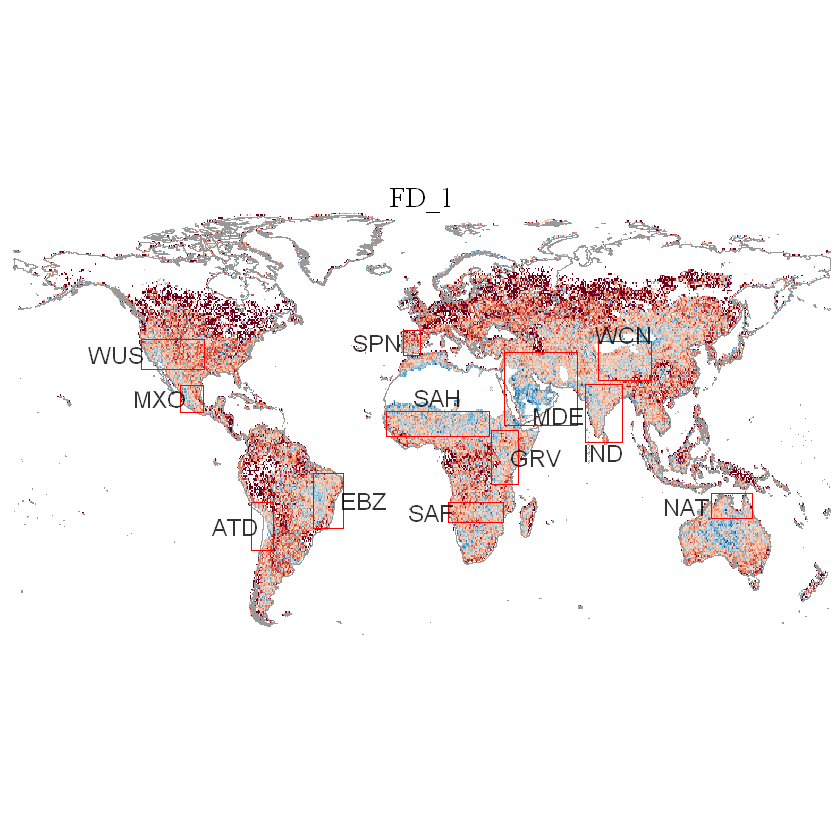

In [116]:
p1=sea_fun(1)
p1

In [117]:
p2=sea_fun(2)
p3=sea_fun(3)
p4=sea_fun(4)
pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture2\\")
pdf(paste0(pic_name,"4.intensity_change2.pdf"),width = 16, height = 12)
ggpubr::ggarrange(p1,p2,p3,p4,ncol = 2, nrow =2,common.legend = T,legend = "bottom") 
dev.off()

OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.



OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.



OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.

Warning message:
"Removed 693 rows containing missing values (geom_tile)."
Warning message:
"Removed 693 rows containing missing values (geom_tile)."
Warning message:
"Removed 380 rows containing missing values (geom_tile)."
Warning message:
"Removed 214 rows containing missing values (geom_tile)."
Warning message:
"Removed 120 rows containing missing values (geom_tile)."


png 
  2

6.1骤旱强度的占比

In [193]:
int_fun <- function(filename,lonlatname){
    load(filename)
    load(lonlatname) 
  intensity_name <- c("FD_1 Slight flash drought","FD_2 Moderate flash drought",
                      "FD_3 Severe flash drought","FD_4 Extreme flash drought")
  
  data1 <- rowSums(fd_class[,,1], na.rm = T)
  data2 <- rowSums(fd_class[,,2], na.rm = T)
  data3 <- rowSums(fd_class[,,3], na.rm = T)
  data4 <- rowSums(fd_class[,,4], na.rm = T)
  data5 <- data.frame(data1,data2,data3,data4)
  data5$data6 <- rowSums(data5,na.rm = T)

  data5$number <- seq(1,dim(data5)[1],1)
  load("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number.RData") #添加干旱点
  data5 <-data5[-which(data5$number%in%arid_number3),-6]
  sea=sum(data5$data6,na.rm = T)
  
  data <-fd_class[,,1]
  data=as.data.frame(data)
  data$number <- seq(1,dim(data)[1],1)
  data <-data[-which(data$number%in%arid_number3),-41]
  occ_total_intensity = rowSums(data, na.rm = T)    #骤旱发生的数量
  sea1=sum(occ_total_intensity,na.rm = T)/sea
  
  
  data <- fd_class[,,2]
  data=as.data.frame(data)
  data$number <- seq(1,dim(data)[1],1)
  data <-data[-which(data$number%in%arid_number3),-41]
  occ_total_intensity = rowSums(data, na.rm = T)    #骤旱发生的数量
  sea2=sum(occ_total_intensity,na.rm = T)/sea
  
  
  data <- fd_class[,,3]
  data=as.data.frame(data)
  data$number <- seq(1,dim(data)[1],1)
  data <-data[-which(data$number%in%arid_number3),-41]
  occ_total_intensity = rowSums(data, na.rm = T)    #骤旱发生的数量
  sea3=sum(occ_total_intensity,na.rm = T)/sea
  
  data <- fd_class[,,4]
  data=as.data.frame(data)
  data$number <- seq(1,dim(data)[1],1)
  data <-data[-which(data$number%in%arid_number3),-41]
  occ_total_intensity = rowSums(data, na.rm = T)    #骤旱发生的数量
  sea4=sum(occ_total_intensity,na.rm = T)/sea
  
  sea5=c(sea1,sea2,sea3,sea4)

  return(sea5)
}

#ERA5-0.5
filename="H:\\NO.1 flash drought\\03data\\ERA5\\2.fd_result\\fd_characteristics_detrend.RData"
lonlatname="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData"
aa <- int_fun(filename,lonlatname)
#ERA5-LAND-0.5
filename="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\fd_characteristics_detrend.RData"
lonlatname="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData"
bb <- int_fun(filename,lonlatname)
# #GLEAM-0.5
filename="H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\fd_characteristics_detrend.RData"
lonlatname="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData"
cc <- int_fun(filename,lonlatname)

aa
bb
cc
dd=data.frame(season_name,aa,bb,cc)
dd$avg=rowMeans(dd[,2:3])
dd

[1] 0.50762601 0.28523391 0.13894483 0.06819526

[1] 0.50963335 0.28719689 0.13769188 0.06547788

[1] 0.3843912 0.3015204 0.1925909 0.1214975

season_name,aa,bb,cc,avg
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
DJF,0.50762601,0.50963335,0.3843912,0.50862968
SON,0.28523391,0.28719689,0.3015204,0.28621540
JJA,0.13894483,0.13769188,0.1925909,0.13831836
MAM,0.06819526,0.06547788,0.1214975,0.06683657


In [194]:
50.9/6.7

[1] 7.597015

In [205]:
fun=function(i){
load("H:\\NO.1 flash drought\\03data\\data_GEE5\\intensity_mean_3data.RData")
load("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number.RData") #添加干旱点
dat$number <- seq(1,dim(dat)[1],1)
dat <-dat[-which(dat$number%in%arid_number3),]
#head(dat)
  intensity_name <- c("FD_1","FD_2","FD_3","FD_4")
  dat=dat[,c(1,2,(i+2))]
  dat=dat[dat[,3]!=0,]
  dat=dat[-which(is.na(dat[,3])),]
  #head(dat)
  data11 <- dat[which(dat[,3]>50),]
  #head(data11)
  kk=dim(data11)[1]/dim(dat)[1]
  return(kk)
}
fun(1)
fun(2)
fun(3)
fun(4)

[1] 0.5305222

[1] 0.08831649

[1] 0.01101503

[1] 0.003153258

6.持续时间（图5）

In [129]:
duration_occ=function(file_name,lonlat_name){
load(file_name)
load(lonlat_name)

occ_dur = rowMeans(occ_ave_dur, na.rm = T)    #骤旱的持续时间
#to_raster(occ_dur  ,  filename = "occ_dur_Christian")
dat = data.frame(x=grid2$lon, y=grid2$lat, z=occ_dur)#[(720*5*18+1):(720*5*19)]
names(dat)=c("lon","lat","occ_dur")

load("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number.RData") #添加干旱点
    dat$number <- seq(1,dim(dat)[1],1)
   dat <-dat[-which(dat$number%in%arid_number3),]  
   
data <- na.omit(dat)
duration_mean=mean(data$occ_dur)
library(raster)
library(rgdal)
library(ggplot2)
continent<-rgdal::readOGR('H:\\NO.1 flash drought\\02 地图文件\\continent shapefile\\continent.shp')
#continent<-rgdal::readOGR('H:\\NO.1 flash drought\\02 地图文件\\world map\\TM_WORLD_BORDERS-0.3.shp')
fontsize=10
data$dur<-cut(data$occ_dur,breaks=c(5,6,7,8,9,10,11,12,20,25,30),
labels=c("6","7","8","9","10","11","12","20","25","30"))#,
#)
#colour <- c("#ffffcc","#ffeda0","#fed976","#feb24c","#fd8d3c","#fc4e2a","#e31a1c","#bd0026","#800026")
colour <- c("#ffffd9","#edf8b1","#c7e9b4","#7fcdbb","#41b6c4","#1d91c0","#225ea8","#253494","#081d58","#08306b")
# colour <- c("#fff5f0","#fee0d2","#fcbba1","#fc9272","#fb6a4a","#ef3b2c",
# "#cb181d","#a50f15","#67000d","orange")
#colour <- c("#67001f","#b2182b","#d6604d","#f4a582","#fddbc7","#92c5de","#4393c3","#053061")
p=ggplot()+
  geom_hline(aes(yintercept = 60),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = 30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = -30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = -100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = 100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_tile(data = data,aes(x=lon,y=lat,fill=dur))+
  geom_polygon(data = fortify(continent),aes(x = long, y = lat, group = group), colour ="grey60" ,fill = NA,size=0.1) + #
  theme(panel.background = element_rect(fill = 'transparent',color = 'black'),
        panel.grid.minor = element_blank(),
        axis.text = element_text(colour='black',size=fontsize,hjust=.5),
        #axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5),
        axis.title=element_blank(),
        legend.position=c('right'),
        legend.direction = c('vertical'),
        legend.key = element_rect(fill = 'transparent'),
        #legend.spacing.x = unit(0, 'cm'),
       # legend.title = element_blank())+
  legend.title = element_text(size = fontsize,vjust=0.5,hjust=0.5))+#angle=90
  #legend.key.size = unit(0.7, "cm"))+
  #scale_fill_brewer(palette ="YlOrRd")+
  #scale_fill_distiller(palette = "YlOrBr")+
  #scale_fill_gradientn(colours= colour)+#,breaks=c(6,7,8,9,10,11,38)
  scale_fill_manual(values = colour)+
  # scale_fill_gradientn(colours=rev(colour),
  #            breaks=c(5,6,7,8,9,10,11,12,20,25,30))+
  #scale_fill_gradientn(colours =rev(colorspacH::diverge_hcl(7)),breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
  # scico::scale_fill_scico(palette = "lajolla",breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
  labs(fill="Pentad")+   #设置图例标题
  coord_fixed(1.3)+
  scale_y_continuous(breaks=c(-30,0,30,60),labels=c("30°S","0°","30°N","60°N"),limits =c(-60,90),expand = c(0,0))+
  scale_x_continuous(breaks=c(-150,-100,-50,0,50,100,150),labels=c("150°W","100°W","50°W","0°","50°E","100°E","150°E"),expand = c(0,0))+
  #ylim(-60,90)+
  guides(fill=guide_legend(ncol=1,label.position = "right",keyheight =1,keywidth = 0.5) 
  )#+  #图例分为几行或者几列展示
  region_name <- c("WUS","MXO","EBZ","ATD","SPN","SAH","GRV","SAF","MDE","WCN","IND","NAT")
  x=c(-135,-115.5,-25.45,-82.35,-19.7,6.75,50.3,3.75,60.05,89.2,79.9,116.4)
  y=c(36.5,21.35,-13.1,-22,40.35,21.8,1.6,-17.15,15.7,43.1,3.3,-15.05)
  text_size=3
  text_colur="black"
  p+annotate("rect",ymin=31.5,ymax =41.5 ,xmin =-123.9 ,xmax =-96.1 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=16.7,ymax =26 ,xmin =-106.5 ,xmax =-96.5 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=-22.4,ymax =-3.8 ,xmin =-48 ,xmax =-34.9 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=-30.1,ymax =-13.9 ,xmin =-75.2 ,xmax =-65.5 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=36.1,ymax =44.6 ,xmin =-8.6 ,xmax =-0.8 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=17.0,ymax =8.6 ,xmin =-16 ,xmax =29.5 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=-7.6,ymax =10.8 ,xmin =30.5 ,xmax =42.1 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=-20.5,ymax =-13.8 ,xmin =11.6 ,xmax =35.9 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=12.3,ymax =37.1 ,xmin =36 ,xmax =68.1 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=27.5,ymax =40.7 ,xmin =77.4 ,xmax =101 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=6.5,ymax =26.1 ,xmin =71.7 ,xmax =88.1 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("rect",ymin=-19.3,ymax =-10.8 ,xmin =127.3 ,xmax =145.5 ,size=0.5,color = 'red',fill='transparent' )+
    annotate("text",y=y[1],x=x[1],label=region_name[1],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[2],x=x[2],label=region_name[2],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[3],x=x[3],label=region_name[3],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[4],x=x[4],label=region_name[4],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[5],x=x[5],label=region_name[5],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[6],x=x[6],label=region_name[6],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[7],x=x[7],label=region_name[7],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[8],x=x[8],label=region_name[8],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[9],x=x[9],label=region_name[9],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[10],x=x[10],label=region_name[10],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[11],x=x[11],label=region_name[11],alpha=.8,size=text_size,color=text_colur)+
    annotate("text",y=y[12],x=x[12],label=region_name[12],alpha=.8,size=text_size,color=text_colur)
  
  # xlab('Longitude')+
# ylab('Latitude')
#return(duration_mean)
}

In [131]:
#综合
file_name5= "H:\\NO.1 flash drought\\03data\\data_GEE5\\fd_characteristics_detrend.RData"
lonlat_name5="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData"
#year_occ(file_name1,lonlat_name1)
#year_occ(file_name3,lonlat_name3)
#year_occ(file_name4,lonlat_name4)
pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture2\\")
pdf(paste0(pic_name,"5.duration2.pdf"),width = 8, height = 6)
duration_occ(file_name5,lonlat_name5)
dev.off()

OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Warning message:
"Removed 731 rows containing missing values (geom_tile)."


png 
  2

MK分析

In [133]:
mmkTrend <-
  function(x, ci = .90) {
    x = x
    z = NULL
    z0 = NULL
    pval = NULL
    pval0 = NULL
    S = 0
    Tau = NULL
    essf = NULL
    ci = ci
    if (is.vector(x) == FALSE) {
      stop("Input data must be a vector")
    }
    if (any(is.finite(x) == FALSE)) {
      x[-c(which(is.finite(x) == FALSE))] -> x
      warning("The input vector contains non-finite numbers. An attempt was made to remove them")
    }
    n <- length(x)
    for (i in 1:(n-1)) {
      for (j in (i+1):n) {
        S = S + sign(x[j]-x[i])
      }
    }
    acf(rank(lm(x ~ I(1:n))$resid), lag.max=(n-1), plot=FALSE)$acf[-1] -> ro
    qnorm((1+ci)/2)/sqrt(n) -> sig
    rep(NA,length(ro)) -> rof
    for (i in 1:(length(ro))) {
      if(ro[i] > sig || ro[i] < -sig) {
        rof[i] <- ro[i]
      } else {
        rof[i] = 0
      }
    }
    2 / (n*(n-1)*(n-2)) -> cte
    ess=0
    for (i in 1:(n-1)) {          
      ess = ess + (n-i)*(n-i-1)*(n-i-2)*rof[i]
    }
    essf = 1 + ess*cte
    var.S = n*(n-1)*(2*n+5)*(1/18) 
    if(length(unique(x)) < n) {
      unique(x) -> aux
      for (i in 1:length(aux)) {
        length(which(x == aux[i])) -> tie
        if (tie > 1) {
          var.S = var.S - tie*(tie-1)*(2*tie+5)*(1/18)  
        }
      }
    }
    VS = var.S * essf            
    if (S == 0) {
      z = 0
      z0 = 0
    }
    if (S > 0) {
      z = (S-1)/sqrt(VS) 
      z0 = (S-1)/sqrt(var.S)
    } else {
      z = (S+1)/sqrt(VS) 
      z0 = (S+1)/sqrt(var.S)
    }      
    pval = 2*pnorm(-abs(z))
    pval0 = 2*pnorm(-abs(z0)) 
    Tau = S/(.5*n*(n-1))
    rep(NA, times=(n^2-n)/2) -> V
    k = 0
    for (i in 2:n) {
      for (j in 1:i) {
        k = k+1
        V[k] = (x[i]-x[j])/(i-j)
        
      }
    }
    median(na.omit(V)) -> slp
    return(list("Z" = z0, "p.value" = pval0, "Zc" = z, "Corrected p.value" = pval, "tau" = Tau, "N/N*s" = essf, "Sen's Slope" = slp))
  }


7.骤旱面积占比时间序列（附图3+图2）

7.1 全球（附图3）

In [64]:
#全球====================
data_name=c("GLEAM","ERA5LAND","ERA5")
area_change=function(file_name,lonlat_name,j){
  load(file_name)
  load(lonlat_name)
  #load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number.RData"))
  load("H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\lon_lat_area.RData")  #0.5格点的面积
  #occ_total = rowSums(occ_number, na.rm = T)
  dat = data.frame(x=grid2$lon, y=grid2$lat, z= occ_number)#[(720*5*18+1):(720*5*19)]
  names(dat)=c("lon","lat")
  #data <- dat[-which(dat$occ_number==0),]
  data1 <- merge(dat,lon_lat_area,by=c("lon","lat")) 
 
  fun <- function(data){
    data[-which(is.na(data))]=1 
    return(data)
  } 
  #fun(data)
  data2 <- apply(data1[,3:42],1,fun)
  #data3 <- data.frame(t(data2),data1[,43])
  data3 <- t(data2)*data1[,43]
  data3 <- as.data.frame(data3)

  data3$number <- seq(1,dim(data3)[1],1)
  load("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number.RData") #添加干旱点
  data3 <-data3[-which(data3$number%in%arid_number3),-41]
  
  data4 <- apply(data3,2,sum,na.rm=T)
  data5 <-as.numeric((data4*100)/sum(data1[,43]))
  
  year=1981:2020
  
  occ_area <- data.frame(year,data5)
  
  #计算年际变化率
  change_fun <- function(i,data){
    x=data[i,2]
    y=data[i+1,2]
    z=((y-x)*100)/x
    return(z)
  }
  
  change_data <- NULL
  for(i in 1:39){
    change_data[i+1]<- change_fun(i,occ_area)
    #print(paste0("OK_",i))
  }
  
  occ_area$change <- change_data
  
  colnames(occ_area) <- c("year","area","change")  
  save(occ_area,file = paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a4_occ_area_acount_",data_name[j],".RData"))
  return(occ_area)
}


In [ ]:
file_name="H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\fd_characteristics_detrend.RData"
lonlat_name="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData"
area_change(file_name,lonlat_name,1)
file_name2="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\fd_characteristics_detrend.RData"
area_change(file_name2,lonlat_name,2)
file_name3="H:\\NO.1 flash drought\\03data\\ERA5\\2.fd_result\\fd_characteristics_detrend.RData"
area_change(file_name3,lonlat_name,3)

In [68]:
  j=1
load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a4_occ_area_acount_",data_name[j],".RData"))
  aa=occ_area[,2]
  j=2
  load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a4_occ_area_acount_",data_name[j],".RData"))
  bb=occ_area[,2]
  j=3
  load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a4_occ_area_acount_",data_name[j],".RData"))
  cc=occ_area[,2]

load(file="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData")

fd_data <- data.frame(aa,bb,cc)
fd_data$MEAN <- apply(fd_data,1,mean,na.rm=T)
fd_data$SD <- apply(fd_data[,1:3],1,sd,na.rm=T)
fd_data$CV <- (fd_data$SD/fd_data$MEAN)

 save(fd_data,file = paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a5_occ_area_acount_sd_cv",".RData"))
# return(j)

7.1.1 1981-2020


Call:
lm(formula = dat$MEAN ~ dat$year)

Coefficients:
(Intercept)     dat$year  
   45.51788     -0.02132  



Call:
lm(formula = dat$aa ~ dat$year)

Coefficients:
(Intercept)     dat$year  
  18.574055    -0.007637  



Call:
lm(formula = dat$bb ~ dat$year)

Coefficients:
(Intercept)     dat$year  
    59.4001      -0.0284  



Call:
lm(formula = dat$cc ~ dat$year)

Coefficients:
(Intercept)     dat$year  
   58.57948     -0.02794  


40 
-0.8316373

40 
-0.2978469

40 
-1.107534

40 
-1.089531

40 
-0.8316373

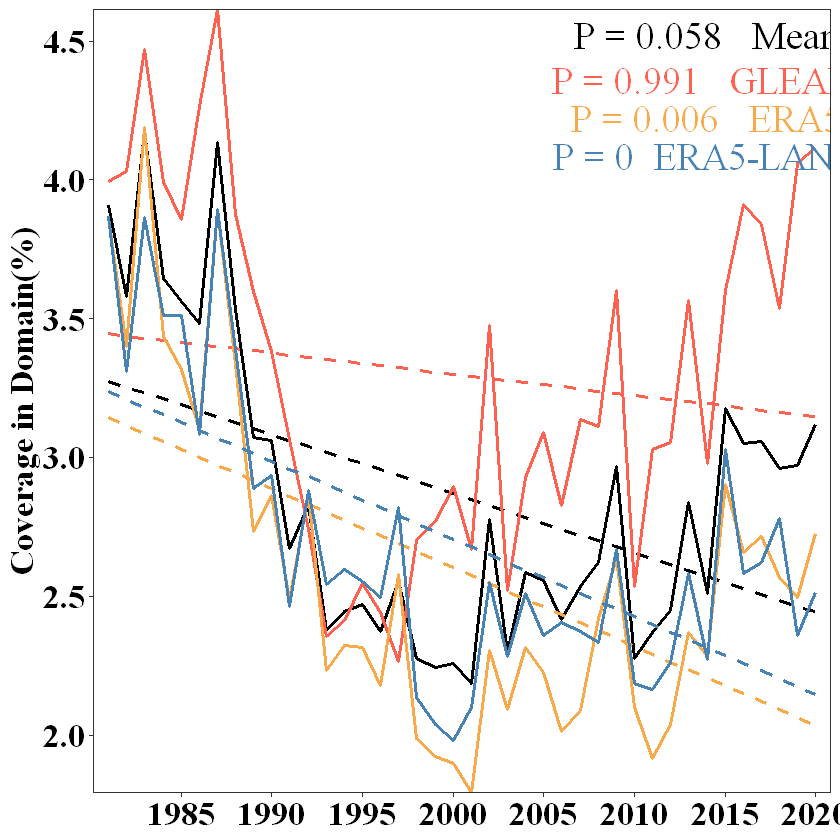

In [140]:
load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a5_occ_area_acount_sd_cv",".RData"))

year <- 1981:2020
fun=function(data){
  ab <- data[which.max(data)]
  return(ab)
}
fd_data$msi <- fd_data$MEAN-fd_data$SD
fd_data$msa <- fd_data$MEAN+fd_data$SD
zz=apply(fd_data[1:4],2,fun)
ymax <- zz[which.max(zz)]
dat <-data.frame(year,fd_data)

#构建置信区间
m=lm(dat$MEAN~dat$year)
m
wx = par("usr")[1:2]
new.x = seq(wx[1],wx[2],len=40)
pred = predict(m, new=data.frame(x=new.x), interval="conf")

trend=pred[,"fit"][40]-pred[,"fit"][1]
slop = mmkTrend(dat$MEAN)$`Sen's Slope`
p_value=round(mmkTrend(dat$MEAN)$p.value,3)

m1=lm(dat$aa~dat$year)
m1
wx1 = par("usr")[1:2]
new.x1 = seq(wx1[1],wx1[2],len=40)
pred1 = predict(m1, new=data.frame(x=new.x1), interval="conf")

trend1=pred1[,"fit"][40]-pred1[,"fit"][1]
slop1 = mmkTrend(dat$aa)$`Sen's Slope`
p_value1=round(mmkTrend(dat$aa)$p.value,3)

m2=lm(dat$bb~dat$year)
m2
wx2 = par("usr")[1:2]
new.x2 = seq(wx2[1],wx2[2],len=40)
pred2 = predict(m2, new=data.frame(x=new.x2), interval="conf")

trend2=pred2[,"fit"][40]-pred2[,"fit"][1]
slop2 = mmkTrend(dat$bb)$`Sen's Slope`
p_value2=round(mmkTrend(dat$bb)$p.value,3)

m3=lm(dat$cc~dat$year)
m3
wx3 = par("usr")[1:2]
new.x3 = seq(wx3[1],wx3[2],len=40)
pred3 = predict(m3, new=data.frame(x=new.x3), interval="conf")

trend3=pred3[,"fit"][40]-pred3[,"fit"][1]
slop3 = mmkTrend(dat$cc)$`Sen's Slope`
p_value3=round(mmkTrend(dat$cc)$p.value,3)
# data1 <- data.frame(dat,pred)

linekind=2
lineaa=1
wid=1
fontsize=20
size_p=8
library(ggplot2)
p=ggplot(dat)+
  #geom_point(pch=16,col="steelblue")+
  geom_line(aes(x=year,y=MEAN),col="black",linetype=lineaa,lwd=wid)+
  geom_line(aes(x=year,y=pred[,"fit"]),lwd=1,col="black",linetype=linekind)+
  geom_line(aes(x=year,y=aa),col="#ff6150",linetype=lineaa,lwd=wid)+  #GLEAM
  geom_line(aes(x=year,y=pred1[,"fit"]),lwd=1,col="#ff6150",linetype=linekind)+
  geom_line(aes(x=year,y=bb),col="#f8aa4b",linetype=lineaa,lwd=wid)+  #era5
  geom_line(aes(x=year,y=pred2[,"fit"]),lwd=1,col="#f8aa4b",linetype=linekind)+
  geom_line(aes(x=year,y=cc),col="steelblue",linetype=lineaa,lwd=wid)+
  geom_line(aes(x=year,y=pred3[,"fit"]),lwd=1,col="steelblue",linetype=linekind)+
  # geom_line(aes(x=year,y=pred[,"lwr"]),lty=3)+
  # geom_line(aes(x=year,y=pred[,"upr"]),lty=3)+
  #geom_ribbon(aes(ymin=dat$msi,ymax=dat$msa),alpha=0.4,fill=blues9[3])+
  ylab("Coverage in Domain(%)")+
  #xlim(1980,2018)+ #xiugai
  #xlab("Year")+
  guides(fill=guide_legend(label.theme = element_text(family="serif")))+
  #ggtitle("Spring")+    #
  #scale_fill_brewer(palette="Set3")+
  scale_x_continuous(breaks=seq(1980,2020,5),expand = c(0.02,0.05))+#这个可以去掉与Y轴间隙,
  scale_y_continuous(breaks=seq(1,5,0.5),expand = c(0,0))+
  theme_bw()+
  theme(#axis.title.x = element_blank(),
    legend.position = c(0.85,0.85),
    #legend.title = element_blank(),
    legend.text = element_text(face='bold',colour='black',size=fontsize,hjust=0),
    legend.background = element_rect(fill = 'transparent'),#, colour = 'black'
    axis.text = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
    axis.title.y = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
    axis.title.x = element_blank(),
    plot.title=element_text(hjust=0.5),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank()
  )+
  annotate("text",parse=F,label=paste0("P = ",p_value,"   Mean"),x=2014,y=ymax*(1-0.02),colour="black",size=size_p,family="serif")+
  annotate("text",parse=F,label=paste0("P = ",p_value1,"   GLEAM"),x=2014,y=ymax*(1-0.055),colour="#ff6150",size=size_p,family="serif")+
  annotate("text",parse=F,label=paste0("P = ",p_value2,"   ERA5"),x=2014,y=ymax*(1-0.085),colour="#f8aa4b",size=size_p,family="serif")+
  annotate("text",parse=F,label=paste0("P = ",p_value3,"  ERA5-LAND"),x=2014,y=ymax*(1-0.115),colour="steelblue",size=size_p,family="serif")
  #annotate("text",parse=F,label="Global",x=1985,y=ymax*(1-0.00001),colour="black",size=9,family="serif")
#   return(list(p,trend,slop,p_value))
# }

p
trend
trend1
trend2
trend3
(trend+trend1+trend2+trend3)/4

In [141]:
pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture2\\2.year of acount area four data")
pdf(paste0(pic_name,".pdf"),width = 8, height = 6)
 p
 dev.off()

png 
  2

7.1.2 2000-2020


Call:
lm(formula = dat$MEAN ~ dat$year)

Coefficients:
(Intercept)     dat$year  
  -72.32236      0.03731  



Call:
lm(formula = dat$aa ~ dat$year)

Coefficients:
(Intercept)     dat$year  
 -111.82919      0.05726  



Call:
lm(formula = dat$bb ~ dat$year)

Coefficients:
(Intercept)     dat$year  
  -68.11973      0.03504  



Call:
lm(formula = dat$cc ~ dat$year)

Coefficients:
(Intercept)     dat$year  
  -37.01817      0.01962  


21 
0.7461488

21 
1.145172

21 
0.7008122

21 
0.3924618

21 
0.7461488

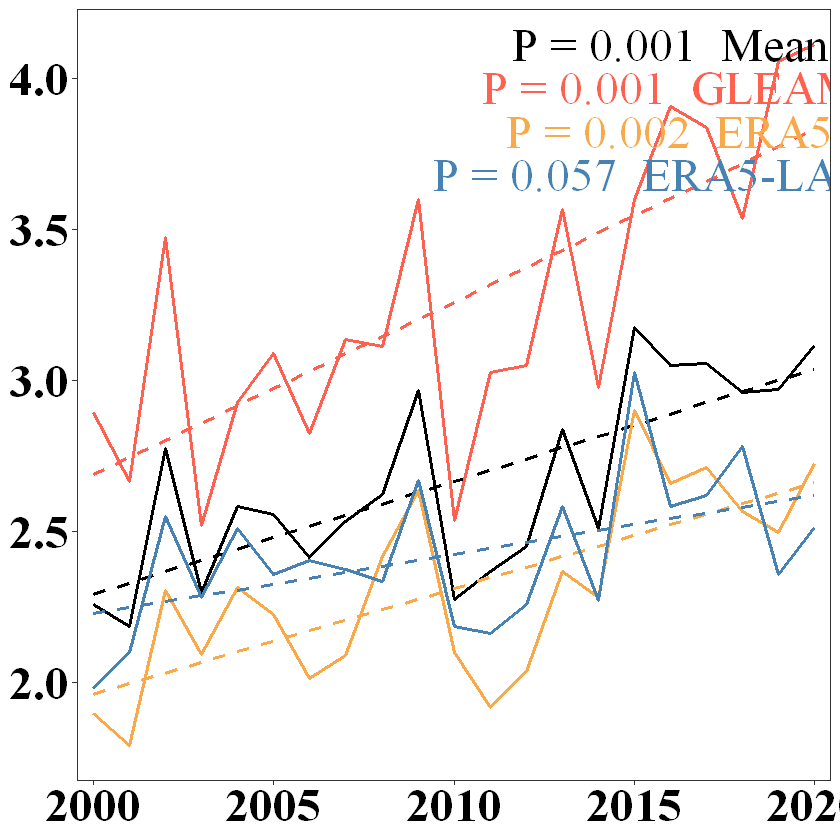

In [142]:
#2000-2020年
load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a5_occ_area_acount_sd_cv",".RData"))

fd_data <- fd_data[20:40,]
year <- 2000:2020
fun=function(data){
  ab <- data[which.max(data)]
  return(ab)
}
fd_data$msi <- fd_data$MEAN-fd_data$SD
fd_data$msa <- fd_data$MEAN+fd_data$SD
zz=apply(fd_data[1:4],2,fun)
ymax <- zz[which.max(zz)]
dat <-data.frame(year,fd_data)

#构建置信区间
m=lm(dat$MEAN~dat$year)
m
wx = par("usr")[1:2]
new.x = seq(wx[1],wx[2],len=21)
pred = predict(m, new=data.frame(x=new.x), interval="conf")

trend=pred[,"fit"][21]-pred[,"fit"][1]
slop = mmkTrend(dat$MEAN)$`Sen's Slope`
p_value=round(mmkTrend(dat$MEAN)$p.value,3)

m1=lm(dat$aa~dat$year)
m1
wx1 = par("usr")[1:2]
new.x1 = seq(wx1[1],wx1[2],len=21)
pred1 = predict(m1, new=data.frame(x=new.x1), interval="conf")

trend1=pred1[,"fit"][21]-pred1[,"fit"][1]
slop1 = mmkTrend(dat$aa)$`Sen's Slope`
p_value1=round(mmkTrend(dat$aa)$p.value,3)

m2=lm(dat$bb~dat$year)
m2
wx2 = par("usr")[1:2]
new.x2 = seq(wx2[1],wx2[2],len=21)
pred2 = predict(m2, new=data.frame(x=new.x2), interval="conf")

trend2=pred2[,"fit"][21]-pred2[,"fit"][1]
slop2 = mmkTrend(dat$bb)$`Sen's Slope`
p_value2=round(mmkTrend(dat$bb)$p.value,3)

m3=lm(dat$cc~dat$year)
m3
wx3 = par("usr")[1:2]
new.x3 = seq(wx3[1],wx3[2],len=21)
pred3 = predict(m3, new=data.frame(x=new.x3), interval="conf")

trend3=pred3[,"fit"][21]-pred3[,"fit"][1]
slop3 = mmkTrend(dat$cc)$`Sen's Slope`
p_value3=round(mmkTrend(dat$cc)$p.value,3)
# data1 <- data.frame(dat,pred)

linekind=2
lineaa=1
wid=1
fontsize=28
size_p=10
library(ggplot2)
p1=ggplot(dat)+
  #geom_point(pch=16,col="steelblue")+
  geom_line(aes(x=year,y=MEAN),col="black",linetype=lineaa,lwd=wid)+
  geom_line(aes(x=year,y=pred[,"fit"]),lwd=1,col="black",linetype=linekind)+
  geom_line(aes(x=year,y=aa),col="#ff6150",linetype=lineaa,lwd=wid)+  #GLEAM
  geom_line(aes(x=year,y=pred1[,"fit"]),lwd=1,col="#ff6150",linetype=linekind)+
  geom_line(aes(x=year,y=bb),col="#f8aa4b",linetype=lineaa,lwd=wid)+  #era5
  geom_line(aes(x=year,y=pred2[,"fit"]),lwd=1,col="#f8aa4b",linetype=linekind)+
  geom_line(aes(x=year,y=cc),col="steelblue",linetype=lineaa,lwd=wid)+
  geom_line(aes(x=year,y=pred3[,"fit"]),lwd=1,col="steelblue",linetype=linekind)+
  # geom_line(aes(x=year,y=pred[,"lwr"]),lty=3)+
  # geom_line(aes(x=year,y=pred[,"upr"]),lty=3)+
  #geom_ribbon(aes(ymin=dat$msi,ymax=dat$msa),alpha=0.4,fill=blues9[3])+
  ylab("Coverage in Domain(%)")+
  #xlim(1980,2018)+ #xiugai
  #xlab("Year")+
  guides(fill=guide_legend(label.theme = element_text(family="serif")))+
  #ggtitle("Spring")+    #
  #scale_fill_brewer(palette="Set3")+
  scale_x_continuous(breaks=seq(1980,2020,5),expand = c(0.02,0.05))+#这个可以去掉与Y轴间隙,
  #scale_y_continuous(breaks=seq(-25,40,5),expand = c(0,1))+
  theme_bw()+
  theme(#axis.title.x = element_blank(),
    legend.position = c(0.85,0.85),
    #legend.title = element_blank(),
    legend.text = element_text(face='bold',colour='black',size=fontsize,hjust=0),
    legend.background = element_rect(fill = 'transparent'),#, colour = 'black'
    axis.text = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
    #axis.title.y = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
    axis.title.y = element_blank(),
    axis.title.x = element_blank(),
    plot.title=element_text(hjust=0.5),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank()
  )+
  annotate("text",parse=F,label=paste0("P = ",p_value,"  Mean"),x=2016,y=ymax*(1-0.00001),colour="black",size=size_p,family="serif")+
  annotate("text",parse=F,label=paste0("P = ",p_value1,"  GLEAM"),x=2016,y=ymax*(1-0.035),colour="#ff6150",size=size_p,family="serif")+
  annotate("text",parse=F,label=paste0("P = ",p_value2,"  ERA5"),x=2016,y=ymax*(1-0.07),colour="#f8aa4b",size=size_p,family="serif")+
  annotate("text",parse=F,label=paste0("P = ",p_value3,"  ERA5-LAND"),x=2016,y=ymax*(1-0.105),colour="steelblue",size=size_p,family="serif")
#annotate("text",parse=F,label="Global",x=1985,y=ymax*(1-0.00001),colour="black",size=9,family="serif")
#   return(list(p,trend,slop,p_value))
# }
p1

trend
trend1
trend2
trend3
(trend+trend1+trend2+trend3)/4

In [143]:
pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture2\\2.year of acount area four data")
pdf(paste0(pic_name,"2000-2020.pdf"),width = 8, height = 6)
 p1
 dev.off()

png 
  2

7.1.3 1981-1999


Call:
lm(formula = dat$MEAN ~ dat$year)

Coefficients:
(Intercept)     dat$year  
   216.3522      -0.1072  



Call:
lm(formula = dat$aa ~ dat$year)

Coefficients:
(Intercept)     dat$year  
   247.4491      -0.1227  



Call:
lm(formula = dat$bb ~ dat$year)

Coefficients:
(Intercept)     dat$year  
   218.8546      -0.1085  



Call:
lm(formula = dat$cc ~ dat$year)

Coefficients:
(Intercept)     dat$year  
  182.75281     -0.09033  


19 
-1.929158

19 
-2.208066

19 
-1.953396

19 
-1.626011

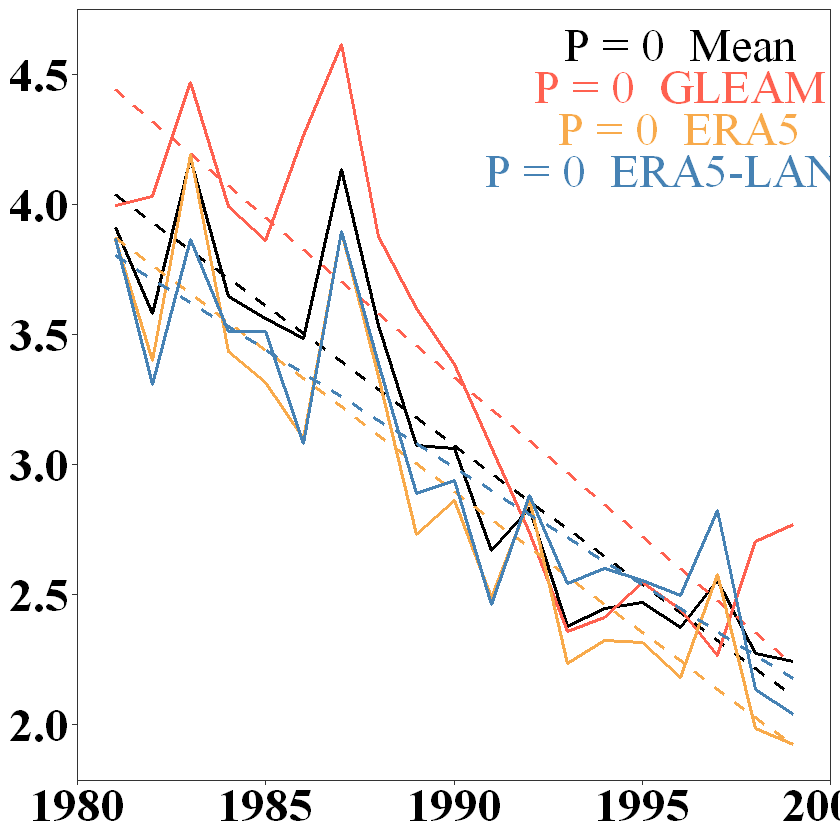

In [148]:
#1981-1999年
load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a5_occ_area_acount_sd_cv",".RData"))

fd_data <- fd_data[1:19,]
year <- 1981:1999
fun=function(data){
  ab <- data[which.max(data)]
  return(ab)
}
fd_data$msi <- fd_data$MEAN-fd_data$SD
fd_data$msa <- fd_data$MEAN+fd_data$SD
zz=apply(fd_data[1:4],2,fun)
ymax <- zz[which.max(zz)]
dat <-data.frame(year,fd_data)

#构建置信区间
m=lm(dat$MEAN~dat$year)
m
wx = par("usr")[1:2]
new.x = seq(wx[1],wx[2],len=19)
pred = predict(m, new=data.frame(x=new.x), interval="conf")

trend=pred[,"fit"][19]-pred[,"fit"][1]
slop = mmkTrend(dat$MEAN)$`Sen's Slope`
p_value=round(mmkTrend(dat$MEAN)$p.value,3)

m1=lm(dat$aa~dat$year)
m1
wx1 = par("usr")[1:2]
new.x1 = seq(wx1[1],wx1[2],len=19)
pred1 = predict(m1, new=data.frame(x=new.x1), interval="conf")

trend1=pred1[,"fit"][19]-pred1[,"fit"][1]
slop1 = mmkTrend(dat$aa)$`Sen's Slope`
p_value1=round(mmkTrend(dat$aa)$p.value,3)

m2=lm(dat$bb~dat$year)
m2
wx2 = par("usr")[1:2]
new.x2 = seq(wx2[1],wx2[2],len=19)
pred2 = predict(m2, new=data.frame(x=new.x2), interval="conf")

trend2=pred2[,"fit"][19]-pred2[,"fit"][1]
slop2 = mmkTrend(dat$bb)$`Sen's Slope`
p_value2=round(mmkTrend(dat$bb)$p.value,3)

m3=lm(dat$cc~dat$year)
m3
wx3 = par("usr")[1:2]
new.x3 = seq(wx3[1],wx3[2],len=19)
pred3 = predict(m3, new=data.frame(x=new.x3), interval="conf")

trend3=pred3[,"fit"][19]-pred3[,"fit"][1]
slop3 = mmkTrend(dat$cc)$`Sen's Slope`
p_value3=round(mmkTrend(dat$cc)$p.value,3)
# data1 <- data.frame(dat,pred)

linekind=2
lineaa=1
wid=1
fontsize=28
size_p=10
library(ggplot2)
p2=ggplot(dat)+
  #geom_point(pch=16,col="steelblue")+
  geom_line(aes(x=year,y=MEAN),col="black",linetype=lineaa,lwd=wid)+
  geom_line(aes(x=year,y=pred[,"fit"]),lwd=1,col="black",linetype=linekind)+
  geom_line(aes(x=year,y=aa),col="#ff6150",linetype=lineaa,lwd=wid)+  #GLEAM
  geom_line(aes(x=year,y=pred1[,"fit"]),lwd=1,col="#ff6150",linetype=linekind)+
  geom_line(aes(x=year,y=bb),col="#f8aa4b",linetype=lineaa,lwd=wid)+  #era5
  geom_line(aes(x=year,y=pred2[,"fit"]),lwd=1,col="#f8aa4b",linetype=linekind)+
  geom_line(aes(x=year,y=cc),col="steelblue",linetype=lineaa,lwd=wid)+
  geom_line(aes(x=year,y=pred3[,"fit"]),lwd=1,col="steelblue",linetype=linekind)+
  # geom_line(aes(x=year,y=pred[,"lwr"]),lty=3)+
  # geom_line(aes(x=year,y=pred[,"upr"]),lty=3)+
  #geom_ribbon(aes(ymin=dat$msi,ymax=dat$msa),alpha=0.4,fill=blues9[3])+
  #ylab("Coverage in Domain(%)")+
  #xlim(1980,2018)+ #xiugai
  #xlab("Year")+
  #guides(fill=guide_legend(label.theme = element_text(family="serif")))+
  #ggtitle("Spring")+    #
  #scale_fill_brewer(palette="Set3")+
  scale_x_continuous(breaks=seq(1980,2000,5),expand = c(0,1))+#这个可以去掉与Y轴间隙,
  scale_y_continuous(breaks=seq(1.5,5,0.5))+#,expand = c(0,1)
  theme_bw()+
  theme(#axis.title.x = element_blank(),
    legend.position = c(0.85,0.85),
    #legend.title = element_blank(),
    #legend.text = element_text(face='bold',colour='black',size=fontsize,hjust=0),
    legend.background = element_rect(fill = 'transparent'),#, colour = 'black'
    axis.text = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
    #axis.title.y = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
    axis.title.y = element_blank(),
    axis.title.x = element_blank(),
    plot.title=element_text(hjust=0.5),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank()
  )+
  annotate("text",parse=F,label=paste0("P = ",p_value,"  Mean"),x=1996,y=ymax*(1-0.00001),colour="black",size=size_p,family="serif")+
  annotate("text",parse=F,label=paste0("P = ",p_value1,"  GLEAM"),x=1996,y=ymax*(1-0.035),colour="#ff6150",size=size_p,family="serif")+
  annotate("text",parse=F,label=paste0("P = ",p_value2,"  ERA5"),x=1996,y=ymax*(1-0.07),colour="#f8aa4b",size=size_p,family="serif")+
  annotate("text",parse=F,label=paste0("P = ",p_value3,"  ERA5-LAND"),x=1996,y=ymax*(1-0.105),colour="steelblue",size=size_p,family="serif")
#annotate("text",parse=F,label="Global",x=1985,y=ymax*(1-0.00001),colour="black",size=9,family="serif")
#   return(list(p,trend,slop,p_value))
# }
p2

trend
trend1
trend2
trend3

In [149]:
pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture2\\2.year of acount area four data")
pdf(paste0(pic_name,"1981-1999.pdf"),width = 8, height =6)
 p2
 dev.off()

png 
  2

7.2分区

In [94]:
#ymin=31.5;ymax =41.5;xmin =-123.9;xmax =-96.1
#j=1
data_name=c("GLEAM","ERA5LAND","ERA5")
area_change=function(file_name,xmin,xmax,ymin,ymax,j,k){
  load(file_name)
  load("H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData") 
  #load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number.RData"))
  load("H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\lon_lat_area.RData")  #0.5格点的面积
  #occ_total = rowSums(occ_number, na.rm = T)
  dat = data.frame(x=grid2$lon, y=grid2$lat, z= occ_number)#[(720*5*18+1):(720*5*19)]
  names(dat)=c("lon","lat")
  #data <- dat[-which(dat$occ_number==0),]
  data <- merge(dat,lon_lat_area,by=c("lon","lat")) 

  data$number <- seq(1,dim(data)[1],1)
  load("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number.RData") #添加干旱点
  data <-data[-which(data$number%in%arid_number3),-44]
  
  data1 <- data[data$lon>(xmin) & data$lon<(xmax) & data$lat>(ymin) & data$lat<(ymax),]
  
  fun <- function(data){
    data[-which(is.na(data))]=1 
    return(data)
  } 
  #fun(data)
  data2 <- apply(data1[,3:42],1,fun)
  #data3 <- data.frame(t(data2),data1[,43])
  data3 <- t(data2)*data1[,43]
  data3 <- as.data.frame(data3)
  data4 <- apply(data3,2,sum,na.rm=T)
  data5 <-as.numeric((data4*100)/sum(data1[,43]))
  year=1981:2020
  occ_area <- data.frame(year,data5)
  
  #计算年际变化率
  change_fun <- function(i,data){
    x=data[i,2]
    y=data[i+1,2]
    z=((y-x)*100)/x
    return(z)
  }
  
  change_data <- NULL
  for(i in 1:39){
    change_data[i+1]<- change_fun(i,occ_area)
    #print(paste0("OK_",i))
  }
  occ_area$change <- change_data
  colnames(occ_area) <- c("year","area","change")  
  save(occ_area,file = paste0("H:\\NO.1 flash drought\\03data\\data_recal\\region\\a4_occ_area_acount_",data_name[k],"_",j,".RData"))
  return(occ_area)
}

In [ ]:
file_name="H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\fd_characteristics_detrend.RData"
k=1
area_change(file_name,ymin=31.5,ymax =41.5 ,xmin =-123.9 ,xmax =-96.1,1,k)
area_change(file_name,ymin=16.7,ymax =26 ,xmin =-106.5 ,xmax =-96.5 ,2,k)
area_change(file_name,ymin=-22.4,ymax =-3.8 ,xmin =-48 ,xmax =-34.9 ,3,k)
area_change(file_name,ymin=-30.1,ymax =-13.9 ,xmin =-75.2 ,xmax =-65.5 ,4,k)
area_change(file_name,ymin=36.1,ymax =44.6 ,xmin =-8.6 ,xmax =-0.8 ,5,k)
area_change(file_name,ymin=8.6,ymax =17,xmin =-16,xmax =29.5 ,6,k)
area_change(file_name,ymin=-7.6,ymax =10.8 ,xmin =30.5 ,xmax =42.1 ,7,k)
area_change(file_name,ymin=-20.5,ymax =-13.8 ,xmin =11.6 ,xmax =35.9 ,8,k)
area_change(file_name,ymin=12.3,ymax =37.1 ,xmin =36 ,xmax =68.1 ,9,k)
area_change(file_name,ymin=27.5,ymax =40.7 ,xmin =77.4 ,xmax =101 ,10,k)
area_change(file_name,ymin=6.5,ymax =26.1 ,xmin =71.7 ,xmax =88.1 ,11,k)
area_change(file_name,ymin=-19.3,ymax =-10.8 ,xmin =127.3 ,xmax =145.5 ,12,k)

file_name="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\fd_characteristics_detrend.RData"
k=2
area_change(file_name,ymin=31.5,ymax =41.5 ,xmin =-123.9 ,xmax =-96.1 ,1,k)
area_change(file_name,ymin=16.7,ymax =26 ,xmin =-106.5 ,xmax =-96.5 ,2,k)
area_change(file_name,ymin=-22.4,ymax =-3.8 ,xmin =-48 ,xmax =-34.9 ,3,k)
area_change(file_name,ymin=-30.1,ymax =-13.9 ,xmin =-75.2 ,xmax =-65.5 ,4,k)
area_change(file_name,ymin=36.1,ymax =44.6 ,xmin =-8.6 ,xmax =-0.8 ,5,k)
area_change(file_name,ymin=8.6,ymax =17,xmin =-16,xmax =29.5 ,6,k)
area_change(file_name,ymin=-7.6,ymax =10.8 ,xmin =30.5 ,xmax =42.1 ,7,k)
area_change(file_name,ymin=-20.5,ymax =-13.8 ,xmin =11.6 ,xmax =35.9 ,8,k)
area_change(file_name,ymin=12.3,ymax =37.1 ,xmin =36 ,xmax =68.1 ,9,k)
area_change(file_name,ymin=27.5,ymax =40.7 ,xmin =77.4 ,xmax =101 ,10,k)
area_change(file_name,ymin=6.5,ymax =26.1 ,xmin =71.7 ,xmax =88.1 ,11,k)
area_change(file_name,ymin=-19.3,ymax =-10.8 ,xmin =127.3 ,xmax =145.5 ,12,k)

file_name="H:\\NO.1 flash drought\\03data\\ERA5\\2.fd_result\\fd_characteristics_detrend.RData"
k=3
area_change(file_name,ymin=31.5,ymax =41.5 ,xmin =-123.9 ,xmax =-96.1 ,1,k)
area_change(file_name,ymin=16.7,ymax =26 ,xmin =-106.5 ,xmax =-96.5 ,2,k)
area_change(file_name,ymin=-22.4,ymax =-3.8 ,xmin =-48 ,xmax =-34.9 ,3,k)
area_change(file_name,ymin=-30.1,ymax =-13.9 ,xmin =-75.2 ,xmax =-65.5 ,4,k)
area_change(file_name,ymin=36.1,ymax =44.6 ,xmin =-8.6 ,xmax =-0.8 ,5,k)
area_change(file_name,ymin=8.6,ymax =17,xmin =-16,xmax =29.5 ,6,k)
area_change(file_name,ymin=-7.6,ymax =10.8 ,xmin =30.5 ,xmax =42.1 ,7,k)
area_change(file_name,ymin=-20.5,ymax =-13.8 ,xmin =11.6 ,xmax =35.9 ,8,k)
area_change(file_name,ymin=12.3,ymax =37.1 ,xmin =36 ,xmax =68.1 ,9,k)
area_change(file_name,ymin=27.5,ymax =40.7 ,xmin =77.4 ,xmax =101 ,10,k)
area_change(file_name,ymin=6.5,ymax =26.1 ,xmin =71.7 ,xmax =88.1 ,11,k)
area_change(file_name,ymin=-19.3,ymax =-10.8 ,xmin =127.3 ,xmax =145.5 ,12,k)

In [103]:
#计算分区面积占比 时间序列  
fun=function(j){
 k=1
 load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\region\\a4_occ_area_acount_",data_name[k],"_",j,".RData"))
  aa=occ_area[,2]
  k=2
  load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\region\\a4_occ_area_acount_",data_name[k],"_",j,".RData"))
  bb=occ_area[,2]
  k=3
  load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\region\\a4_occ_area_acount_",data_name[k],"_",j,".RData"))
  cc=occ_area[,2]

load(file="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData")

fd_data <- data.frame(aa,bb,cc)
fd_data$MEAN <- apply(fd_data,1,mean,na.rm=T)
fd_data$SD <- apply(fd_data[,1:3],1,sd,na.rm=T)
fd_data$CV <- (fd_data$SD/fd_data$MEAN)

save(fd_data,file = paste0("H:\\NO.1 flash drought\\03data\\data_recal\\region\\a5_occ_area_acount_sd_cv",j,".RData"))
return(j)
}
sapply(1:12,fun)

[1]  1  2  3  4  5  6  7  8  9 10 11 12

In [165]:
j
load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\region\\a5_occ_area_acount_sd_cv",j,".RData"))
fd_data

[1] 3

aa,bb,cc,MEAN,SD,CV
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
17.8088655,30.8401903,25.120234,24.5897634,6.5318379,0.26563240
16.9384022,11.4633355,10.529190,12.9769758,3.4623448,0.26680675
26.5602479,27.4776587,24.257105,26.0983373,1.6592203,0.06357571
4.4490654,5.9933402,6.515775,5.6527269,1.0746327,0.19010872
0.7508768,0.7492887,1.283789,0.9279848,0.3081365,0.33204906
14.0950857,11.1663816,8.690205,11.3172239,2.7055960,0.23906888
13.1987041,11.0021877,9.697144,11.2993453,1.7695926,0.15661019
6.2060248,9.5769058,9.107502,8.2968109,1.8258217,0.22006307
11.3654769,19.3484511,22.113188,17.6090385,5.5809935,0.31693914


7.2.1sd阴影图（图2）

trend,slop,p,region_name
<dbl>,<dbl>,<dbl>,<chr>
-9.423184,-0.23804577,0.000,WUS
-4.864175,-0.11240368,0.145,MXO
-4.270925,-0.12661993,0.152,EBZ
-5.768167,-0.14242609,0.008,ATD
-3.034209,-0.02500542,0.771,SPN
-13.685903,-0.23398175,0.096,SAH
3.049831,0.06126205,0.395,GRV
-3.233313,-0.09002480,0.568,SAF
-6.328064,-0.13903710,0.357,MDE


Warning message:
"Use of `dat$msi` is discouraged. Use `msi` instead."
Warning message:
"Use of `dat$msa` is discouraged. Use `msa` instead."
Warning message:
"Use of `dat$msi` is discouraged. Use `msi` instead."
Warning message:
"Use of `dat$msa` is discouraged. Use `msa` instead."
Warning message:
"Use of `dat$msi` is discouraged. Use `msi` instead."
Warning message:
"Use of `dat$msa` is discouraged. Use `msa` instead."
Warning message:
"Use of `dat$msi` is discouraged. Use `msi` instead."
Warning message:
"Use of `dat$msa` is discouraged. Use `msa` instead."
Warning message:
"Use of `dat$msi` is discouraged. Use `msi` instead."
Warning message:
"Use of `dat$msa` is discouraged. Use `msa` instead."
Warning message:
"Use of `dat$msi` is discouraged. Use `msi` instead."
Warning message:
"Use of `dat$msa` is discouraged. Use `msa` instead."
Warning message:
"Use of `dat$msi` is discouraged. Use `msi` instead."
Warning message:
"Use of `dat$msa` is discouraged. Use `msa` instead."
Warnin

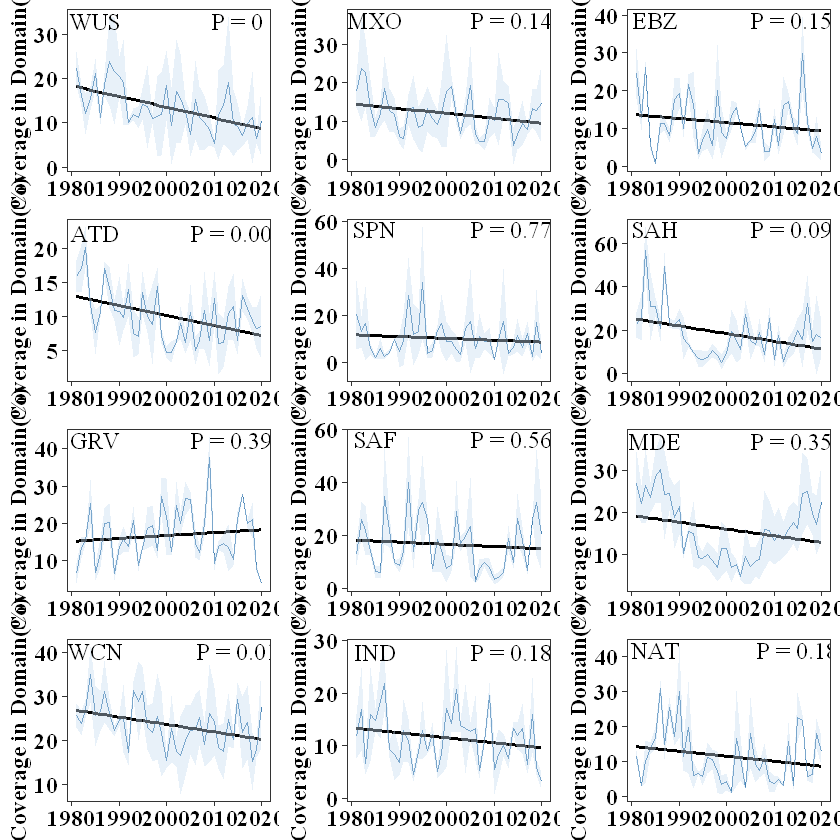

In [229]:
region_name <- c("WUS","MXO","EBZ","ATD","SPN","SAH","GRV","SAF","MDE","WCN","IND","NAT")
area_occ=function(j){
  #load(paste0("H:\\NO.1 flash drought\\03data\\data_GEE5\\occ_area_acount",j,".RData"))
  #load(paste0("H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\occ_area_acount",j,".RData"))
  #load(paste0("H:\\NO.1 flash drought\\03data\\ERA5\\2.fd_result\\occ_area_acount",j,".RData"))
  load(file = paste0("H:\\NO.1 flash drought\\03data\\data_recal\\region\\a5_occ_area_acount_sd_cv",j,".RData"))
  year <- 1981:2020
  fd_data$msi <- fd_data$MEAN-fd_data$SD
  fd_data$msa <- fd_data$MEAN+fd_data$SD
  dat <-data.frame(year,fd_data)
  
  #构建置信区间
  m=lm(dat$MEAN~dat$year)
  m
  wx = par("usr")[1:2]
  new.x = seq(wx[1],wx[2],len=40)
  pred = predict(m, new=data.frame(x=new.x), interval="conf")
  
  trend=pred[,"fit"][40]-pred[,"fit"][1]
  slop = mmkTrend(dat$MEAN)$`Sen's Slope`
  p_value=round(mmkTrend(dat$MEAN)$p.value,3)
  
  data1 <- data.frame(dat,pred)
  
  fontsize=14
  library(ggplot2)
  p=ggplot(dat,aes(x=year,y=MEAN))+
    #geom_point(pch=16,col="steelblue")+
    geom_line(col="steelblue")+
    geom_line(aes(x=year,y=pred[,"fit"]),lwd=1)+
    # geom_line(aes(x=year,y=pred[,"lwr"]),lty=3)+
    # geom_line(aes(x=year,y=pred[,"upr"]),lty=3)+
    geom_ribbon(aes(ymin=dat$msi,ymax=dat$msa),alpha=0.4,fill=blues9[3])+
    ylab("Coverage in Domain(%)")+
    #ylim(0,40)+ #xiugai
    #xlab("Year")+
    #guides(fill=F)+
    #ggtitle("Spring")+    #
    #scale_fill_brewer(palette="Set3")+
    scale_x_continuous(breaks=seq(1980,2020,10))+#,expand = c(0,0)这个可以去掉与Y轴间隙
    #scale_y_continuous(breaks=seq(-25,40,5),expand = c(0,1))+
    theme_bw()+
    theme(#axis.title.x = element_blank(),
      legend.position = c(0.85,0.85),
      legend.title = element_blank(),
      legend.text = element_text(face='bold',colour='black',size=fontsize,hjust=0),
      legend.background = element_rect(fill = 'transparent'),#, colour = 'black'
      axis.text = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
      axis.title.y = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
      axis.title.x = element_blank(),
      plot.title=element_text(hjust=0.5),
      panel.grid.major = element_blank(),
      panel.grid.minor = element_blank()
    )+
    annotate("text",parse=F,label=paste0("P = ",p_value),x=2015,y=max(dat$msa)-1,colour="black",size=5,family="serif")+
    #annotate("text",parse=F,label=paste0("P = ",p_value),x=2015,y=35,colour="black",size=5,family="serif")+
    annotate("text",parse=F,label=region_name[j],x=1985,y=max(dat$msa)-1,colour="black",size=5,family="serif")
    #annotate("text",parse=F,label=region_name[j],x=1985,y=35,colour="black",size=5,family="serif")
  return(list(p,trend,slop,p_value))
}

p1=area_occ(1)
p2=area_occ(2)
p3=area_occ(3)
p4=area_occ(4)
p5=area_occ(5)
p6=area_occ(6)
p7=area_occ(7)
p8=area_occ(8)
p9=area_occ(9)
p10=area_occ(10)
p11=area_occ(11)
p12=area_occ(12)

i=2#变化量
trend <- c(p1[[i]],p2[[i]],p3[[i]],p4[[i]],p5[[i]],p6[[i]],p7[[i]],p8[[i]],p9[[i]],p10[[i]],p11[[i]],p12[[i]])

i=3#斜率
slop <- c(p1[[i]],p2[[i]],p3[[i]],p4[[i]],p5[[i]],p6[[i]],p7[[i]],p8[[i]],p9[[i]],p10[[i]],p11[[i]],p12[[i]])

i=4#p_value
p <- c(p1[[i]],p2[[i]],p3[[i]],p4[[i]],p5[[i]],p6[[i]],p7[[i]],p8[[i]],p9[[i]],p10[[i]],p11[[i]],p12[[i]])


cc <- data.frame(trend,slop,p,region_name)
cc
pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture2\\2.year of acount area sd")
 # pdf(paste0(pic_name,".pdf"),width = 16, height = 12)
i=1
ggpubr::ggarrange(p1[[i]],p2[[i]],p3[[i]],p4[[i]],p5[[i]],p6[[i]],p7[[i]],p8[[i]],p9[[i]],p10[[i]],p11[[i]],p12[[i]],ncol = 3, nrow =4,common.legend = T,legend = "bottom") 

#dev.off()


In [230]:
cc

trend,slop,p,region_name
<dbl>,<dbl>,<dbl>,<chr>
-9.423184,-0.23804577,0.000,WUS
-4.864175,-0.11240368,0.145,MXO
-4.270925,-0.12661993,0.152,EBZ
-5.768167,-0.14242609,0.008,ATD
-3.034209,-0.02500542,0.771,SPN
-13.685903,-0.23398175,0.096,SAH
3.049831,0.06126205,0.395,GRV
-3.233313,-0.09002480,0.568,SAF
-6.328064,-0.13903710,0.357,MDE


In [231]:
mean(cc$trend)

[1] -5.26769

7.2.2四线图（附图4）

In [166]:
region_name <- c("WUS","MXO","EBZ","ATD","SPN","SAH","GRV","SAF","MDE","WCN","IND","NAT")
area_occ=function(j){
  load(file = paste0("H:\\NO.1 flash drought\\03data\\data_recal\\region\\a5_occ_area_acount_sd_cv",j,".RData"))
  
  year <- 1981:2020
  fun=function(data){
    ab <- data[which.max(data)]
    return(ab)
  }
  fd_data$msi <- fd_data$MEAN-fd_data$SD
  fd_data$msa <- fd_data$MEAN+fd_data$SD
  zz=apply(fd_data[1:4],2,fun)
  ymax <- zz[which.max(zz)]
  dat <-data.frame(year,fd_data)
  
  #构建置信区间
  m=lm(dat$MEAN~dat$year)
  m
  wx = par("usr")[1:2]
  new.x = seq(wx[1],wx[2],len=40)
  pred = predict(m, new=data.frame(x=new.x), interval="conf")
  
  trend=pred[,"fit"][40]-pred[,"fit"][1]
  slop = mmkTrend(dat$MEAN)$`Sen's Slope`
  p_value=round(mmkTrend(dat$MEAN)$p.value,3)
  
  m1=lm(dat$aa~dat$year)
  m1
  wx1 = par("usr")[1:2]
  new.x1 = seq(wx1[1],wx1[2],len=40)
  pred1 = predict(m1, new=data.frame(x=new.x1), interval="conf")
  
  trend1=pred1[,"fit"][40]-pred1[,"fit"][1]
  slop1 = mmkTrend(dat$aa)$`Sen's Slope`
  p_value1=round(mmkTrend(dat$aa)$p.value,3)
  
  m2=lm(dat$bb~dat$year)
  m2
  wx2 = par("usr")[1:2]
  new.x2 = seq(wx2[1],wx2[2],len=40)
  pred2 = predict(m2, new=data.frame(x=new.x2), interval="conf")
  
  trend2=pred2[,"fit"][40]-pred2[,"fit"][1]
  slop2 = mmkTrend(dat$bb)$`Sen's Slope`
  p_value2=round(mmkTrend(dat$bb)$p.value,3)
  
  m3=lm(dat$cc~dat$year)
  m3
  wx3 = par("usr")[1:2]
  new.x3 = seq(wx3[1],wx3[2],len=40)
  pred3 = predict(m3, new=data.frame(x=new.x3), interval="conf")
  
  trend3=pred3[,"fit"][40]-pred3[,"fit"][1]
  slop3 = mmkTrend(dat$cc)$`Sen's Slope`
  p_value3=round(mmkTrend(dat$cc)$p.value,3)
 # data1 <- data.frame(dat,pred)
  
  fontsize=14
  library(ggplot2)
  p=ggplot(dat)+
    #geom_point(pch=16,col="steelblue")+
    geom_line(aes(x=year,y=MEAN),col="black",linetype=5)+
    geom_line(aes(x=year,y=pred[,"fit"]),lwd=1,col="black")+
    geom_line(aes(x=year,y=aa),col="#ff6150",linetype=5)+
    geom_line(aes(x=year,y=pred1[,"fit"]),lwd=1,col="#ff6150")+
    geom_line(aes(x=year,y=bb),col="#f8aa4b",linetype=5)+
    geom_line(aes(x=year,y=pred2[,"fit"]),lwd=1,col="#f8aa4b")+
    geom_line(aes(x=year,y=cc),col="steelblue",linetype=5)+
    geom_line(aes(x=year,y=pred3[,"fit"]),lwd=1,col="steelblue")+
    # geom_line(aes(x=year,y=pred[,"lwr"]),lty=3)+
    # geom_line(aes(x=year,y=pred[,"upr"]),lty=3)+
    #geom_ribbon(aes(ymin=dat$msi,ymax=dat$msa),alpha=0.4,fill=blues9[3])+
    ylab("Coverage in Domain(%)")+
    #xlim(1980,2018)+ #xiugai
    #xlab("Year")+
    #guides(fill=F)+
    #ggtitle("Spring")+    #
    #scale_fill_brewer(palette="Set3")+
    scale_x_continuous(breaks=seq(1980,2020,10))+#,expand = c(0,0)这个可以去掉与Y轴间隙
    #scale_y_continuous(breaks=seq(-25,40,5),expand = c(0,1))+
    theme_bw()+
    theme(#axis.title.x = element_blank(),
      legend.position = c(0.85,0.85),
      legend.title = element_blank(),
      legend.text = element_text(face='bold',colour='black',size=fontsize,hjust=0),
      legend.background = element_rect(fill = 'transparent'),#, colour = 'black'
      axis.text = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
      axis.title.y = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
      axis.title.x = element_blank(),
      plot.title=element_text(hjust=0.5),
      panel.grid.major = element_blank(),
      panel.grid.minor = element_blank()
    )+
    annotate("text",parse=F,label=paste0("P = ",p_value),x=2015,y=ymax*(1-0.05),colour="black",size=5,family="serif")+
    annotate("text",parse=F,label=paste0("P = ",p_value1),x=2015,y=ymax*(1-0.1),colour="#ff6150",size=5,family="serif")+
    annotate("text",parse=F,label=paste0("P = ",p_value2),x=2015,y=ymax*(1-0.15),colour="#f8aa4b",size=5,family="serif")+
    annotate("text",parse=F,label=paste0("P = ",p_value3),x=2015,y=ymax*(1-0.2),colour="steelblue",size=5,family="serif")+
    annotate("text",parse=F,label=region_name[j],x=1985,y=ymax*(1-0.05),colour="black",size=5,family="serif")
  return(list(p,trend,slop,p_value))
}


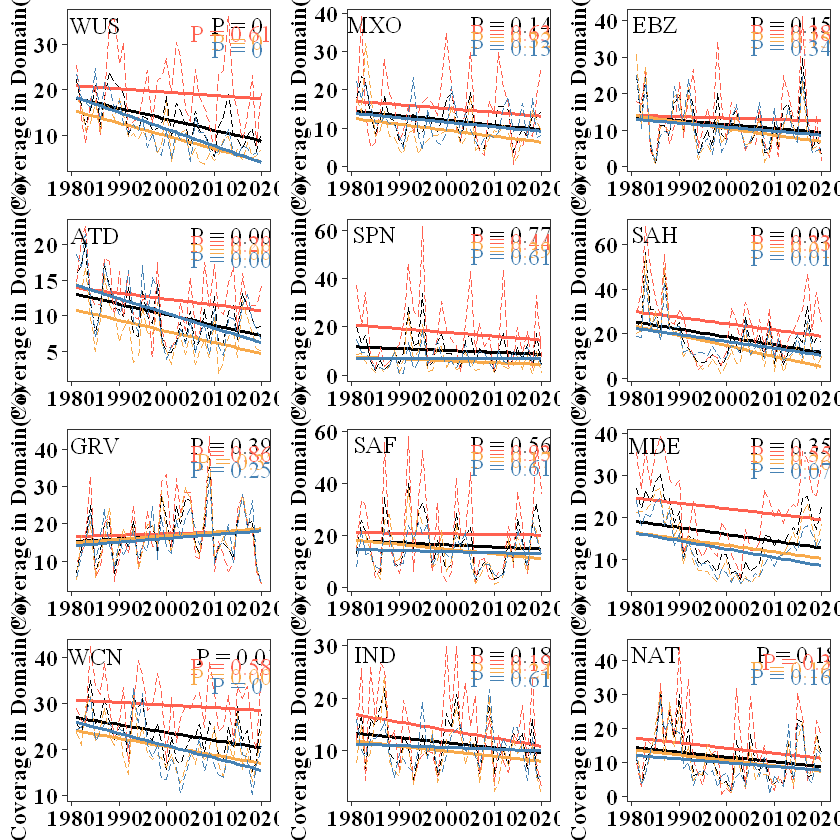

In [171]:
p1=area_occ(1)
p2=area_occ(2)
p3=area_occ(3)
p4=area_occ(4)
p5=area_occ(5)
p6=area_occ(6)
p7=area_occ(7)
p8=area_occ(8)
p9=area_occ(9)
p10=area_occ(10)
p11=area_occ(11)
p12=area_occ(12)

i=2#变化量
trend <- c(p1[[i]],p2[[i]],p3[[i]],p4[[i]],p5[[i]],p6[[i]],p7[[i]],p8[[i]],p9[[i]],p10[[i]],p11[[i]],p12[[i]])

i=3#斜率
slop <- c(p1[[i]],p2[[i]],p3[[i]],p4[[i]],p5[[i]],p6[[i]],p7[[i]],p8[[i]],p9[[i]],p10[[i]],p11[[i]],p12[[i]])

i=4#p_value
p <- c(p1[[i]],p2[[i]],p3[[i]],p4[[i]],p5[[i]],p6[[i]],p7[[i]],p8[[i]],p9[[i]],p10[[i]],p11[[i]],p12[[i]])


cc <- data.frame(region_name,trend,slop,p)

pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture2\\2.year of acount area 4data")
#pdf(paste0(pic_name,".pdf"),width = 16, height = 12)
i=1
ggpubr::ggarrange(p1[[i]],p2[[i]],p3[[i]],p4[[i]],p5[[i]],p6[[i]],p7[[i]],p8[[i]],p9[[i]],p10[[i]],p11[[i]],p12[[i]],ncol = 3, nrow =4,common.legend = T,legend = "bottom") 

#dev.off()


In [172]:
cc

region_name,trend,slop,p
<chr>,<dbl>,<dbl>,<dbl>
WUS,-9.423184,-0.23804577,0.000
MXO,-4.864175,-0.11240368,0.145
EBZ,-4.270925,-0.12661993,0.152
ATD,-5.768167,-0.14242609,0.008
SPN,-3.034209,-0.02500542,0.771
SAH,-13.685903,-0.23398175,0.096
GRV,3.049831,0.06126205,0.395
SAF,-3.233313,-0.09002480,0.568
MDE,-6.328064,-0.13903710,0.357


8.骤旱的季节和强度占比(附图5)

In [110]:
sea_mon <- function(file_name,i){
#month_occ(file_name)
load(file_name)
load("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number.RData")
data <- data_fd_total[-which(data_fd_total$number%in%arid_number3),]

I1 <- data[data$fd_intensity=="1",]
I2 <- data[data$fd_intensity=="2",]
I3 <- data[data$fd_intensity=="3",]
I4 <- data[data$fd_intensity=="4",]

season_fun <- function(data,j){
#data <- I2
aa <- data[data$month=="12"|data$month=="01"|data$month=="02",] #冬
bb <- data[data$month=="03"|data$month=="04"|data$month=="05",] #春
cc <- data[data$month=="06"|data$month=="07"|data$month=="08",] #夏
dd <- data[data$month=="09"|data$month=="10"|data$month=="11",] #秋

aa1 <- data[data$month=="01",] 
aa2 <- data[data$month=="02",] 
aa3 <- data[data$month=="03",] 
aa4 <- data[data$month=="04",] 
aa5 <- data[data$month=="05",] 
aa6 <- data[data$month=="06",] 
aa7 <- data[data$month=="07",] 
aa8 <- data[data$month=="08",] 
aa9 <- data[data$month=="09",] 
aa10 <- data[data$month=="10",] 
aa11 <- data[data$month=="11",] 
aa12 <- data[data$month=="12",] 

#强度
fd_intensity <- c(dim(I1)[1],dim(I2)[1],dim(I3)[1],dim(I4)[1])
intensity<- c("FD_1","FD_2",
                    "FD_3","FD_4")
data_intensity<- data.frame(intensity,fd_intensity)
data_intensity$data_per <- (data_intensity$fd_intensity*100)/dim(data_fd_total)[1]

#季节
fd_season <- c(dim(aa)[1],dim(bb)[1],dim(cc)[1],dim(dd)[1])
season <- c("DJF","MAM","JJA","SON")
data_season <- data.frame(season,fd_season)
data_season$data_per <- (data_season$fd_season/dim(data)[1])*data_intensity$data_per[j]

#月份
fd_month <- c(dim(aa1)[1],dim(aa2)[1],dim(aa3)[1],dim(aa4)[1],dim(aa5)[1],dim(aa6)[1],dim(aa7)[1],dim(aa8)[1],
              dim(aa9)[1],dim(aa10)[1],dim(aa11)[1],dim(aa12)[1])
month <- seq(1,12,1)
data_month <- data.frame(month,fd_month)
data_month$data_per <- (data_month$fd_month*100)/dim(data)[1]

data_month$SET <- data_set[i]
data_season$SET <- data_set[i]
data_season$degree <- intensity[j]

return(data_season)
}

IS1 <- season_fun(I1,1)
IS2 <- season_fun(I2,2)
IS3 <- season_fun(I3,3)
IS4 <- season_fun(I4,4)

IS <- rbind(IS1,IS2,IS3,IS4)

return(IS)
}

file_name1 <- "H:\\NO.1 flash drought\\03data\\ERA5\\2.fd_result\\data_fd_total1.RData"
file_name2 <- "H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\data_fd_total1.RData"
file_name3 <-"H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\data_fd_total1.RData"
data_set <- c("ERA5","GLEAM","ERA5-LAND")
#计算骤旱的强度占比（三套数据）
data1 <- sea_mon(file_name1,1)
data2 <- sea_mon(file_name2,2)
data3 <- sea_mon(file_name3,3)

data_avg <- (data1$data_per+data2$data_per+data3$data_per)/3  #三个数据的平均值
data <- data.frame(season=data1$season,degree=data1$degree,percentile=data_avg)

#data <- rbind(data1,data2,data3)  


In [111]:
data

season,degree,percentile
<chr>,<chr>,<dbl>
DJF,FD_1,10.845195
MAM,FD_1,10.621704
JJA,FD_1,9.249753
SON,FD_1,10.325665
DJF,FD_2,6.776187
MAM,FD_2,6.639942
JJA,FD_2,5.610492
SON,FD_2,6.446261
DJF,FD_3,3.427691


In [112]:
fun=function(data){
 library(plyr) 
ce <- ddply(data,"degree",transform,label_y=cumsum(percentile)-0.5*percentile)
ce$percentile <- round(ce$percentile,2)
fontsize=13
library(ggplot2)
library(RColorBrewer)
p=ggplot(ce,aes(x=degree,y=percentile,fill=season))+###aes(fill=area),
  #geom_boxplot(aes(fill=lat),notch = F,varwidth = F,outlier.shape = NA)+
  geom_bar(stat = "identity")+
  guides(fill=guide_legend(),family="serif")+
  scale_fill_manual(values = c(brewer.pal(4,"YlOrRd")[c(1,2,3,4)]))+#"Set3"
  labs(y="Proportion of flash drought (%)",x="Intensity")+
  coord_cartesian(ylim=c(0, 50))+
  theme_bw()+ 
  scale_y_continuous(expand = c(0,0))+
  #geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  #ggtitle(dname)+ 
  geom_text(aes(y=label_y,label=percentile),colour="black",#vjust=1.5,
            size=5)+#position = position_dodge(.9),
  theme(legend.position = c(0.9,0.85),
        plot.title=element_text(hjust=0.5,size=fontsize),
        axis.text = element_text(colour='black',size=fontsize,hjust=.5,family="serif"),
        axis.title = element_text(colour='black',size=fontsize,hjust=.5,family="serif"),
        #axis.title.x = element_blank(),
        panel.grid.major=element_blank(),
        panel.grid.minor=element_blank())
return(p)
}

------------------------------------------------------------------------------

You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)

------------------------------------------------------------------------------


载入程辑包：'plyr'


The following objects are masked from 'package:dplyr':

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize




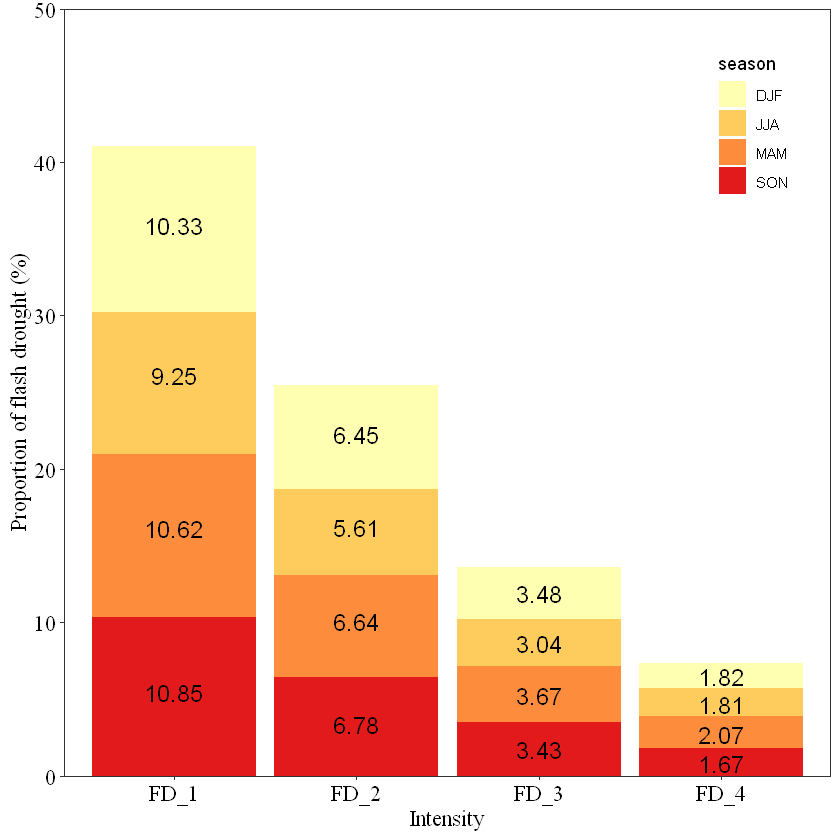

In [113]:
p4=fun(data)
p4

In [114]:
pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture2\\7.bar_")
pdf(paste0(pic_name,"sea_int.pdf"),width = 8, height = 6)
p4 
dev.off()


png 
  2

9.计算分区骤旱的平均持续时间

In [206]:
file_name= "H:\\NO.1 flash drought\\03data\\data_GEE5\\fd_characteristics_detrend.RData"
lonlat_name="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData"
load(file_name)
load(lonlat_name)

occ_dur = rowMeans(occ_ave_dur, na.rm = T)    #骤旱的持续时间
#to_raster(occ_dur  ,  filename = "occ_dur_Christian")
dat = data.frame(x=grid2$lon, y=grid2$lat, z=occ_dur)#[(720*5*18+1):(720*5*19)]
names(dat)=c("lon","lat","occ_dur")

dat$number <- seq(1,dim(dat)[1],1)
load("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number.RData")
dat <- dat[-which(dat$number %in% arid_number3),-4]
dim(dat)

data <- na.omit(dat)
mean(data$occ_dur)
mean(data$occ_dur)*5

region_name <- c("WUS","MXO","EBZ","ATD","SPN","SAH","GRV","SAF","MDE","WCN","IND","NAT")

frequency_change <- function(ymin,ymax,xmin,xmax,j){
dat<-data[data$lon>(xmin) & data$lon<(xmax) & data$lat>(ymin) & data$lat<(ymax),]#筛选区域格点
duration_mean <- mean(dat$occ_dur)
duration_day <- mean(dat$occ_dur)*5
regionname <- region_name[j]
return(list(regionname,duration_mean,duration_day))
}

frequency_change(ymin=31.5,ymax =41.5 ,xmin =-123.9 ,xmax =-96.1,1 )
frequency_change(ymin=16.7,ymax =26 ,xmin =-106.5 ,xmax =-96.5 ,2)
frequency_change(ymin=-22.4,ymax =-3.8 ,xmin =-48 ,xmax =-34.9 ,3)
frequency_change(ymin=-30.1,ymax =-13.9 ,xmin =-75.2 ,xmax =-65.5 ,4)
frequency_change(ymin=36.1,ymax =44.6 ,xmin =-8.6 ,xmax =-0.8 ,5)
frequency_change(ymin=8.6,ymax =17,xmin =-16,xmax =29.5,6)
frequency_change(ymin=-7.6,ymax =10.8 ,xmin =30.5 ,xmax =42.1 ,7)
frequency_change(ymin=-20.5,ymax =-13.8 ,xmin =11.6 ,xmax =35.9,8 )
frequency_change(ymin=12.3,ymax =37.1 ,xmin =36 ,xmax =68.1 ,9)
frequency_change(ymin=27.5,ymax =40.7 ,xmin =77.4 ,xmax =101,10 )
frequency_change(ymin=6.5,ymax =26.1 ,xmin =71.7 ,xmax =88.1 ,11)
frequency_change(ymin=-19.3,ymax =-10.8 ,xmin =127.3 ,xmax =145.5 ,12)

[1] 255507      3

[1] 7.141208

[1] 35.70604

[[1]]
[1] "WUS"

[[2]]
[1] 7.134756

[[3]]
[1] 35.67378

[[1]]
[1] "MXO"

[[2]]
[1] 7.452008

[[3]]
[1] 37.26004

[[1]]
[1] "EBZ"

[[2]]
[1] 7.52896

[[3]]
[1] 37.6448

[[1]]
[1] "ATD"

[[2]]
[1] 7.300809

[[3]]
[1] 36.50405

[[1]]
[1] "SPN"

[[2]]
[1] 7.191841

[[3]]
[1] 35.95921

[[1]]
[1] "SAH"

[[2]]
[1] 8.07721

[[3]]
[1] 40.38605

[[1]]
[1] "GRV"

[[2]]
[1] 7.374803

[[3]]
[1] 36.87402

[[1]]
[1] "SAF"

[[2]]
[1] 7.827645

[[3]]
[1] 39.13823

[[1]]
[1] "MDE"

[[2]]
[1] 7.864889

[[3]]
[1] 39.32444

[[1]]
[1] "WCN"

[[2]]
[1] 7.604336

[[3]]
[1] 38.02168

[[1]]
[1] "IND"

[[2]]
[1] 7.548541

[[3]]
[1] 37.7427

[[1]]
[1] "NAT"

[[2]]
[1] 7.236133

[[3]]
[1] 36.18067

10.不同的季节和强度的持续时间（附图6）

In [152]:
data_set <- c("ERA5","GLEAM","ERA5-LAND")
intensity<- c("FD_1","FD_2",
                    "FD_3","FD_4")
season <- c("DJF","MAM","JJA","SON")
sea_mon <- function(file_name,i){
#month_occ(file_name)
load(file_name)
load("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number.RData")
data <- data_fd_total[-which(data_fd_total$number%in%arid_number3),]

I1 <- data[data$fd_intensity=="1",]
I2 <- data[data$fd_intensity=="2",]
I3 <- data[data$fd_intensity=="3",]
I4 <- data[data$fd_intensity=="4",]

DI <- c(mean(I1$fd_length)*5,mean(I2$fd_length)*5,mean(I3$fd_length)*5,mean(I4$fd_length)*5)

#season_fun <- function(data,j){
#data <- I2
aa <- data[data$month=="12"|data$month=="01"|data$month=="02",] #冬
bb <- data[data$month=="03"|data$month=="04"|data$month=="05",] #春
cc <- data[data$month=="06"|data$month=="07"|data$month=="08",] #夏
dd <- data[data$month=="09"|data$month=="10"|data$month=="11",] #秋

DS <-c(mean(aa$fd_length)*5,mean(bb$fd_length)*5,mean(cc$fd_length)*5,mean(dd$fd_length)*5)

data_duration1 <- data.frame(intensity,DI)
data_duration1$KIND <- "intensity"

data_duration2 <- data.frame(season,DS)
data_duration2$KIND <- "season"
names(data_duration2) <- names(data_duration1)

data_duration <- rbind(data_duration1,data_duration2)
return(data_duration)
}
file_name1 <- "H:\\NO.1 flash drought\\03data\\ERA5\\2.fd_result\\data_fd_total1.RData"
file_name2 <- "H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\data_fd_total1.RData"
file_name3 <-"H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\data_fd_total1.RData"
data_set <- c("ERA5","GLEAM","ERA5-LAND")

data1 <- sea_mon(file_name1,1)
data2 <- sea_mon(file_name2,2)
data3 <- sea_mon(file_name3,3)
data <- rbind(data1,data2,data3)
data$SET <- rep(c("ERA5","GLEAM","ERA5-LAND"),each=8)
names(data) <- c("kind","duration","KIND","Data_Set")
data1=data
# data <- (data2$DI-data1$DI)*100/data1$DI
# data <- (data2$DI-data3$DI)*100/data3$DI
data1
#save(data1,file="H:\\NO.1 flash drought\\03data\\data_recal\\sea_int_duration.RData")

kind,duration,KIND,Data_Set
<chr>,<dbl>,<chr>,<chr>
FD_1,35.51620,intensity,ERA5
FD_2,35.29084,intensity,ERA5
FD_3,35.49051,intensity,ERA5
FD_4,36.58663,intensity,ERA5
DJF,35.58864,season,ERA5
MAM,34.83895,season,ERA5
JJA,34.85316,season,ERA5
SON,36.75998,season,ERA5
FD_1,40.59603,intensity,GLEAM


In [214]:
#进行统计分析
data2=data1[which(data1$Data_Set=="ERA5"),2]
data3=data1[which(data1$Data_Set=="GLEAM"),2]
data4=data1[which(data1$Data_Set=="ERA5-LAND"),2]
data5=data.frame(data2,data3,data4)
data5$aa=(data5[,2]-data5[,1])/data5[,1]
data5$bb=(data5[,2]-data5[,3])/data5[,3]
data5

data2,data3,data4,aa,bb
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
35.51620,40.59603,35.56414,0.14302852,0.1414877
35.29084,40.02591,35.04545,0.13417278,0.1421143
35.49051,39.67694,34.65950,0.11795908,0.1447636
36.58663,40.08057,35.10539,0.09549781,0.1417214
35.58864,39.44252,35.48651,0.10828950,0.1114792
34.83895,40.59613,34.95994,0.16525107,0.1612185
34.85316,40.25006,35.21364,0.15484684,0.1430247
36.75998,40.45741,35.38491,0.10058297,0.1433522


In [223]:
data2=data1[which(data1$kind=="FD_1"),2]
data3=data1[which(data1$kind=="FD_2"),2]
data4=data1[which(data1$kind=="FD_3"),2]
data6=data1[which(data1$kind=="FD_4"),2]
data5=data.frame(data2,data3,data4,data6)
#data5$aa=(data5[,2]-data5[,1])/data5[,1]
#data5$bb=(data5[,2]-data5[,3])/data5[,3]
data5
colMeans(data5)

data2,data3,data4,data6
<dbl>,<dbl>,<dbl>,<dbl>
35.51620,35.29084,35.49051,36.58663
40.59603,40.02591,39.67694,40.08057
35.56414,35.04545,34.65950,35.10539


data2    data3    data4    data6 
37.22546 36.78740 36.60898 37.25753

In [224]:
data2=data1[which(data1$kind=="DJF"),2]
data3=data1[which(data1$kind=="MAM"),2]
data4=data1[which(data1$kind=="JJA"),2]
data6=data1[which(data1$kind=="SON"),2]
data5=data.frame(data2,data3,data4,data6)
#data5$aa=(data5[,2]-data5[,1])/data5[,1]
#data5$bb=(data5[,2]-data5[,3])/data5[,3]
data5
colMeans(data5)

data2,data3,data4,data6
<dbl>,<dbl>,<dbl>,<dbl>
35.58864,34.83895,34.85316,36.75998
39.44252,40.59613,40.25006,40.45741
35.48651,34.95994,35.21364,35.38491


data2    data3    data4    data6 
36.83922 36.79834 36.77229 37.53410

,kind,duration,KIND,Data_Set
,<chr>,<dbl>,<chr>,<chr>
1,FD_1,35.51620,intensity,ERA5
2,FD_2,35.29084,intensity,ERA5
3,FD_3,35.49051,intensity,ERA5
4,FD_4,36.58663,intensity,ERA5
9,FD_1,40.59603,intensity,GLEAM
10,FD_2,40.02591,intensity,GLEAM
11,FD_3,39.67694,intensity,GLEAM
12,FD_4,40.08057,intensity,GLEAM
17,FD_1,35.56414,intensity,ERA5-LAND


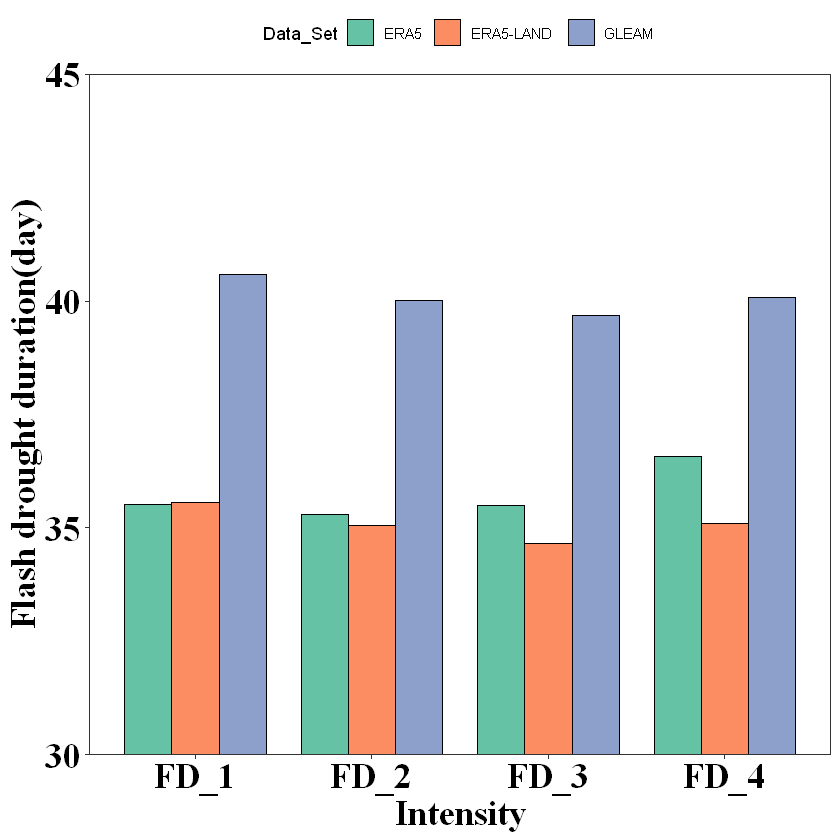

In [155]:
load("H:\\NO.1 flash drought\\03data\\data_recal\\sea_int_duration.RData")
data=data1[which(data1$KIND=="intensity"),]
data
order_pet <- with(data,reorder(kind,duration,median))  #重新排序
order_pet <- factor(order_pet,levels =c(intensity))
fontsize=21
library(ggplot2)
library(RColorBrewer)
p1=ggplot(data,aes(x=order_pet,y=duration,fill=Data_Set))+###aes(fill=area),
  #geom_boxplot(aes(fill=lat),notch = F,varwidth = F,outlier.shape = NA)+
  geom_bar(position="dodge",stat = "identity",colour="black",width = 0.8)+
  scale_fill_manual(values = c(brewer.pal(4,"Set2")[c(1,2,3,4)]))+
  labs(y="Flash drought duration(day)",x="Intensity",family="serif")+
  coord_cartesian(ylim=c(30, 45))+
  theme_bw()+ 
  scale_y_continuous(expand = c(0,0))+
  guides(color=guide_legend(nrow=1, byrow=TRUE),size=(fontsize+8))+
  #geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  #ggtitle(dname)+ 
  theme(legend.position ="top",
        plot.title=element_text(hjust=0.5,size=fontsize),
        axis.text = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
        axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
        #axis.title.x = element_blank(),
        panel.grid.major=element_blank(),
        panel.grid.minor=element_blank())
        
p1

In [156]:
pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture2\\8.duration_")
pdf(paste0(pic_name,"bar_sea_int1.pdf"),width = 8, height = 6)
p1
dev.off()

png 
  2

,kind,duration,KIND,Data_Set
,<chr>,<dbl>,<chr>,<chr>
5,DJF,35.58864,season,ERA5
6,MAM,34.83895,season,ERA5
7,JJA,34.85316,season,ERA5
8,SON,36.75998,season,ERA5
13,DJF,39.44252,season,GLEAM
14,MAM,40.59613,season,GLEAM
15,JJA,40.25006,season,GLEAM
16,SON,40.45741,season,GLEAM
21,DJF,35.48651,season,ERA5-LAND


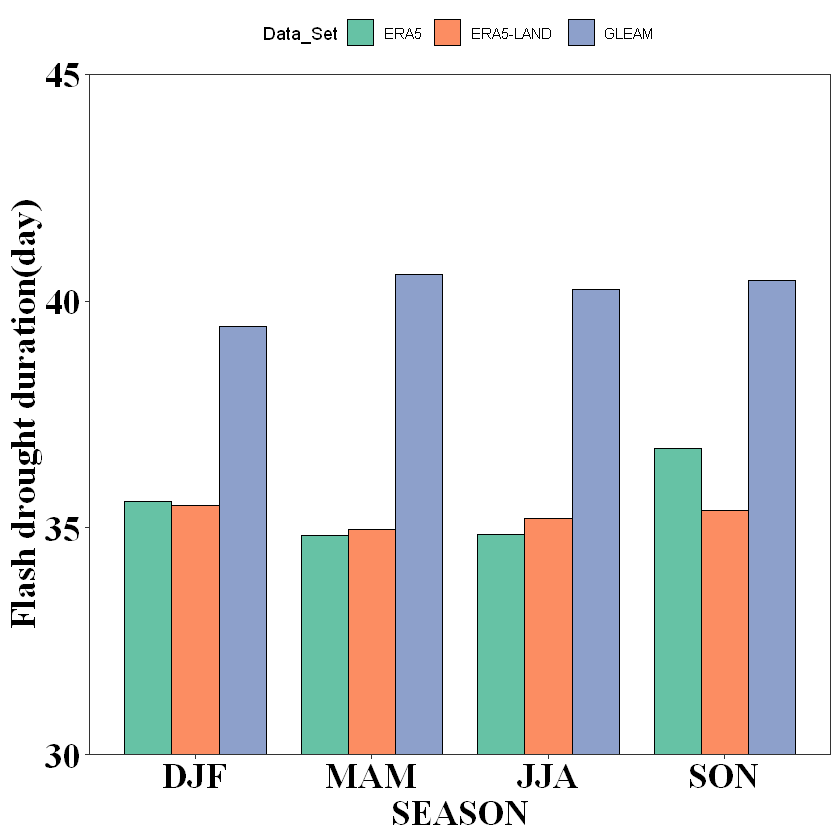

In [157]:
data=data1[which(data1$KIND=="season"),]
data
order_pet <- with(data,reorder(kind,duration,median))  #重新排序
order_pet <- factor(order_pet,levels =c(season))
fontsize=21
library(ggplot2)
library(RColorBrewer)
p2=ggplot(data,aes(x=order_pet,y=duration,fill=Data_Set))+###aes(fill=area),
  #geom_boxplot(aes(fill=lat),notch = F,varwidth = F,outlier.shape = NA)+
  geom_bar(position="dodge",stat = "identity",colour="black",width = 0.8)+
  scale_fill_manual(values = c(brewer.pal(4,"Set2")[c(1,2,3,4)]))+
  labs(y="Flash drought duration(day)",x="SEASON",family="serif")+
  coord_cartesian(ylim=c(30, 45))+
  theme_bw()+ 
  scale_y_continuous(expand = c(0,0))+
  guides(color=guide_legend(nrow=1, byrow=TRUE),size=(fontsize+8))+
  #geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  #ggtitle(dname)+ 
  theme(legend.position ="top",
        plot.title=element_text(hjust=0.5,size=fontsize),
        axis.text = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
        axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
        #axis.title.x = element_blank(),
        panel.grid.major=element_blank(),
        panel.grid.minor=element_blank())
p2

In [158]:
pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture2\\8.duration_")
pdf(paste0(pic_name,"bar_sea_int2.pdf"),width = 8, height = 6)
p2
dev.off()

png 
  2

#############气象数据###################################

################################################

   12.气象因子骤旱发生前后综合结果

In [ ]:
var=c("sm","et","pet","t2m","P","p_pet")
varname=c("SM","ET","PET","T","P","P-PET")
data_name=c("ERA5LAND","ERA5","GLEAM")
draw_fun <- function(i){
  #load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\",var,"_data_1.RData"))
  # load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\",var,"_data_1_1_",data_name,".RData"))
  #load(paste0("/media/xtan/15777115545/temporary/data/result/",var,"_data_1_1_",data_name,".RData"))
  load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\",var[i],"_lag_total_data.RData"))
  order_pet <- with(var_data,reorder(lag,value,median))
  order_pet <- factor(order_pet,levels = c("Lag-2","Lag-1","Onset","Lag+1","Lag+2"))
  # out <- boxplot.stats(data$PET)$out
  # out_ind <- which(data$PET %in% c(out))
  # XX <- data[-out_ind,]  
  fontsize = 18
  library(ggplot2)
  library(RColorBrewer)
  p <- ggplot(var_data,aes( order_pet,value))+
    geom_boxplot(aes(fill=dataset),varwidth = F,outlier.shape = NA)+
    geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    #geom_boxplot(aes(fill=var),notch = T,varwidth = F,outlier.shape = NA)+notch = T,
    scale_fill_manual(values = c(brewer.pal(7,"Set2")[c(1,2,3,4,5)]))+
    labs(y=paste0(varname[i]," Anomaly"),family="serif",fill="Data Set")+#x="Time",
    #guides("Data Set")+
    guides(color=guide_legend(nrow=1, byrow=TRUE),size=(fontsize+4))+
    coord_cartesian(ylim=c(-2, 2))+
    theme_bw()+ 
    #ggtitle(data_name[i])+
    theme(legend.position = "top",
          #legend.justification = c(0.5,1),
          legend.title = element_text(face='bold',colour='black',size=(fontsize+4),hjust=.5,family="serif"),#size=fontsize
          legend.key.height = unit(1,"cm"),
          plot.title=element_text(hjust=0.5,size=fontsize),
          axis.text = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
          axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
          axis.title.x = element_blank(),
          panel.grid.major=element_blank(),
          panel.grid.minor=element_blank())
  #theme_light()
  # ggsave(paste0("J:\\1.data_file\\09 GLEAM\\7draw\\分区\\PET\\",data_name[i],"_PET.png"),
  #        width = 14,height =12,units = "cm")
  #print(i)
  return(p)
}


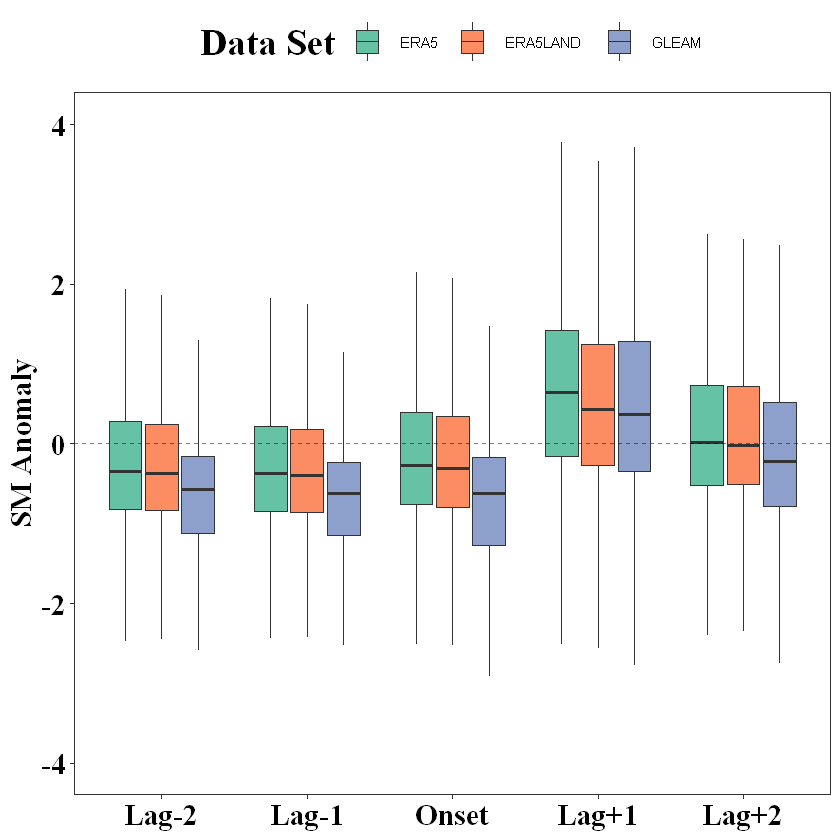

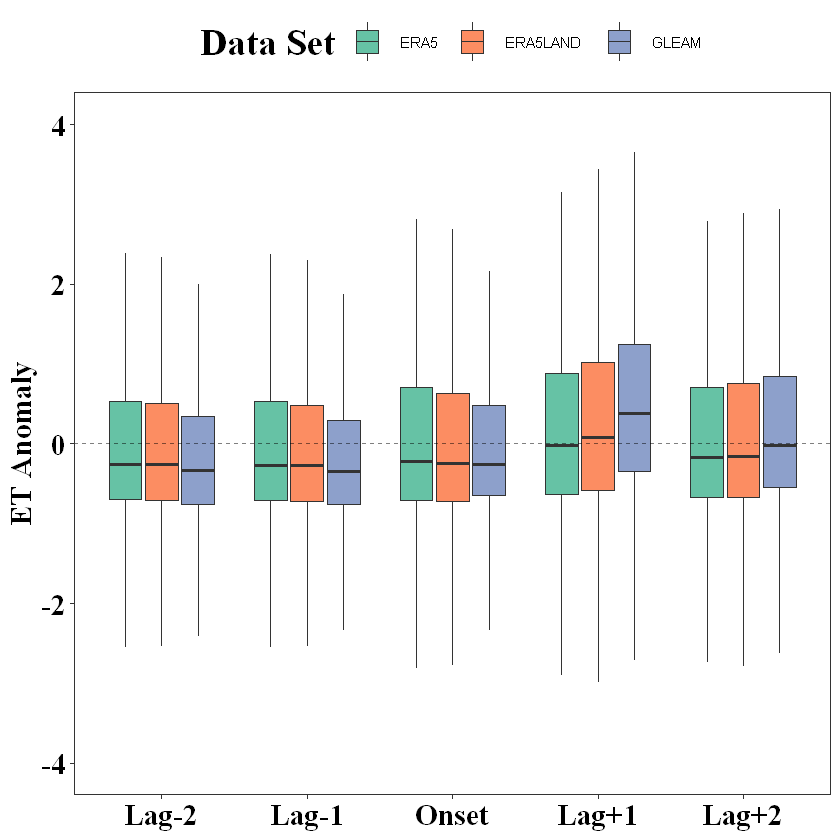

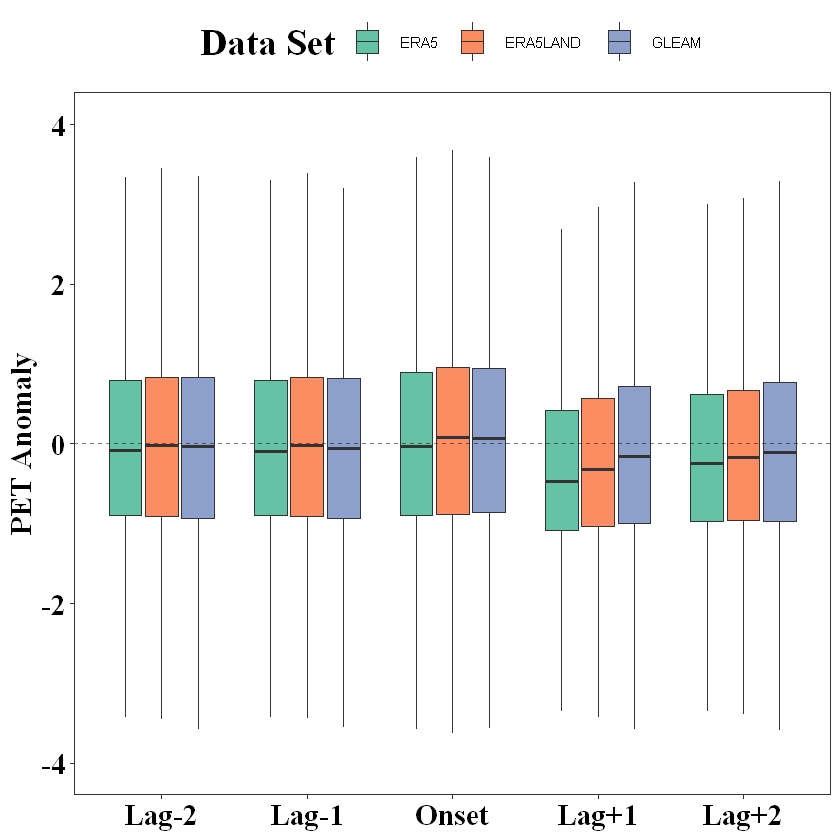

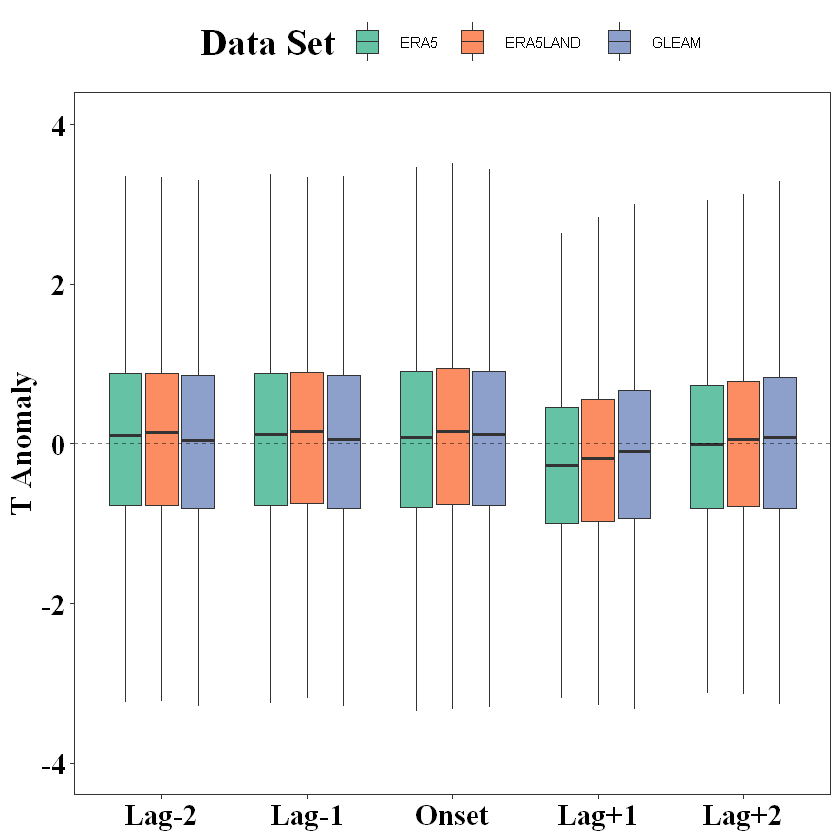

In [ ]:
p1=draw_fun(1)
p2=draw_fun(2)
p3=draw_fun(3)
p4=draw_fun(4)
p5=draw_fun(5)
p1
p2
p3
p4
p5

In [ ]:
pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture\\6.Lag_")
pdf(paste0(pic_name,"total.pdf"),width = 16, height = 8)
ggpubr::ggarrange(p1,p2,p3,p4,p5,ncol = 3, nrow =2,common.legend = T,legend = "bottom") 
dev.off()

png 
  2

In [ ]:
pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture\\6.Lag_")
pdf(paste0(pic_name,"SM2.pdf"),width = 8, height = 6)
#ggpubr::ggarrange(p1,p2,p3,p4,ncol = 2, nrow =2,common.legend = T,legend = "bottom") 
p1
dev.off()

pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture\\6.Lag_")
pdf(paste0(pic_name,"ET.pdf"),width = 8, height = 6)
#ggpubr::ggarrange(p1,p2,p3,p4,ncol = 2, nrow =2,common.legend = T,legend = "bottom") 
p2
dev.off()

pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture\\6.Lag_")
pdf(paste0(pic_name,"PET.pdf"),width = 8, height = 6)
#ggpubr::ggarrange(p1,p2,p3,p4,ncol = 2, nrow =2,common.legend = T,legend = "bottom") 
p3
dev.off()

pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture\\6.Lag_")
pdf(paste0(pic_name,"T.pdf"),width = 8, height = 6)
#ggpubr::ggarrange(p1,p2,p3,p4,ncol = 2, nrow =2,common.legend = T,legend = "bottom") 
p4
dev.off()

png 
  2

In [ ]:
var=c("sm","et","pet","t2m","P")
varname=c("SM","ET","PET","T","P")
data_name=c("ERA5LAND","ERA5","GLEAM")
draw_fun <- function(i){
  #load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\",var,"_data_1.RData"))
  # load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\",var,"_data_1_1_",data_name,".RData"))
  #load(paste0("/media/xtan/15777115545/temporary/data/result/",var,"_data_1_1_",data_name,".RData"))
  #load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\",var[i],"_lag_total_data.RData"))
    load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\",var[i],"_data_1_",data_name,".RData"))
  order_pet <- with(var_data_1,reorder(lag,value,median))
  order_pet <- factor(order_pet,levels = c("Lag-2","Lag-1","Onset","Lag+1","Lag+2"))
  # out <- boxplot.stats(data$PET)$out
  # out_ind <- which(data$PET %in% c(out))
  # XX <- data[-out_ind,]  
  fontsize = 18
  library(ggplot2)
  library(RColorBrewer)
  p <- ggplot(var_data_1,aes( order_pet,value))+
    geom_boxplot(aes(fill=dataset),varwidth = F,outlier.shape = NA)+
    #geom_boxplot(aes(fill=var),notch = T,varwidth = F,outlier.shape = NA)+notch = T,
    scale_fill_manual(values = c(brewer.pal(7,"Set2")[c(1,2,3,4,5)]))+
    labs(y=paste0(varname[i]," Anomaly"),family="serif",fill="Data Set")+#x="Time",
    #guides("Data Set")+
    guides(color=guide_legend(nrow=1, byrow=TRUE),size=(fontsize+4))+
    coord_cartesian(ylim=c(-4, 4))+
    theme_bw()+ 
    #ggtitle(data_name[i])+
    theme(legend.position = "top",
          #legend.justification = c(0.5,1),
          legend.title = element_text(face='bold',colour='black',size=(fontsize+4),hjust=.5,family="serif"),#size=fontsize
          legend.key.height = unit(1,"cm"),
          plot.title=element_text(hjust=0.5,size=fontsize),
          axis.text = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
          axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
          axis.title.x = element_blank(),
          panel.grid.major=element_blank(),
          panel.grid.minor=element_blank())
  #theme_light()
  # ggsave(paste0("J:\\1.data_file\\09 GLEAM\\7draw\\分区\\PET\\",data_name[i],"_PET.png"),
  #        width = 14,height =12,units = "cm")
  #print(i)
  return(p)
}


In [ ]:
draw_fun(5)

13.不同强度的骤旱与气象因子的变化情况

Warning message:
"Removed 52768 rows containing non-finite values (stat_boxplot)."
Warning message:
"Removed 52768 rows containing non-finite values (stat_boxplot)."
Warning message:
"Removed 209805 rows containing non-finite values (stat_boxplot)."
Warning message:
"Removed 5444 rows containing non-finite values (stat_boxplot)."


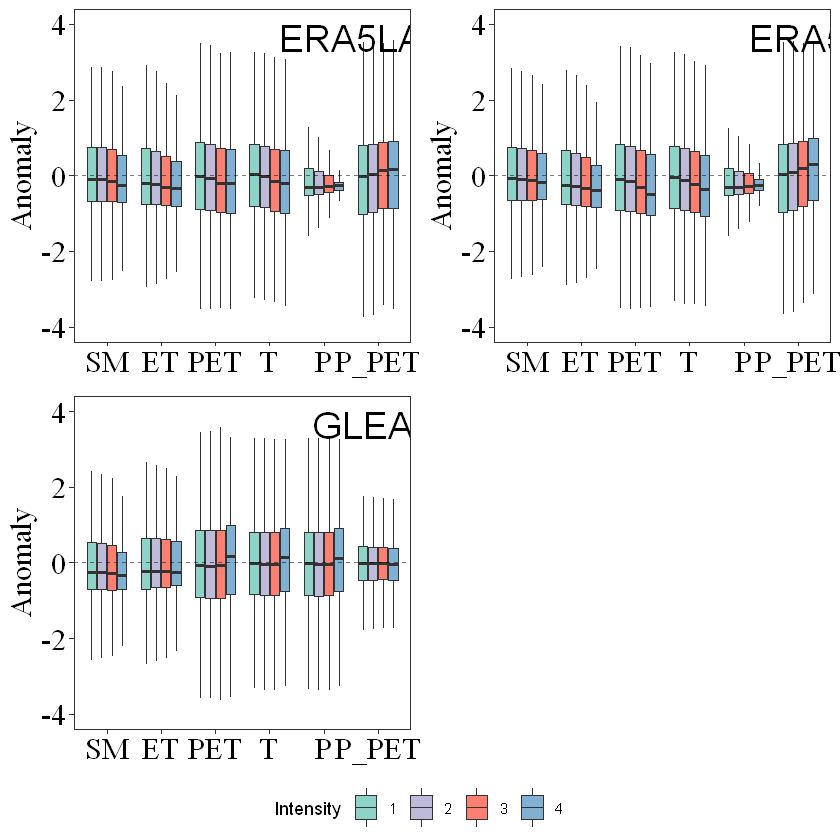

In [ ]:
data_name=c("ERA5LAND","ERA5","GLEAM")

draw_fun <- function(j){
  data_name=c("ERA5LAND","ERA5","GLEAM")
  fname <- "H:\\NO.1 flash drought\\03data\\meteorological\\"
  load(paste0(fname,"fd_var_before_lag_onset_total_",data_name[j],".RData"))
  data <- fd_var_onset  #骤旱发生时
  names(data) <- c("SM","ET","PET","T","P","number","Intensity","lat","lon")
  data$P_PET <- data$P-data$PET
  data <- reshape2::melt(data,measure.vars=c("SM","ET","PET","T","P","P_PET"),variable.name="var",value.name="value")
  data$Intensity <- as.character(data$Intensity)
  order_pet <- with(data,reorder(var,value,median))
  order_pet <- factor(order_pet,levels =c("SM","ET","PET","T","P","P_PET"))
  # out <- boxplot.stats(data$PET)$out
  # out_ind <- which(data$PET %in% c(out))
  # XX <- data[-out_ind,]  
  fontsize = 18
  library(ggplot2)
  library(RColorBrewer)
  p <- ggplot(data,aes(order_pet,value))+
    geom_boxplot(aes(fill=Intensity),varwidth = F,outlier.shape = NA)+
    geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
    #geom_boxplot(aes(fill=var),notch = T,varwidth = F,outlier.shape = NA)+notch = T,
    scale_fill_manual(values = c(brewer.pal(7,"Set3")[c(1,3,4,5)]))+
    labs(y=paste0("Anomaly"),family="serif",fill="Intensity")+#x="Time",
    #guides("Data Set")+
    #guides(color=guide_legend(title ="Intensity",nrow=1, byrow=TRUE),size=(fontsize+4))+
    coord_cartesian(ylim=c(-4, 4))+
    theme_bw()+ 
    #ggtitle(data_name[j])+
    theme(legend.position = "top",
          #legend.justification = c(0.5,1),
          #legend.title = element_text(colour='black',size=(fontsize+4),hjust=.5,family="serif"),#size=fontsizeface='bold',,vjust=-3
          legend.key.height = unit(1,"cm"),
          plot.title=element_text(vjust=-3,hjust=0.5,size=fontsize),
          axis.text = element_text(colour='black',size=fontsize,hjust=.5,family="serif"),#face='bold',
          axis.title = element_text(colour='black',size=fontsize,hjust=.5,family="serif"),#face='bold',
          axis.title.x = element_blank(),
          panel.grid.major=element_blank(),
          panel.grid.minor=element_blank())+
          annotate("text",x="P_PET",y=Inf,label=data_name[j],vjust=1.5,size=6)
  return(p)
}


In [ ]:
p1 <- draw_fun(1)
p2 <- draw_fun(2)
p3 <- draw_fun(3)

ggpubr::ggarrange(p1,p2,p3,nrow =2,ncol =2,common.legend = T,legend = "bottom") 

In [ ]:
pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture\\")
pdf(paste0(pic_name,"6.lag_intensity.pdf"),width = 16, height = 12)
ggpubr::ggarrange(p1,p2,p3,ncol = 2, nrow =2,common.legend = T,legend = "bottom") 
dev.off()

Warning message:
"Removed 52768 rows containing non-finite values (stat_boxplot)."
Warning message:
"Removed 52768 rows containing non-finite values (stat_boxplot)."
Warning message:
"Removed 209805 rows containing non-finite values (stat_boxplot)."
Warning message:
"Removed 5444 rows containing non-finite values (stat_boxplot)."


png 
  2

14.按维度分配（预处理）

In [ ]:
data_name=c('ERA5LAND','ERA5','GLEAM')

 #j=2
 #data_period=fd_var_onset
onset_fun <- function(j){
     data_name=c("ERA5LAND","ERA5","GLEAM")
     fname <- "H:\\NO.1 flash drought\\03data\\meteorological\\"
     load(paste0(fname,"fd_var_before_lag_onset_total_",data_name[j],".RData")) 
     #骤旱发生前后中气象因子的相关关系
     data <- fd_var_onset#  #提取骤旱发生时,修改此处
     names(data) <- c("SM","ET","PET","T","P","number","Intensity","lat","lon")
     data$P_PET <- data$P-data$PET
     #按照纬度5度的条件进行划分
     data$lat[which(data$lat<=(90)&data$lat>85)] <- 100#"tropic"
     data$lat[which(data$lat<=80&data$lat>75)] <- 200#"north temperate zone"
     data$lat[which(data$lat<=70&data$lat>65)] <- 300#"north frigid zone"
     data$lat[which(data$lat<=(60)&data$lat>(55))] <-400# "south temperate zone"
     data$lat[which(data$lat<=(50)&data$lat>(45))] <-500#"sou
     data$lat[which(data$lat<=40&data$lat>35)] <- 600#"north frigid zone"
     data$lat[which(data$lat<=(30)&data$lat>(25))] <-700# "south temperate zone"
     data$lat[which(data$lat<=(20)&data$lat>(15))] <-800#"sou
     data$lat[which(data$lat<=10&data$lat>5)] <- 900#"north frigid zone"
     data$lat[which(data$lat<=(0)&data$lat>=(-5))] <-1000# "south temperate zone"
     
     data$lat[which(data$lat<=(85)&data$lat>80)] <- 150#"tropic"
     data$lat[which(data$lat<=75&data$lat>70)] <- 250#"north temperate zone"
     data$lat[which(data$lat<=65&data$lat>60)] <- 350#"north frigid zone"
     data$lat[which(data$lat<=(55)&data$lat>(50))] <-450# "south temperate zone"
     data$lat[which(data$lat<=(45)&data$lat>(40))] <-550#"sou
     data$lat[which(data$lat<=35&data$lat>30)] <- 650#"north frigid zone"
     data$lat[which(data$lat<=(25)&data$lat>(20))] <-750# "south temperate zone"
     data$lat[which(data$lat<=(15)&data$lat>(10))] <-850#"sou
     data$lat[which(data$lat<=5&data$lat>0)] <- 950#"north frigid zone"

     data$lat[which(data$lat<=(-5)&data$lat>=(-10))] <-1050# "south temperate zone"
      data$lat[which(data$lat>=(-15)&data$lat<(-10))] <-1100#"sou
      data$lat[which(data$lat>=(-20)&data$lat<(-15))] <-1150#"sou
      data$lat[which(data$lat>=(-25)&data$lat<(-20))] <-1200# "south
 data$lat[which(data$lat>=(-30)&data$lat<(-25))] <-1250# "so
 data$lat[which(data$lat>=(-35)&data$lat<(-30))] <- 1300#"north frigid zone"
data$lat[which(data$lat>=(-40)&data$lat<(-35))] <- 1350#
data$lat[which(data$lat>=(-45)&data$lat<(-40))] <-1400#"sou
data$lat[which(data$lat>=(-50)&data$lat<(-45))] <-1450#"sou
data$lat[which(data$lat>=(-55)&data$lat<(-50))] <-1500# "south temperate zone
 data$lat[which(data$lat>=(-60)&data$lat<(-55))] <-1550# "south tempera
data$lat[which(data$lat>=(-65)&data$lat<(-60))] <- 1600#"north 
data$lat[which(data$lat>=(-70)&data$lat<(-65))] <- 1650#"north frig
data$lat[which(data$lat>=(-75)&data$lat<(-70))] <- 1700#"n
 data$lat[which(data$lat>=(-80)&data$lat<(-75))] <- 1750#"no
 data$lat[which(data$lat>=(-85)&data$lat<(-80))] <- 1800#"tropi
data$lat[which(data$lat>=(-90)&data$lat<(-85))] <- 1850#"tropic"

unique(data$lat)
    
fun <- function(i){
data1 <- data[,c(i,8:9)]
data2 <- aggregate(data1[,1],by=list(type=data1$lat),median, na.rm = T)  #按照维度进行分组求中位数
#data3 <- data2[c(1:17,29:18),]
return(data2)
}

sm <- fun(1)
et <- fun(2)
pet <- fun(3)
t <- fun(4)
p <- fun(5)
p_pet <- fun(10)

data5 <- data.frame(sm,et[,2],pet[,2],t[,2],p[,2],p_pet[,2]) #所有纬度中位数的值
names(data5) <- c("lat","SM","ET","PET","TT","P","P_PET")
data5 
# data$lat <- as.character(data$lat)
# dim(data)
# data
#  save(data5,file=paste0("H:\\NO.1 flash drought\\03data\\meteorological\\latitude\\lat_",data_name[j],"_",period,".RData"))
  return(data5)
  }
 before_1_fun <- function(j){
     data_name=c("ERA5LAND","ERA5","GLEAM")
     fname <- "H:\\NO.1 flash drought\\03data\\meteorological\\"
     load(paste0(fname,"fd_var_before_lag_onset_total_",data_name[j],".RData")) 
     #骤旱发生前后中气象因子的相关关系
     data <- fd_var_befor1#  #提取骤旱发生时,修改此处
     names(data) <- c("SM","ET","PET","T","P","number","Intensity","lat","lon")
     data$P_PET <- data$P-data$PET
     #按照纬度5度的条件进行划分
     data$lat[which(data$lat<=(90)&data$lat>85)] <- 100#"tropic"
     data$lat[which(data$lat<=80&data$lat>75)] <- 200#"north temperate zone"
     data$lat[which(data$lat<=70&data$lat>65)] <- 300#"north frigid zone"
     data$lat[which(data$lat<=(60)&data$lat>(55))] <-400# "south temperate zone"
     data$lat[which(data$lat<=(50)&data$lat>(45))] <-500#"sou
     data$lat[which(data$lat<=40&data$lat>35)] <- 600#"north frigid zone"
     data$lat[which(data$lat<=(30)&data$lat>(25))] <-700# "south temperate zone"
     data$lat[which(data$lat<=(20)&data$lat>(15))] <-800#"sou
     data$lat[which(data$lat<=10&data$lat>5)] <- 900#"north frigid zone"
     data$lat[which(data$lat<=(0)&data$lat>=(-5))] <-1000# "south temperate zone"
     
     data$lat[which(data$lat<=(85)&data$lat>80)] <- 150#"tropic"
     data$lat[which(data$lat<=75&data$lat>70)] <- 250#"north temperate zone"
     data$lat[which(data$lat<=65&data$lat>60)] <- 350#"north frigid zone"
     data$lat[which(data$lat<=(55)&data$lat>(50))] <-450# "south temperate zone"
     data$lat[which(data$lat<=(45)&data$lat>(40))] <-550#"sou
     data$lat[which(data$lat<=35&data$lat>30)] <- 650#"north frigid zone"
     data$lat[which(data$lat<=(25)&data$lat>(20))] <-750# "south temperate zone"
     data$lat[which(data$lat<=(15)&data$lat>(10))] <-850#"sou
     data$lat[which(data$lat<=5&data$lat>0)] <- 950#"north frigid zone"

     data$lat[which(data$lat<=(-5)&data$lat>=(-10))] <-1050# "south temperate zone"
      data$lat[which(data$lat>=(-15)&data$lat<(-10))] <-1100#"sou
      data$lat[which(data$lat>=(-20)&data$lat<(-15))] <-1150#"sou
      data$lat[which(data$lat>=(-25)&data$lat<(-20))] <-1200# "south
 data$lat[which(data$lat>=(-30)&data$lat<(-25))] <-1250# "so
 data$lat[which(data$lat>=(-35)&data$lat<(-30))] <- 1300#"north frigid zone"
data$lat[which(data$lat>=(-40)&data$lat<(-35))] <- 1350#
data$lat[which(data$lat>=(-45)&data$lat<(-40))] <-1400#"sou
data$lat[which(data$lat>=(-50)&data$lat<(-45))] <-1450#"sou
data$lat[which(data$lat>=(-55)&data$lat<(-50))] <-1500# "south temperate zone
 data$lat[which(data$lat>=(-60)&data$lat<(-55))] <-1550# "south tempera
data$lat[which(data$lat>=(-65)&data$lat<(-60))] <- 1600#"north 
data$lat[which(data$lat>=(-70)&data$lat<(-65))] <- 1650#"north frig
data$lat[which(data$lat>=(-75)&data$lat<(-70))] <- 1700#"n
 data$lat[which(data$lat>=(-80)&data$lat<(-75))] <- 1750#"no
 data$lat[which(data$lat>=(-85)&data$lat<(-80))] <- 1800#"tropi
data$lat[which(data$lat>=(-90)&data$lat<(-85))] <- 1850#"tropic"

unique(data$lat)
    
fun <- function(i){
data1 <- data[,c(i,8:9)]
data2 <- aggregate(data1[,1],by=list(type=data1$lat),median, na.rm = T)  #按照维度进行分组求中位数
#data3 <- data2[c(1:17,29:18),]
return(data2)
}

sm <- fun(1)
et <- fun(2)
pet <- fun(3)
t <- fun(4)
p <- fun(5)
p_pet <- fun(10)

data5 <- data.frame(sm,et[,2],pet[,2],t[,2],p[,2],p_pet[,2]) #所有纬度中位数的值
names(data5) <- c("lat","SM","ET","PET","TT","P","P_PET")
data5 
# data$lat <- as.character(data$lat)
# dim(data)
# data
#  save(data5,file=paste0("H:\\NO.1 flash drought\\03data\\meteorological\\latitude\\lat_",data_name[j],"_",period,".RData"))
  return(data5)
  }
  before_2_fun <- function(j){
     data_name=c("ERA5LAND","ERA5","GLEAM")
     fname <- "H:\\NO.1 flash drought\\03data\\meteorological\\"
     load(paste0(fname,"fd_var_before_lag_onset_total_",data_name[j],".RData")) 
     #骤旱发生前后中气象因子的相关关系
     data <- fd_var_befor2#  #提取骤旱发生时,修改此处
     names(data) <- c("SM","ET","PET","T","P","number","Intensity","lat","lon")
     data$P_PET <- data$P-data$PET
     #按照纬度5度的条件进行划分
     data$lat[which(data$lat<=(90)&data$lat>85)] <- 100#"tropic"
     data$lat[which(data$lat<=80&data$lat>75)] <- 200#"north temperate zone"
     data$lat[which(data$lat<=70&data$lat>65)] <- 300#"north frigid zone"
     data$lat[which(data$lat<=(60)&data$lat>(55))] <-400# "south temperate zone"
     data$lat[which(data$lat<=(50)&data$lat>(45))] <-500#"sou
     data$lat[which(data$lat<=40&data$lat>35)] <- 600#"north frigid zone"
     data$lat[which(data$lat<=(30)&data$lat>(25))] <-700# "south temperate zone"
     data$lat[which(data$lat<=(20)&data$lat>(15))] <-800#"sou
     data$lat[which(data$lat<=10&data$lat>5)] <- 900#"north frigid zone"
     data$lat[which(data$lat<=(0)&data$lat>=(-5))] <-1000# "south temperate zone"
     
     data$lat[which(data$lat<=(85)&data$lat>80)] <- 150#"tropic"
     data$lat[which(data$lat<=75&data$lat>70)] <- 250#"north temperate zone"
     data$lat[which(data$lat<=65&data$lat>60)] <- 350#"north frigid zone"
     data$lat[which(data$lat<=(55)&data$lat>(50))] <-450# "south temperate zone"
     data$lat[which(data$lat<=(45)&data$lat>(40))] <-550#"sou
     data$lat[which(data$lat<=35&data$lat>30)] <- 650#"north frigid zone"
     data$lat[which(data$lat<=(25)&data$lat>(20))] <-750# "south temperate zone"
     data$lat[which(data$lat<=(15)&data$lat>(10))] <-850#"sou
     data$lat[which(data$lat<=5&data$lat>0)] <- 950#"north frigid zone"

     data$lat[which(data$lat<=(-5)&data$lat>=(-10))] <-1050# "south temperate zone"
      data$lat[which(data$lat>=(-15)&data$lat<(-10))] <-1100#"sou
      data$lat[which(data$lat>=(-20)&data$lat<(-15))] <-1150#"sou
      data$lat[which(data$lat>=(-25)&data$lat<(-20))] <-1200# "south
 data$lat[which(data$lat>=(-30)&data$lat<(-25))] <-1250# "so
 data$lat[which(data$lat>=(-35)&data$lat<(-30))] <- 1300#"north frigid zone"
data$lat[which(data$lat>=(-40)&data$lat<(-35))] <- 1350#
data$lat[which(data$lat>=(-45)&data$lat<(-40))] <-1400#"sou
data$lat[which(data$lat>=(-50)&data$lat<(-45))] <-1450#"sou
data$lat[which(data$lat>=(-55)&data$lat<(-50))] <-1500# "south temperate zone
 data$lat[which(data$lat>=(-60)&data$lat<(-55))] <-1550# "south tempera
data$lat[which(data$lat>=(-65)&data$lat<(-60))] <- 1600#"north 
data$lat[which(data$lat>=(-70)&data$lat<(-65))] <- 1650#"north frig
data$lat[which(data$lat>=(-75)&data$lat<(-70))] <- 1700#"n
 data$lat[which(data$lat>=(-80)&data$lat<(-75))] <- 1750#"no
 data$lat[which(data$lat>=(-85)&data$lat<(-80))] <- 1800#"tropi
data$lat[which(data$lat>=(-90)&data$lat<(-85))] <- 1850#"tropic"

unique(data$lat)
    
fun <- function(i){
data1 <- data[,c(i,8:9)]
data2 <- aggregate(data1[,1],by=list(type=data1$lat),median, na.rm = T)  #按照维度进行分组求中位数
#data3 <- data2[c(1:17,29:18),]
return(data2)
}

sm <- fun(1)
et <- fun(2)
pet <- fun(3)
t <- fun(4)
p <- fun(5)
p_pet <- fun(10)

data5 <- data.frame(sm,et[,2],pet[,2],t[,2],p[,2],p_pet[,2]) #所有纬度中位数的值
names(data5) <- c("lat","SM","ET","PET","TT","P","P_PET")
data5 
# data$lat <- as.character(data$lat)
# dim(data)
# data
#  save(data5,file=paste0("H:\\NO.1 flash drought\\03data\\meteorological\\latitude\\lat_",data_name[j],"_",period,".RData"))
  return(data5)
  }
  lag_1_fun <- function(j){
     data_name=c("ERA5LAND","ERA5","GLEAM")
     fname <- "H:\\NO.1 flash drought\\03data\\meteorological\\"
     load(paste0(fname,"fd_var_before_lag_onset_total_",data_name[j],".RData")) 
     #骤旱发生前后中气象因子的相关关系
     data <- fd_var_lag1#  #提取骤旱发生时,修改此处
     names(data) <- c("SM","ET","PET","T","P","number","Intensity","lat","lon")
     data$P_PET <- data$P-data$PET
     #按照纬度5度的条件进行划分
     data$lat[which(data$lat<=(90)&data$lat>85)] <- 100#"tropic"
     data$lat[which(data$lat<=80&data$lat>75)] <- 200#"north temperate zone"
     data$lat[which(data$lat<=70&data$lat>65)] <- 300#"north frigid zone"
     data$lat[which(data$lat<=(60)&data$lat>(55))] <-400# "south temperate zone"
     data$lat[which(data$lat<=(50)&data$lat>(45))] <-500#"sou
     data$lat[which(data$lat<=40&data$lat>35)] <- 600#"north frigid zone"
     data$lat[which(data$lat<=(30)&data$lat>(25))] <-700# "south temperate zone"
     data$lat[which(data$lat<=(20)&data$lat>(15))] <-800#"sou
     data$lat[which(data$lat<=10&data$lat>5)] <- 900#"north frigid zone"
     data$lat[which(data$lat<=(0)&data$lat>=(-5))] <-1000# "south temperate zone"
     
     data$lat[which(data$lat<=(85)&data$lat>80)] <- 150#"tropic"
     data$lat[which(data$lat<=75&data$lat>70)] <- 250#"north temperate zone"
     data$lat[which(data$lat<=65&data$lat>60)] <- 350#"north frigid zone"
     data$lat[which(data$lat<=(55)&data$lat>(50))] <-450# "south temperate zone"
     data$lat[which(data$lat<=(45)&data$lat>(40))] <-550#"sou
     data$lat[which(data$lat<=35&data$lat>30)] <- 650#"north frigid zone"
     data$lat[which(data$lat<=(25)&data$lat>(20))] <-750# "south temperate zone"
     data$lat[which(data$lat<=(15)&data$lat>(10))] <-850#"sou
     data$lat[which(data$lat<=5&data$lat>0)] <- 950#"north frigid zone"

     data$lat[which(data$lat<=(-5)&data$lat>=(-10))] <-1050# "south temperate zone"
      data$lat[which(data$lat>=(-15)&data$lat<(-10))] <-1100#"sou
      data$lat[which(data$lat>=(-20)&data$lat<(-15))] <-1150#"sou
      data$lat[which(data$lat>=(-25)&data$lat<(-20))] <-1200# "south
 data$lat[which(data$lat>=(-30)&data$lat<(-25))] <-1250# "so
 data$lat[which(data$lat>=(-35)&data$lat<(-30))] <- 1300#"north frigid zone"
data$lat[which(data$lat>=(-40)&data$lat<(-35))] <- 1350#
data$lat[which(data$lat>=(-45)&data$lat<(-40))] <-1400#"sou
data$lat[which(data$lat>=(-50)&data$lat<(-45))] <-1450#"sou
data$lat[which(data$lat>=(-55)&data$lat<(-50))] <-1500# "south temperate zone
 data$lat[which(data$lat>=(-60)&data$lat<(-55))] <-1550# "south tempera
data$lat[which(data$lat>=(-65)&data$lat<(-60))] <- 1600#"north 
data$lat[which(data$lat>=(-70)&data$lat<(-65))] <- 1650#"north frig
data$lat[which(data$lat>=(-75)&data$lat<(-70))] <- 1700#"n
 data$lat[which(data$lat>=(-80)&data$lat<(-75))] <- 1750#"no
 data$lat[which(data$lat>=(-85)&data$lat<(-80))] <- 1800#"tropi
data$lat[which(data$lat>=(-90)&data$lat<(-85))] <- 1850#"tropic"

unique(data$lat)
    
fun <- function(i){
data1 <- data[,c(i,8:9)]
data2 <- aggregate(data1[,1],by=list(type=data1$lat),median, na.rm = T)  #按照维度进行分组求中位数
#data3 <- data2[c(1:17,29:18),]
return(data2)
}

sm <- fun(1)
et <- fun(2)
pet <- fun(3)
t <- fun(4)
p <- fun(5)
p_pet <- fun(10)

data5 <- data.frame(sm,et[,2],pet[,2],t[,2],p[,2],p_pet[,2]) #所有纬度中位数的值
names(data5) <- c("lat","SM","ET","PET","TT","P","P_PET")
data5 
# data$lat <- as.character(data$lat)
# dim(data)
# data
#  save(data5,file=paste0("H:\\NO.1 flash drought\\03data\\meteorological\\latitude\\lat_",data_name[j],"_",period,".RData"))
  return(data5)
  }
  lag_2_fun <- function(j){
     data_name=c("ERA5LAND","ERA5","GLEAM")
     fname <- "H:\\NO.1 flash drought\\03data\\meteorological\\"
     load(paste0(fname,"fd_var_before_lag_onset_total_",data_name[j],".RData")) 
     #骤旱发生前后中气象因子的相关关系
     data <- fd_var_lag2#  #提取骤旱发生时,修改此处
     names(data) <- c("SM","ET","PET","T","P","number","Intensity","lat","lon")
     data$P_PET <- data$P-data$PET
     #按照纬度5度的条件进行划分
     data$lat[which(data$lat<=(90)&data$lat>85)] <- 100#"tropic"
     data$lat[which(data$lat<=80&data$lat>75)] <- 200#"north temperate zone"
     data$lat[which(data$lat<=70&data$lat>65)] <- 300#"north frigid zone"
     data$lat[which(data$lat<=(60)&data$lat>(55))] <-400# "south temperate zone"
     data$lat[which(data$lat<=(50)&data$lat>(45))] <-500#"sou
     data$lat[which(data$lat<=40&data$lat>35)] <- 600#"north frigid zone"
     data$lat[which(data$lat<=(30)&data$lat>(25))] <-700# "south temperate zone"
     data$lat[which(data$lat<=(20)&data$lat>(15))] <-800#"sou
     data$lat[which(data$lat<=10&data$lat>5)] <- 900#"north frigid zone"
     data$lat[which(data$lat<=(0)&data$lat>=(-5))] <-1000# "south temperate zone"
     
     data$lat[which(data$lat<=(85)&data$lat>80)] <- 150#"tropic"
     data$lat[which(data$lat<=75&data$lat>70)] <- 250#"north temperate zone"
     data$lat[which(data$lat<=65&data$lat>60)] <- 350#"north frigid zone"
     data$lat[which(data$lat<=(55)&data$lat>(50))] <-450# "south temperate zone"
     data$lat[which(data$lat<=(45)&data$lat>(40))] <-550#"sou
     data$lat[which(data$lat<=35&data$lat>30)] <- 650#"north frigid zone"
     data$lat[which(data$lat<=(25)&data$lat>(20))] <-750# "south temperate zone"
     data$lat[which(data$lat<=(15)&data$lat>(10))] <-850#"sou
     data$lat[which(data$lat<=5&data$lat>0)] <- 950#"north frigid zone"

     data$lat[which(data$lat<=(-5)&data$lat>=(-10))] <-1050# "south temperate zone"
      data$lat[which(data$lat>=(-15)&data$lat<(-10))] <-1100#"sou
      data$lat[which(data$lat>=(-20)&data$lat<(-15))] <-1150#"sou
      data$lat[which(data$lat>=(-25)&data$lat<(-20))] <-1200# "south
 data$lat[which(data$lat>=(-30)&data$lat<(-25))] <-1250# "so
 data$lat[which(data$lat>=(-35)&data$lat<(-30))] <- 1300#"north frigid zone"
data$lat[which(data$lat>=(-40)&data$lat<(-35))] <- 1350#
data$lat[which(data$lat>=(-45)&data$lat<(-40))] <-1400#"sou
data$lat[which(data$lat>=(-50)&data$lat<(-45))] <-1450#"sou
data$lat[which(data$lat>=(-55)&data$lat<(-50))] <-1500# "south temperate zone
 data$lat[which(data$lat>=(-60)&data$lat<(-55))] <-1550# "south tempera
data$lat[which(data$lat>=(-65)&data$lat<(-60))] <- 1600#"north 
data$lat[which(data$lat>=(-70)&data$lat<(-65))] <- 1650#"north frig
data$lat[which(data$lat>=(-75)&data$lat<(-70))] <- 1700#"n
 data$lat[which(data$lat>=(-80)&data$lat<(-75))] <- 1750#"no
 data$lat[which(data$lat>=(-85)&data$lat<(-80))] <- 1800#"tropi
data$lat[which(data$lat>=(-90)&data$lat<(-85))] <- 1850#"tropic"

unique(data$lat)
    
fun <- function(i){
data1 <- data[,c(i,8:9)]
data2 <- aggregate(data1[,1],by=list(type=data1$lat),median, na.rm = T)  #按照维度进行分组求中位数
#data3 <- data2[c(1:17,29:18),]
return(data2)
}

sm <- fun(1)
et <- fun(2)
pet <- fun(3)
t <- fun(4)
p <- fun(5)
p_pet <- fun(10)

data5 <- data.frame(sm,et[,2],pet[,2],t[,2],p[,2],p_pet[,2]) #所有纬度中位数的值
names(data5) <- c("lat","SM","ET","PET","TT","P","P_PET")
data5 
# data$lat <- as.character(data$lat)
# dim(data)
# data
#  save(data5,file=paste0("H:\\NO.1 flash drought\\03data\\meteorological\\latitude\\lat_",data_name[j],"_",period,".RData"))
  return(data5)
  }



[1] "ERA5LAND" "ERA5"     "GLEAM"

In [ ]:
fun=function(aa,bb,cc,period){
# head(aa)
# head(bb)
# head(cc)
dd=cbind(aa[1:25,],bb[3:27,-1],cc[,-1]) #
# head(dd)
# dim(dd)
data=matrix(NA,nrow=25,ncol=18)
n=1
for(i in c(1,4,7,10,13,16)){
ee=dd[,c(n+1,n+7,n+13)]
data[,i]=apply(ee,1,mean,na.rm=T)#
data[,i+1]=apply(ee,1,sd,na.rm=T)
data[,i+2]=data[,i+1]/data[,i]
n=n+1
}
data=data.frame(data)
names(data) <- c("sm1","sm2","sm3","et1","et2","et3","pet1","pet2","pet3","t1","t2","t3","p1",
"p2","p3","p-pet1","p-pet2","p-pet3")#1mean 2sd 3cv
data_t=data
fd_data=dd
save(data_t,fd_data,file=paste0("H:\\NO.1 flash drought\\03data\\meteorological\\latitude\\",period,".RData"))
}

In [ ]:
aa=onset_fun(1) #ERA5LAND
bb=onset_fun(2) #ERA5
cc=onset_fun(3) #GLEAM
fun(aa,bb,cc,"onset")

In [ ]:
aa=before_1_fun(1)
bb=before_1_fun(2)
cc=before_1_fun(3)
fun(aa,bb,cc,"before1")

In [ ]:
aa=before_2_fun(1)
bb=before_2_fun(2)
cc=before_2_fun(3)
fun(aa,bb,cc,"before2")

In [ ]:
aa=lag_1_fun(1)
bb=lag_1_fun(2)
cc=lag_1_fun(3)
fun(aa,bb,cc,"lag1")

In [ ]:
aa=lag_2_fun(1)
bb=lag_2_fun(2)
cc=lag_2_fun(3)
fun(aa,bb,cc,"lag2")

In [ ]:
data5
dim(data5)
head(data5)

lat,SM,ET,PET,TT,P,P_PET
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
250,-0.03274262,-0.75704558,-0.74959200,-0.612610161,-0.2115038,0.25638843
300,0.30639762,-0.72813198,-0.72143673,-0.185361209,-0.3389605,0.19980253
350,0.15507577,-0.50883231,-0.52102485,-0.061460941,-0.3169725,0.07207612
400,0.01822764,0.15703806,0.14859705,0.384314157,-0.2920846,-0.16051286
450,0.05244494,-0.42166208,-0.44355275,-0.083496176,-0.3853135,0.14027390
500,0.15262480,-0.40671080,-0.44343634,-0.202382629,-0.3674563,0.25326864
550,0.10800975,-0.42789182,-0.41721267,-0.211339179,-0.3481961,0.25602674
600,-0.15258724,-0.37380286,-0.19122662,-0.052695134,-0.3298449,0.12696635
650,-0.04778866,-0.29928907,-0.43912309,-0.298766338,-0.3168983,0.30943708


[1] 29  7

,lat,SM,ET,PET,TT,P,P_PET
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,250,-0.03274262,-0.7570456,-0.7495920,-0.61261016,-0.2115038,0.25638843
2,300,0.30639762,-0.7281320,-0.7214367,-0.18536121,-0.3389605,0.19980253
3,350,0.15507577,-0.5088323,-0.5210248,-0.06146094,-0.3169725,0.07207612
4,400,0.01822764,0.1570381,0.1485971,0.38431416,-0.2920846,-0.16051286
5,450,0.05244494,-0.4216621,-0.4435528,-0.08349618,-0.3853135,0.14027390
6,500,0.15262480,-0.4067108,-0.4434363,-0.20238263,-0.3674563,0.25326864


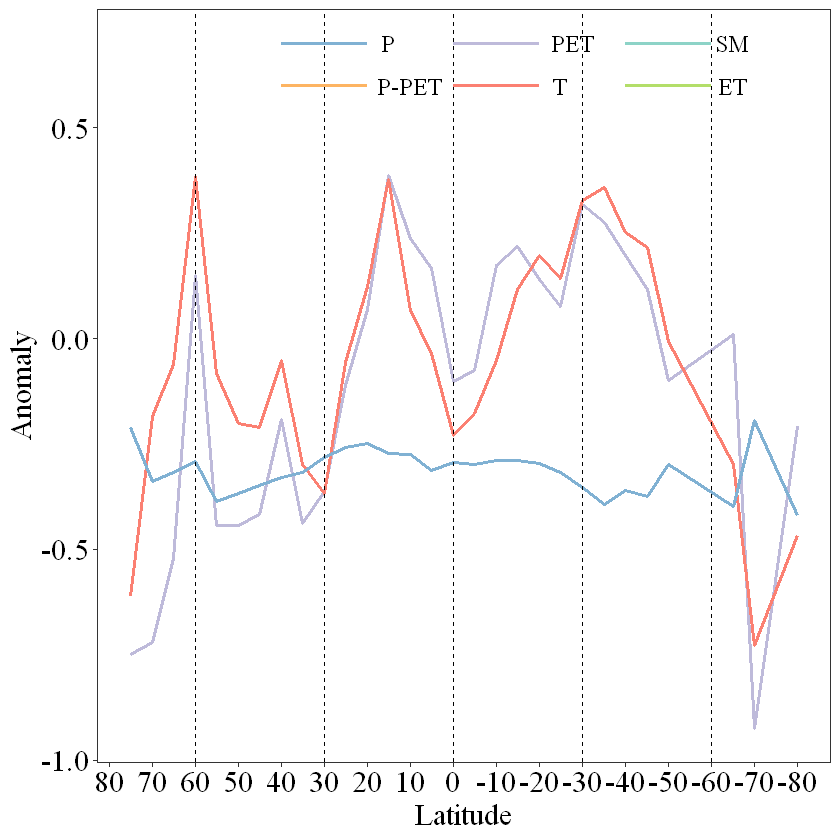

In [ ]:
linekind=2
lineaa=1
wid=1
fontsize=18
library(ggplot2)
  library(RColorBrewer)

p1=ggplot(data5)+
  #geom_point(pch=16,col="steelblue")+
  #geom_line(aes(x=lat,y=SM),col=c(brewer.pal(7,"Set3")[1]),linetype=lineaa,lwd=wid)+
  #geom_line(aes(x=lat,y=ET),lwd=1,col=c(brewer.pal(7,"Set3")[7]),linetype=lineaa)+
  geom_line(aes(x=lat,y=PET),col=c(brewer.pal(7,"Set3")[3]),linetype=lineaa,lwd=wid)+  #GLEAM
  geom_line(aes(x=lat,y=TT),lwd=1,col=c(brewer.pal(7,"Set3")[4]),linetype=lineaa)+
  geom_line(aes(x=lat,y=P),col=c(brewer.pal(7,"Set3")[5]),linetype=lineaa,lwd=wid)+  #era5
  #geom_line(aes(x=lat,y=P_PET),lwd=1,col=c(brewer.pal(7,"Set3")[6]),linetype=lineaa)+
  ylab("Anomaly")+
  # #xiugai
  xlab("Latitude")+
  #geom_hline(aes(yintercept=0), linetype="dashed",colour='black')+
     geom_vline(aes(xintercept=1000), linetype="dashed",colour='black')+
     geom_vline(aes(xintercept=700), linetype="dashed",colour='black')+
     geom_vline(aes(xintercept=1300), linetype="dashed",colour='black')+
      geom_vline(aes(xintercept=400), linetype="dashed",colour='black')+
      geom_vline(aes(xintercept=1600), linetype="dashed",colour='black')+
  # scale_x_continuous(breaks=c(100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,
  #                            900,950,1000,1050,1850,1800,1750,1700,1650,1600,1550,1500,1450,1400,
  #                            1350,1300,1250,1200,1150,1100),
  #                     # scale_x_continuous(breaks=c("100","150","200","250","300","350","400","450","500", "550","600","650","700", "750","800","850",
  #                     #                             "900","950","1000","1050","1850","1800","1750","1700", "1650","1600", "1550","1500", "1450","1400",
  #                     #                             "1350","1300","1250","1200","1150","1100"),
  #                   labels =c("90","85","80","75","70","65","60","65","50","45","40","35","30","25","20","15","10","5","0","-5","-10",
  #                             "-15","-20","-25","-30","-35","-40","-45","-50","-55","-60","-65","-70","-75","-80","-85"))+
  scale_x_continuous(breaks=c(100,200,300,400,500,600,700,800,
                             900,1000,1100,1200,1300,1400,1500,1600,
                             1700,1800),
                      # scale_x_continuous(breaks=c("100","150","200","250","300","350","400","450","500", "550","600","650","700", "750","800","850",
                      #                             "900","950","1000","1050","1850","1800","1750","1700", "1650","1600", "1550","1500", "1450","1400",
                      #                             "1350","1300","1250","1200","1150","1100"),
                    labels =c("90","80","70","60","50","40","30","20","10","0","-10",
                             "-20","-30","-40","-50","-60","-70","-80"))+
  annotate("segment",x=1400,xend=1600,y=0.7,yend=0.7,colour=c(brewer.pal(7,"Set3")[1]),size=wid)+
  annotate("segment",x=1400,xend=1600,y=0.6,yend=0.6,colour=c(brewer.pal(7,"Set3")[7]),size=wid)+
  annotate("segment",x=1000,xend=1200,y=0.7,yend=0.7,colour=c(brewer.pal(7,"Set3")[3]),size=wid)+
  annotate("segment",x=1000,xend=1200,y=0.6,yend=0.6,colour=c(brewer.pal(7,"Set3")[4]),size=wid)+
   annotate("segment",x=600,xend=800,y=0.7,yend=0.7,colour=c(brewer.pal(7,"Set3")[5]),size=wid)+
   annotate("segment",x=600,xend=800,y=0.6,yend=0.6,colour=c(brewer.pal(7,"Set3")[6]),size=wid)+
  annotate("text",parse=F,label="SM",x=1650,y=0.7,colour="black",size=5,family="serif")+
  annotate("text",parse=F,label="ET",x=1650,y=0.6,colour="black",size=5,family="serif")+
  annotate("text",parse=F,label="PET",x=1280,y=0.7,colour="black",size=5,family="serif")+
   annotate("text",parse=F,label="T",x=1250,y=0.6,colour="black",size=5,family="serif")+
 annotate("text",parse=F,label="P",x=850,y=0.7,colour="black",size=5,family="serif")+
  annotate("text",parse=F,label="P-PET",x=900,y=0.6,colour="black",size=5,family="serif")+
  theme_bw()+
  theme(#axis.title.x = element_blank(),
    legend.position = "top",#c(0.5,0.5),
    legend.title = element_text(face='bold',colour='black',size=fontsize,hjust=0),
    legend.text = element_text(face='bold',colour='black',size=fontsize,hjust=0),
    legend.background = element_rect(fill = 'transparent'),#, colour = 'black'
    axis.text = element_text(colour='black',size=fontsize,hjust=.5,family="serif"),#face='bold',
    axis.title = element_text(colour='black',size=fontsize,hjust=.5,family="serif"),#face='bold',
    #axis.title.y = element_blank(),
    #axis.title.x = element_blank(),
    plot.title=element_text(hjust=0.5),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank()

  )
p1

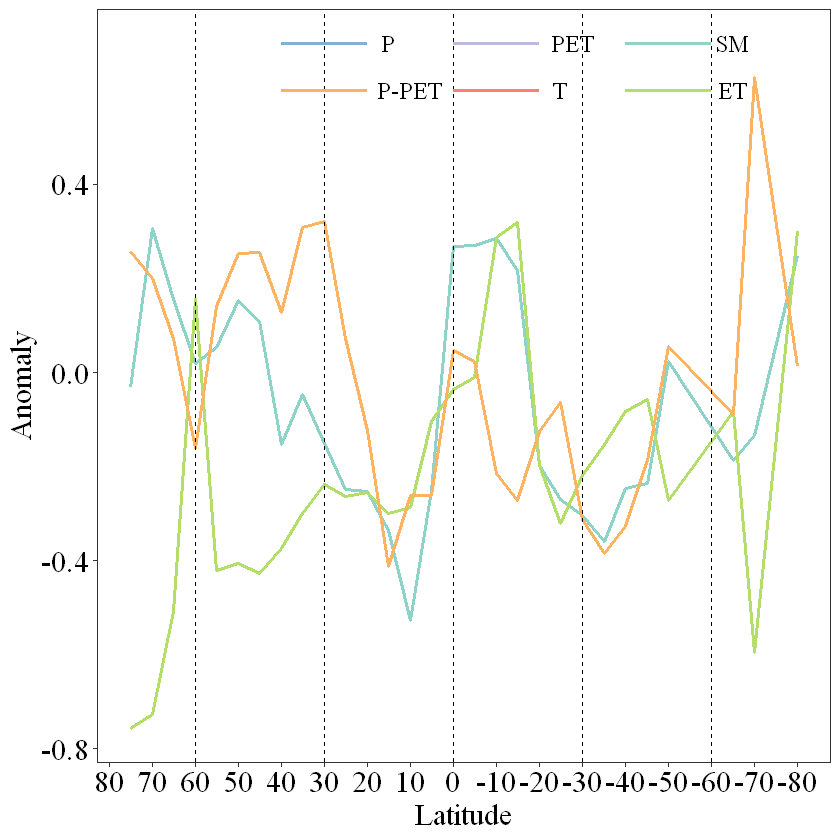

In [ ]:
p2=ggplot(data5)+
  #geom_point(pch=16,col="steelblue")+
   geom_line(aes(x=lat,y=SM),col=c(brewer.pal(7,"Set3")[1]),linetype=lineaa,lwd=wid)+
   geom_line(aes(x=lat,y=ET),lwd=1,col=c(brewer.pal(7,"Set3")[7]),linetype=lineaa)+
#   geom_line(aes(x=lat,y=PET),col=c(brewer.pal(7,"Set3")[3]),linetype=lineaa,lwd=wid)+  #GLEAM
  # geom_line(aes(x=lat,y=TT),lwd=1,col=c(brewer.pal(7,"Set3")[4]),linetype=lineaa)+
  # geom_line(aes(x=lat,y=P),col=c(brewer.pal(7,"Set3")[5]),linetype=lineaa,lwd=wid)+  #era5
   geom_line(aes(x=lat,y=P_PET),lwd=1,col=c(brewer.pal(7,"Set3")[6]),linetype=lineaa)+
  ylab("Anomaly")+
  #xlim(1980,2018)+ #xiugai
  xlab("Latitude")+
  #geom_hline(aes(yintercept=0), linetype="dashed",colour='black')+
     geom_vline(aes(xintercept=1000), linetype="dashed",colour='black')+
     geom_vline(aes(xintercept=700), linetype="dashed",colour='black')+
     geom_vline(aes(xintercept=1300), linetype="dashed",colour='black')+
      geom_vline(aes(xintercept=400), linetype="dashed",colour='black')+
      geom_vline(aes(xintercept=1600), linetype="dashed",colour='black')+
  # scale_x_continuous(breaks=c(100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,
  #                            900,950,1000,1050,1850,1800,1750,1700,1650,1600,1550,1500,1450,1400,
  #                            1350,1300,1250,1200,1150,1100),
  #                     # scale_x_continuous(breaks=c("100","150","200","250","300","350","400","450","500", "550","600","650","700", "750","800","850",
  #                     #                             "900","950","1000","1050","1850","1800","1750","1700", "1650","1600", "1550","1500", "1450","1400",
  #                     #                             "1350","1300","1250","1200","1150","1100"),
  #                   labels =c("90","85","80","75","70","65","60","65","50","45","40","35","30","25","20","15","10","5","0","-5","-10",
  #                             "-15","-20","-25","-30","-35","-40","-45","-50","-55","-60","-65","-70","-75","-80","-85"))+
  scale_x_continuous(breaks=c(100,200,300,400,500,600,700,800,
                             900,1000,1100,1200,1300,1400,1500,1600,
                             1700,1800),
                      # scale_x_continuous(breaks=c("100","150","200","250","300","350","400","450","500", "550","600","650","700", "750","800","850",
                      #                             "900","950","1000","1050","1850","1800","1750","1700", "1650","1600", "1550","1500", "1450","1400",
                      #                             "1350","1300","1250","1200","1150","1100"),
                    labels =c("90","80","70","60","50","40","30","20","10","0","-10",
                             "-20","-30","-40","-50","-60","-70","-80"))+
   annotate("segment",x=1400,xend=1600,y=0.7,yend=0.7,colour=c(brewer.pal(7,"Set3")[1]),size=wid)+
   annotate("segment",x=1400,xend=1600,y=0.6,yend=0.6,colour=c(brewer.pal(7,"Set3")[7]),size=wid)+
   annotate("segment",x=1000,xend=1200,y=0.7,yend=0.7,colour=c(brewer.pal(7,"Set3")[3]),size=wid)+
   annotate("segment",x=1000,xend=1200,y=0.6,yend=0.6,colour=c(brewer.pal(7,"Set3")[4]),size=wid)+
   annotate("segment",x=600,xend=800,y=0.7,yend=0.7,colour=c(brewer.pal(7,"Set3")[5]),size=wid)+
   annotate("segment",x=600,xend=800,y=0.6,yend=0.6,colour=c(brewer.pal(7,"Set3")[6]),size=wid)+
  annotate("text",parse=F,label="SM",x=1650,y=0.7,colour="black",size=5,family="serif")+
   annotate("text",parse=F,label="ET",x=1650,y=0.6,colour="black",size=5,family="serif")+
   annotate("text",parse=F,label="PET",x=1280,y=0.7,colour="black",size=5,family="serif")+
   annotate("text",parse=F,label="T",x=1250,y=0.6,colour="black",size=5,family="serif")+
   annotate("text",parse=F,label="P",x=850,y=0.7,colour="black",size=5,family="serif")+
   annotate("text",parse=F,label="P-PET",x=900,y=0.6,colour="black",size=5,family="serif")+
  theme_bw()+
  theme(#axis.title.x = element_blank(),
    legend.position = "top",#c(0.5,0.5),
    legend.title = element_text(face='bold',colour='black',size=fontsize,hjust=0),
    legend.text = element_text(face='bold',colour='black',size=fontsize,hjust=0),
    legend.background = element_rect(fill = 'transparent'),#, colour = 'black'
    axis.text = element_text(colour='black',size=fontsize,hjust=.5,family="serif"),#face='bold',
    axis.title = element_text(colour='black',size=fontsize,hjust=.5,family="serif"),#face='bold',
    #axis.title.y = element_blank(),
    #axis.title.x = element_blank(),
    plot.title=element_text(hjust=0.5),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank()

  )
p2

In [ ]:
pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture\\")
pdf(paste0(pic_name,"10.lag_var2.pdf"),width = 16, height = 12)
ggpubr::ggarrange(p1,p2,nrow =2,common.legend = T,legend = "bottom") 
dev.off()

png 
  2

14.1 对三个数据集按照维度进行综合分析

In [ ]:
load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\latitude\\","onset",".RData"))
head(data_t)
head(fd_data)

,sm1,sm2,sm3,et1,et2,et3,pet1,pet2,pet3,t1,t2,t3,p1,p2,p3,p-pet1,p-pet2,p-pet3
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,-0.433744911,0.9329218,-2.150854,-0.1362388,0.96680873,-7.0964285,-0.06227327,1.0839967,-17.4070948,0.0007872636,0.9337045,1186.0125517,0.14379999,0.7583084,5.2733552,0.087469103,0.2081014,2.379142
2,-0.006191423,0.5642599,-91.135748,-0.2167645,0.84432520,-3.8951270,-0.21893253,0.8256547,-3.7712745,0.1054502690,0.7195849,6.8239266,0.07387584,0.6627917,8.9716971,0.102547072,0.2306145,2.248864
3,0.051172792,0.3393164,6.630796,-0.6404363,0.12439355,-0.1942325,-0.63421106,0.1136667,-0.1792254,-0.2290163920,0.2251671,-0.9831921,-0.24723810,0.1160453,-0.4693664,0.149850647,0.1544239,1.030519
4,-0.087156310,0.4740750,-5.439365,-0.3541705,0.46366720,-1.3091638,-0.33616639,0.4525256,-1.3461358,-0.0141887185,0.4172218,-29.4051754,-0.20575875,0.1706241,-0.8292437,0.043323934,0.2281572,5.266307
5,-0.123531233,0.3029878,-2.452722,-0.2057956,0.23752004,-1.1541552,-0.16781243,0.2484252,-1.4803745,0.0558982200,0.1363205,2.4387268,-0.23179916,0.2306717,-0.9951362,0.001652947,0.1201285,72.675350
6,-0.021351066,0.2795955,-13.095153,-0.3308977,0.09652562,-0.2917083,-0.29896958,0.2233549,-0.7470824,-0.1303124096,0.1473306,-1.1305950,-0.24159980,0.2200404,-0.9107638,0.136787148,0.1755643,1.283485


,lat,SM,ET,PET,TT,P,P_PET,SM,ET,PET,TT,P,P_PET,SM,ET,PET,TT,P,P_PET
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,250,-0.03274262,-0.7570456,-0.7495920,-0.61261016,-0.2115038,0.25638843,0.2316298,-0.62937025,-0.62456282,-0.4603758,-0.3716217,0.15101579,-1.5001219,0.9776995,1.18733503,1.07534778,1.014525555,-0.1449969126
2,300,0.30639762,-0.7281320,-0.7214367,-0.18536121,-0.3389605,0.19980253,0.3325952,-0.67994269,-0.66933759,-0.4232166,-0.2777986,0.26860298,-0.6575671,0.7577812,0.73397673,0.92492866,0.838386667,-0.1607642916
3,350,0.15507577,-0.5088323,-0.5210248,-0.06146094,-0.3169725,0.07207612,0.3263890,-0.75607853,-0.74835229,-0.4849688,-0.3114635,0.32769866,-0.3279464,-0.6563981,-0.63325604,-0.14061948,-0.113278327,0.0497771655
4,400,0.01822764,0.1570381,0.1485971,0.38431416,-0.2920846,-0.16051286,0.3253589,-0.74756675,-0.74746446,-0.4478982,-0.3159695,0.28978854,-0.6050555,-0.4719828,-0.40963175,0.02101792,-0.009222149,0.0006961155
5,450,0.05244494,-0.4216621,-0.4435528,-0.08349618,-0.3853135,0.14027390,0.0503507,0.04865391,0.03854538,0.1889214,-0.3435478,-0.06329439,-0.4733893,-0.2443786,-0.09842992,0.06226946,0.033463873,-0.0720206707
6,500,0.15262480,-0.4067108,-0.4434363,-0.20238263,-0.3674563,0.25326864,0.1271879,-0.36374765,-0.41176167,-0.2277341,-0.3698203,0.22223660,-0.3438659,-0.2222347,-0.04171072,0.03917946,0.012477258,-0.0651437992


In [ ]:
dim(fd_data)

[1] 25 19

In [ ]:
period=c("onset","before1","before2","lag1","lag2")
fun_period=function(k){
#load("H:\\NO.1 flash drought\\03data\\meteorological\\fd_var_onset_latitude.RData")
load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\latitude\\",period[k],".RData"))

#load(paste0("H:\\NO.1 flash drought\\03data\\data_GEE5\\occ_area_acount\\occ_area_acount_sd_cv",".RData"))
# names(data_t) <- c("sm1","sm2","sm3","et1","et2","et3","pet1","pet2","pet3","t1","t2","t3","p1",
# "p2","p3","p-pet1","p-pet2","p-pet3")#1mean 2sd 3cv
i=7
j=3
fun <- function(j,i){#j 2:7 i 1,4,7,10,13,16
data <- data.frame(fd_data[,c(1,j,(j+6),(j+12))],data_t[,i:(i+2)])
# fun=function(data){
#   ab <- data[which.max(data)]
#   return(ab)
# }
data$msi <- data[,5]-data[,6]
data$msa <- data[,5]+data[,6]

# zz=apply(data[1:4],2,fun)
# ymax <- zz[which.max(zz)]
# dat <-data.frame(year,fd_data)

#构建置信区间
m=lm(data[,5]~data[,1])
m
wx = par("usr")[1:2]
new.x = seq(wx[1],wx[2],len=25)
pred = predict(m, new=data.frame(x=new.x), interval="conf")

trend=pred[,"fit"][25]-pred[,"fit"][1]
slop = mmkTrend(data[,5])$`Sen's Slope`
p_value=round(mmkTrend(data[,5])$p.value,3)
#data=data[which(data$lat>350),]
return(data)
}

data1 <- fun(2,1)  #sm
data2 <- fun(3,4)  #et
data3 <- fun(4,7)  #pet
data4 <- fun(5,10) #t
data5 <- fun(6,13) #p
data6 <- fun(7,16) #p-pet
return(data6)  #修改此处选择不同的变量
}

In [ ]:
period=c("onset","before1","before2","lag1","lag2")

In [ ]:
data1=fun_period(3)#"before2"
data2=fun_period(2)#"before1"
data3=fun_period(1)#"onset"
data4=fun_period(4)#"lag1"
data5=fun_period(5)#"lag2"

Scale for 'x' is already present. Adding another scale for 'x', which will
replace the existing scale.



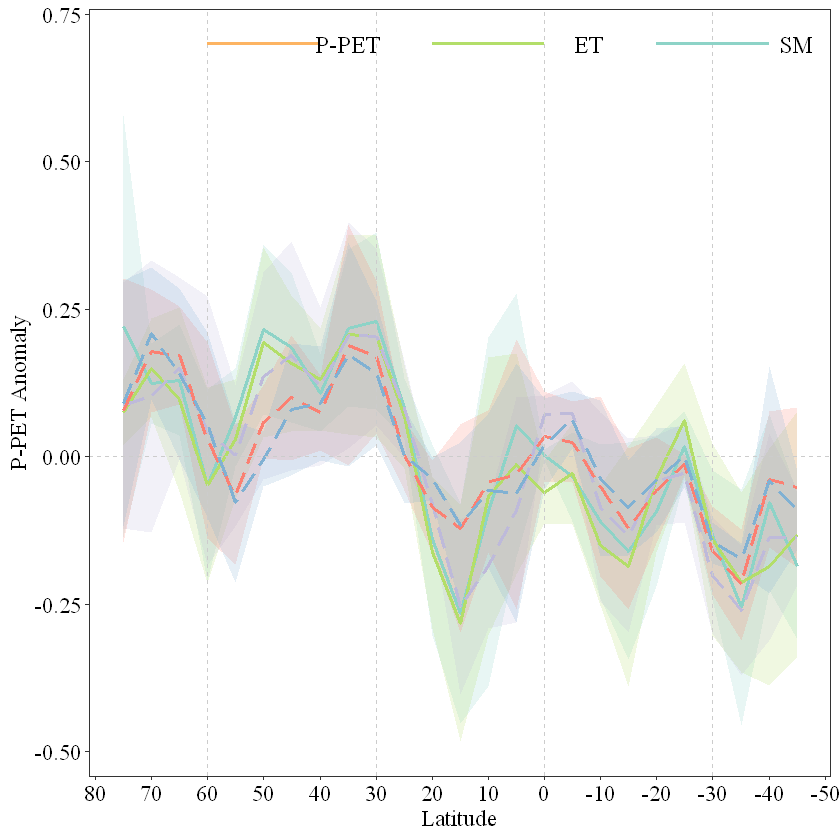

In [ ]:
#绘制不同lag
fontsize=14
library(ggplot2)
library(RColorBrewer)
wid=1
p1=ggplot(data1,aes(x=lat))+
   geom_ribbon(aes(ymin=data1[,8],ymax=data1[,9]),alpha=0.2,fill=c(brewer.pal(7,"Set3")[1]))+
   geom_ribbon(aes(ymin=data2[,8],ymax=data2[,9]),alpha=0.2,fill=c(brewer.pal(7,"Set3")[7]))+
   geom_ribbon(aes(ymin=data3[,8],ymax=data3[,9]),alpha=0.2,fill=c(brewer.pal(7,"Set3")[3]))+
   geom_ribbon(aes(ymin=data4[,8],ymax=data4[,9]),alpha=0.2,fill=c(brewer.pal(7,"Set3")[4]))+
   geom_ribbon(aes(ymin=data5[,8],ymax=data5[,9]),alpha=0.2,fill=c(brewer.pal(7,"Set3")[5]))+
  # #geom_ribbon(aes(ymin=data6[,8],ymax=data6[,9]),alpha=0.4,fill=c(brewer.pal(7,"Set3")[6]))+
   geom_line(aes(x=lat,y=data1[,5]),col=c(brewer.pal(7,"Set3")[1]),linetype=1,lwd=wid)+
   geom_line(aes(x=lat,y=data2[,5]),col=c(brewer.pal(7,"Set3")[7]),linetype=1,lwd=wid)+
   geom_line(aes(x=lat,y=data3[,5]),col=c(brewer.pal(7,"Set3")[3]),linetype=5,lwd=wid)+
   geom_line(aes(x=lat,y=data4[,5]),col=c(brewer.pal(7,"Set3")[4]),linetype=5,lwd=wid)+
   geom_line(aes(x=lat,y=data5[,5]),col=c(brewer.pal(7,"Set3")[5]),linetype=5,lwd=wid)+
  # #geom_line(aes(x=lat,y=data6[,5]),col=c(brewer.pal(7,"Set3")[6]),linetype=1,lwd=wid)+
   geom_hline(aes(yintercept=0), linetype="dashed",colour='#CCCCCC',lwd=wid/2)+
  geom_vline(aes(xintercept=1000), linetype="dashed",colour='#CCCCCC',lwd=wid/2)+
     geom_vline(aes(xintercept=700), linetype="dashed",colour='#CCCCCC',lwd=wid/2)+
     geom_vline(aes(xintercept=1300), linetype="dashed",colour='#CCCCCC',lwd=wid/2)+
      geom_vline(aes(xintercept=400), linetype="dashed",colour='#CCCCCC',lwd=wid/2)+
    #  geom_vline(aes(xintercept=1600), linetype="dashed",colour='black')+
  ylab("P-PET Anomaly")+
  xlab("Latitude")+
  xlim(-60,60)+
  scale_x_continuous(breaks=c(100,200,300,400,500,600,700,800,
                              900,1000,1100,1200,1300,1400,1500,1600,
                              1700,1800),
                     labels =c("90","80","70","60","50","40","30","20","10","0","-10",
                               "-20","-30","-40","-50","-60","-70","-80"))+
  annotate("segment",x=1200,xend=1400,y=0.7,yend=0.7,colour=c(brewer.pal(7,"Set3")[1]),size=wid)+
  annotate("segment",x=800,xend=1000,y=0.7,yend=0.7,colour=c(brewer.pal(7,"Set3")[7]),size=wid)+
  # annotate("segment",x=800,xend=1000,y=0.7,yend=0.7,colour=c(brewer.pal(7,"Set3")[3]),size=wid)+
  # annotate("segment",x=800,xend=1000,y=0.6,yend=0.6,colour=c(brewer.pal(7,"Set3")[4]),size=wid)+
  # annotate("segment",x=400,xend=600,y=0.7,yend=0.7,colour=c(brewer.pal(7,"Set3")[5]),size=wid)+
  annotate("segment",x=400,xend=600,y=0.7,yend=0.7,colour=c(brewer.pal(7,"Set3")[6]),size=wid)+
  annotate("text",parse=F,label="SM",x=1450,y=0.7,colour="black",size=5,family="serif")+
   annotate("text",parse=F,label="ET",x=1080,y=0.7,colour="black",size=5,family="serif")+
  # annotate("text",parse=F,label="PET",x=1080,y=0.7,colour="black",size=5,family="serif")+
  # annotate("text",parse=F,label="T",x=1080,y=0.6,colour="black",size=5,family="serif")+
  #annotate("text",parse=F,label="P",x=650,y=0.7,colour="black",size=5,family="serif")+
  annotate("text",parse=F,label="P-PET",x=650,y=0.7,colour="black",size=5,family="serif")+
  theme_bw()+
  theme(#axis.title.x = element_blank(),
    legend.position = "top",#c(0.5,0.5),
    legend.title = element_text(face='bold',colour='black',size=fontsize,hjust=0),
    legend.text = element_text(face='bold',colour='black',size=fontsize,hjust=0),
    legend.background = element_rect(fill = 'transparent'),#, colour = 'black'
    axis.text = element_text(colour='black',size=fontsize,hjust=.5,family="serif"),#face='bold',
    axis.title = element_text(colour='black',size=fontsize,hjust=.5,family="serif"),#face='bold',
    #axis.title.y = element_blank(),
    #axis.title.x = element_blank(),
    plot.title=element_text(hjust=0.5),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank()
  )
  p1

In [ ]:
data1

,lat,SM,SM.1,SM.2,sm1,sm2,sm3,msi,msa
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,250,0.683459450,0.29891780,-0.075797670,0.302193195,0.37963916,1.25627964,-0.0774459625,0.681832352
2,300,0.257004357,0.35838282,-0.086151634,0.176411848,0.23296799,1.32059152,-0.0565561429,0.409379839
3,350,0.093238794,0.31322481,-0.188235747,0.072742619,0.25135780,3.45544057,-0.1786151792,0.324100418
4,400,0.013231268,0.23756230,-0.370734536,-0.039980321,0.30761968,-7.69427738,-0.3475999990,0.267639357
5,450,0.104625315,0.12049788,-0.130633194,0.031496667,0.14063269,4.46500230,-0.1091360226,0.172129356
6,500,0.104635292,0.18661615,0.007683137,0.099644861,0.08957083,0.89890069,0.0100740267,0.189215695
7,550,-0.002138299,0.08489990,0.050877454,0.044546352,0.04386313,0.98466267,0.0006832219,0.088409482
8,600,-0.086142002,-0.12618284,-0.089932217,-0.100752353,0.02210483,-0.21939769,-0.1228571864,-0.078647519
9,650,0.047434251,-0.09125632,-0.199921922,-0.081247996,0.12398143,-1.52596288,-0.2052294212,0.042733430


Scale for 'x' is already present. Adding another scale for 'x', which will
replace the existing scale.



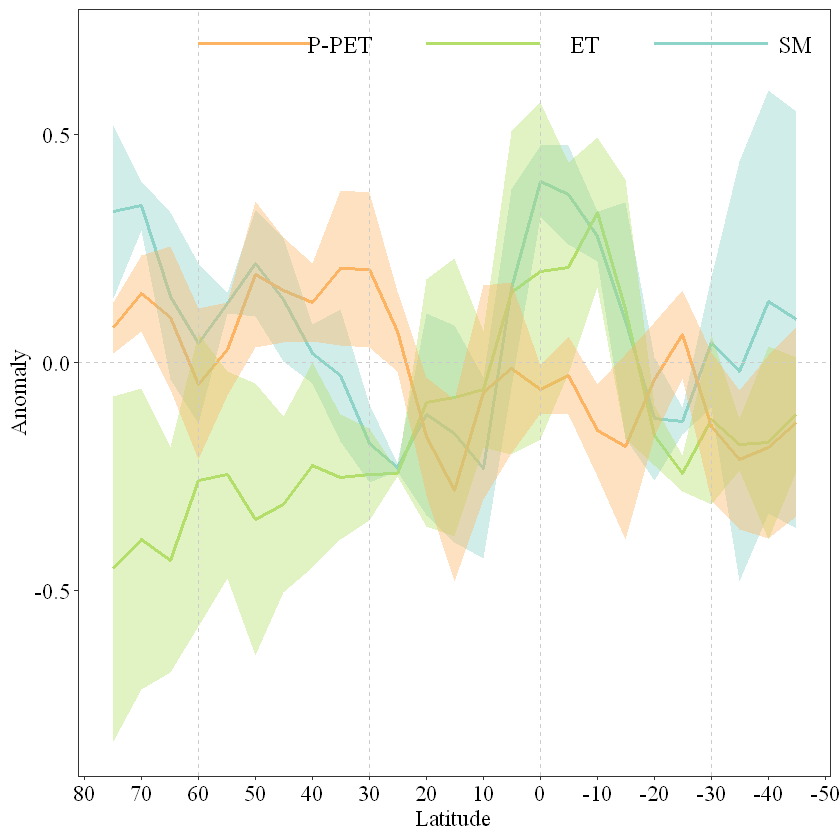

In [ ]:
fontsize=14
library(ggplot2)
library(RColorBrewer)
wid=1
p1=ggplot(data1,aes(x=lat))+
  geom_line(aes(x=lat,y=data1[,5]),col=c(brewer.pal(7,"Set3")[1]),linetype=1,lwd=wid)+
  geom_line(aes(x=lat,y=data2[,5]),col=c(brewer.pal(7,"Set3")[7]),linetype=1,lwd=wid)+
  #geom_line(aes(x=lat,y=data3[,5]),col=c(brewer.pal(7,"Set3")[3]),linetype=5,lwd=wid)+
  #geom_line(aes(x=lat,y=data4[,5]),col=c(brewer.pal(7,"Set3")[4]),linetype=5,lwd=wid)+
  #geom_line(aes(x=lat,y=data5[,5]),col=c(brewer.pal(7,"Set3")[5]),linetype=5,lwd=wid)+
  geom_line(aes(x=lat,y=data6[,5]),col=c(brewer.pal(7,"Set3")[6]),linetype=1,lwd=wid)+
  geom_ribbon(aes(ymin=data1[,8],ymax=data1[,9]),alpha=0.4,fill=c(brewer.pal(7,"Set3")[1]))+
  geom_ribbon(aes(ymin=data2[,8],ymax=data2[,9]),alpha=0.4,fill=c(brewer.pal(7,"Set3")[7]))+
  #geom_ribbon(aes(ymin=data3[,8],ymax=data3[,9]),alpha=0.4,fill=c(brewer.pal(7,"Set3")[3]))+
  #geom_ribbon(aes(ymin=data4[,8],ymax=data4[,9]),alpha=0.4,fill=c(brewer.pal(7,"Set3")[4]))+
  #geom_ribbon(aes(ymin=data5[,8],ymax=data5[,9]),alpha=0.4,fill=c(brewer.pal(7,"Set3")[5]))+
  geom_ribbon(aes(ymin=data6[,8],ymax=data6[,9]),alpha=0.4,fill=c(brewer.pal(7,"Set3")[6]))+
   geom_hline(aes(yintercept=0), linetype="dashed",colour='#CCCCCC',lwd=wid/2)+
  geom_vline(aes(xintercept=1000), linetype="dashed",colour='#CCCCCC',lwd=wid/2)+
     geom_vline(aes(xintercept=700), linetype="dashed",colour='#CCCCCC',lwd=wid/2)+
     geom_vline(aes(xintercept=1300), linetype="dashed",colour='#CCCCCC',lwd=wid/2)+
      geom_vline(aes(xintercept=400), linetype="dashed",colour='#CCCCCC',lwd=wid/2)+
    #  geom_vline(aes(xintercept=1600), linetype="dashed",colour='black')+
  ylab("Anomaly")+
  xlab("Latitude")+
  xlim(-60,60)+
  scale_x_continuous(breaks=c(100,200,300,400,500,600,700,800,
                              900,1000,1100,1200,1300,1400,1500,1600,
                              1700,1800),
                     labels =c("90","80","70","60","50","40","30","20","10","0","-10",
                               "-20","-30","-40","-50","-60","-70","-80"))+
  annotate("segment",x=1200,xend=1400,y=0.7,yend=0.7,colour=c(brewer.pal(7,"Set3")[1]),size=wid)+
  annotate("segment",x=800,xend=1000,y=0.7,yend=0.7,colour=c(brewer.pal(7,"Set3")[7]),size=wid)+
  # annotate("segment",x=800,xend=1000,y=0.7,yend=0.7,colour=c(brewer.pal(7,"Set3")[3]),size=wid)+
  # annotate("segment",x=800,xend=1000,y=0.6,yend=0.6,colour=c(brewer.pal(7,"Set3")[4]),size=wid)+
  # annotate("segment",x=400,xend=600,y=0.7,yend=0.7,colour=c(brewer.pal(7,"Set3")[5]),size=wid)+
  annotate("segment",x=400,xend=600,y=0.7,yend=0.7,colour=c(brewer.pal(7,"Set3")[6]),size=wid)+
  annotate("text",parse=F,label="SM",x=1450,y=0.7,colour="black",size=5,family="serif")+
   annotate("text",parse=F,label="ET",x=1080,y=0.7,colour="black",size=5,family="serif")+
  # annotate("text",parse=F,label="PET",x=1080,y=0.7,colour="black",size=5,family="serif")+
  # annotate("text",parse=F,label="T",x=1080,y=0.6,colour="black",size=5,family="serif")+
  #annotate("text",parse=F,label="P",x=650,y=0.7,colour="black",size=5,family="serif")+
  annotate("text",parse=F,label="P-PET",x=650,y=0.7,colour="black",size=5,family="serif")+
  theme_bw()+
  theme(#axis.title.x = element_blank(),
    legend.position = "top",#c(0.5,0.5),
    legend.title = element_text(face='bold',colour='black',size=fontsize,hjust=0),
    legend.text = element_text(face='bold',colour='black',size=fontsize,hjust=0),
    legend.background = element_rect(fill = 'transparent'),#, colour = 'black'
    axis.text = element_text(colour='black',size=fontsize,hjust=.5,family="serif"),#face='bold',
    axis.title = element_text(colour='black',size=fontsize,hjust=.5,family="serif"),#face='bold',
    #axis.title.y = element_blank(),
    #axis.title.x = element_blank(),
    plot.title=element_text(hjust=0.5),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank()
  )
  p1

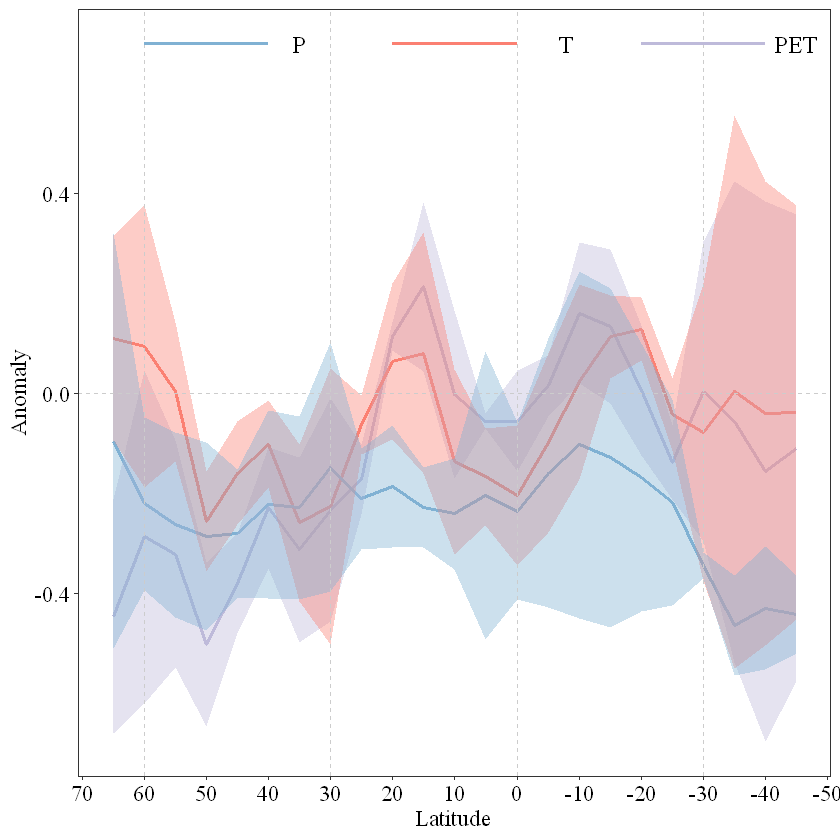

In [ ]:
fontsize=14
library(ggplot2)
library(RColorBrewer)
wid=1
p2=ggplot(data1,aes(x=lat))+
  #geom_line(aes(x=lat,y=data1[,5]),col=c(brewer.pal(7,"Set3")[1]),linetype=1,lwd=wid)+
  #geom_line(aes(x=lat,y=data2[,5]),col=c(brewer.pal(7,"Set3")[7]),linetype=1,lwd=wid)+
  geom_line(aes(x=lat,y=data3[,5]),col=c(brewer.pal(7,"Set3")[3]),linetype=1,lwd=wid)+
  geom_line(aes(x=lat,y=data4[,5]),col=c(brewer.pal(7,"Set3")[4]),linetype=1,lwd=wid)+
  geom_line(aes(x=lat,y=data5[,5]),col=c(brewer.pal(7,"Set3")[5]),linetype=1,lwd=wid)+
  #geom_line(aes(x=lat,y=data6[,5]),col=c(brewer.pal(7,"Set3")[6]),linetype=1,lwd=wid)+
  #geom_ribbon(aes(ymin=data1[,8],ymax=data[,9]),alpha=0.4,fill=c(brewer.pal(7,"Set3")[1]))+
  #geom_ribbon(aes(ymin=data2[,8],ymax=data2[,9]),alpha=0.4,fill=c(brewer.pal(7,"Set3")[7]))+
  geom_ribbon(aes(ymin=data3[,8],ymax=data3[,9]),alpha=0.4,fill=c(brewer.pal(7,"Set3")[3]))+
  geom_ribbon(aes(ymin=data4[,8],ymax=data4[,9]),alpha=0.4,fill=c(brewer.pal(7,"Set3")[4]))+
  geom_ribbon(aes(ymin=data5[,8],ymax=data5[,9]),alpha=0.4,fill=c(brewer.pal(7,"Set3")[5]))+
  #geom_ribbon(aes(ymin=data6[,8],ymax=data6[,9]),alpha=0.4,fill=c(brewer.pal(7,"Set3")[6]))+
  geom_hline(aes(yintercept=0), linetype="dashed",colour='#CCCCCC',lwd=wid/2)+
  geom_vline(aes(xintercept=1000), linetype="dashed",colour='#CCCCCC',lwd=wid/2)+
     geom_vline(aes(xintercept=700), linetype="dashed",colour='#CCCCCC',lwd=wid/2)+
     geom_vline(aes(xintercept=1300), linetype="dashed",colour='#CCCCCC',lwd=wid/2)+
      geom_vline(aes(xintercept=400), linetype="dashed",colour='#CCCCCC',lwd=wid/2)+
  ylab("Anomaly")+
  xlab("Latitude")+
  #ylim(-1,1)+
  scale_x_continuous(breaks=c(100,200,300,400,500,600,700,800,
                              900,1000,1100,1200,1300,1400,1500,1600,
                              1700,1800),
                     labels =c("90","80","70","60","50","40","30","20","10","0","-10",
                               "-20","-30","-40","-50","-60","-70","-80"))+
  # annotate("segment",x=1200,xend=1400,y=0.7,yend=0.7,colour=c(brewer.pal(7,"Set3")[1]),size=wid)+
  # annotate("segment",x=1200,xend=1400,y=0.6,yend=0.6,colour=c(brewer.pal(7,"Set3")[7]),size=wid)+
  annotate("segment",x=1200,xend=1400,y=0.7,yend=0.7,colour=c(brewer.pal(7,"Set3")[3]),size=wid)+
  annotate("segment",x=800,xend=1000,y=0.7,yend=0.7,colour=c(brewer.pal(7,"Set3")[4]),size=wid)+
  annotate("segment",x=400,xend=600,y=0.7,yend=0.7,colour=c(brewer.pal(7,"Set3")[5]),size=wid)+
  # annotate("segment",x=400,xend=600,y=0.6,yend=0.6,colour=c(brewer.pal(7,"Set3")[6]),size=wid)+
  # annotate("text",parse=F,label="SM",x=1450,y=0.7,colour="black",size=5,family="serif")+
  # annotate("text",parse=F,label="ET",x=1450,y=0.6,colour="black",size=5,family="serif")+
  annotate("text",parse=F,label="PET",x=1450,y=0.7,colour="black",size=5,family="serif")+
  annotate("text",parse=F,label="T",x=1080,y=0.7,colour="black",size=5,family="serif")+
  annotate("text",parse=F,label="P",x=650,y=0.7,colour="black",size=5,family="serif")+
  # annotate("text",parse=F,label="P-PET",x=650,y=0.6,colour="black",size=5,family="serif")+
  theme_bw()+
  theme(#axis.title.x = element_blank(),
    legend.position = "top",#c(0.5,0.5),
    legend.title = element_text(face='bold',colour='black',size=fontsize,hjust=0),
    legend.text = element_text(face='bold',colour='black',size=fontsize,hjust=0),
    legend.background = element_rect(fill = 'transparent'),#, colour = 'black'
    axis.text = element_text(colour='black',size=fontsize,hjust=.5,family="serif"),#face='bold',
    axis.title = element_text(colour='black',size=fontsize,hjust=.5,family="serif"),#face='bold',
    #axis.title.y = element_blank(),
    #axis.title.x = element_blank(),
    plot.title=element_text(hjust=0.5),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank()
  )
  p2

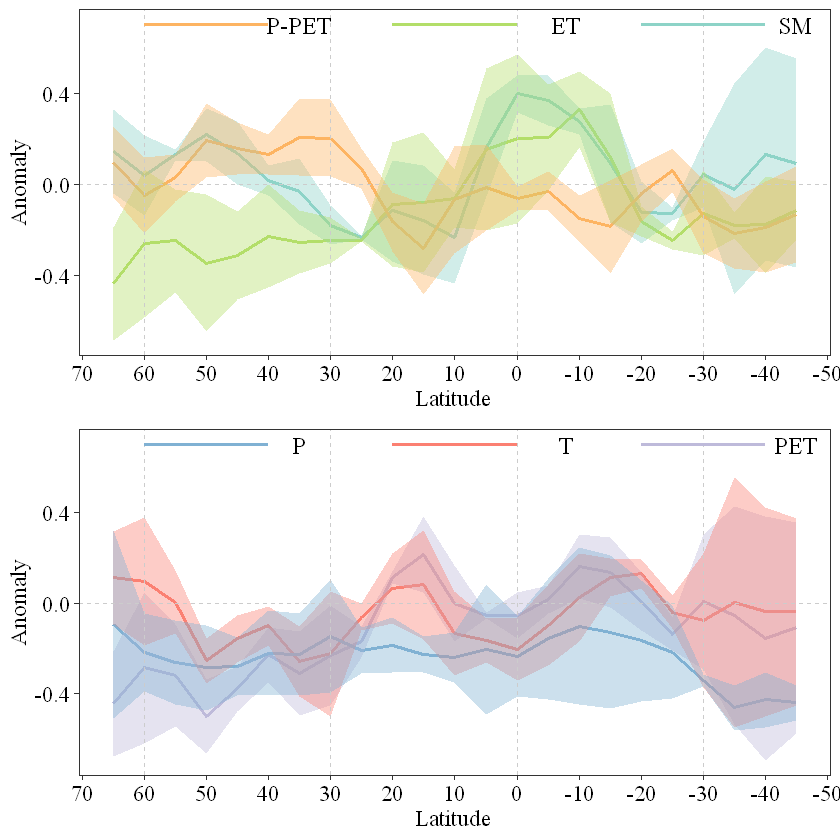

In [ ]:
ggpubr::ggarrange(p1,p2,nrow =2,common.legend = T,legend = "bottom") 

In [ ]:
pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture2\\")
pdf(paste0(pic_name,"10.before1_var3.pdf"),width = 8, height = 6)
ggpubr::ggarrange(p1,p2,nrow =2,common.legend = T,legend = "bottom") 
dev.off()

png 
  2

15.不同变量异常的散点图

In [ ]:
#全球
data_name=c("ERA5LAND","ERA5","GLEAM")
   j=1 #1:3
   load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\","fd_var_before_lag_onset_total_",data_name[j],".RData")) #j是数据集1:3
   
   #load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\","fd_var_onset_total_",data_name[j],".RData"))
   #load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\region\\","fd_var_",region_name[k],"_",data_name[j],".RData"))
   data <- fd_var_onset
   data$p_pet <-data$p-data$pet 
   
   fontsize = 12
   size=12
   
   # point <- function(i){
   #   dataname <-  data_name[i]
   #   load(paste0("I:\\1.data_file\\09 GLEAM\\16成因分析\\",dataname,".RData"))
   
   library(raster)
   library(rgdal)
   library(ggplot2)
   #mycolor =c("#6EAADC","#064892","#F58C34","#E31317")#c("#2973B0","#F58C34")# #,"#FFD872","#F98A43","#DC7469","#C51721")
   #fontsize = 12
   #color_group = paste0('a',1:12)
   #data$degree <- as.character(data$degree )
   data <- data[which(data$p<=10),]
   data <- data[which(data$sm<=10),]
   data <- data[which(data$et<=10),]
   data <- data[which(data$t2m>=-6),]
   data$ET<-  cut(data$et,breaks=c(-10,0,10),labels=c("<=0",">0"))
   data$Precipitation<-  cut(data$p,breaks=c(-10,0,10),labels=c("<=0",">0"))
   #data$LAT <- cut(data$lat,breaks=c(-10,0,10),labels=c("<=0",">0"))
   data$Soil_moisture <- cut(data$sm,breaks=c(-10,-2,0,2,10),labels=c("-10","-2","2","10"))
   # #mycolor =c("#9EC299","#FCCC01")#,"#F58C34","#E31317") #,"#FFD872","#F98A43","#DC7469","#C51721")
   
   #data <- data[which(data$tmean<0 & data$pet<0),]
   #names(data) <- c("lon_lat","time","lat","lon","et","Soil_moisture","tmean","pr","p_et","Precipitation","soil_moisture")      
   alpha_num <- 0.5
   size=18
   if(dim(data)[1]<5000){
     data1 <- data
   }else{
     data1 <- data[sample(nrow(data),5000),]
   }
   # 
   #save(data1,file=paste0("H:\\NO.1 flash drought\\03data\\meteorological\\sameple_5000point_",data_name[j],".RData"))
   #（保存过了）
   


In [ ]:
   #
   #1）四个象限的占比
   aa <- data1[which(data1$t2m<0&data1$et>0),]
   bb <- data1[which(data1$t2m>0&data1$et>0),]
   cc <- data1[which(data1$t2m<0&data1$et<0),]
   dd <- data1[which(data1$t2m>0&data1$et<0),]
   dim(aa)[1]/5000     
   dim(bb)[1]/5000   
   dim(cc)[1]/5000   
   dim(dd)[1]/5000 
   
   aa <- data[which(data$t2m<0&data$et>0),]
   bb <- data[which(data$t2m>0&data$et>0),]
   cc <- data[which(data$t2m<0&data$et<0),]
   dd <- data[which(data$t2m>0&data$et<0),]
   dim(aa)[1]/dim(data)[1]   #(0.135+0.139+0.145)/3=0.140
   dim(bb)[1]/dim(data)[1]    #(0.26+0.275+0.268)/3=0.268
   dim(cc)[1]/dim(data)[1]  #(0.396+0.370+0.356)/3=0.374 
   dim(dd)[1]/dim(data)[1]  #(0.208+0.216+0.231)/3=0.218
   


[1] 0.1394

[1] 0.2804

[1] 0.3704

[1] 0.2098

[1] 0.1390433

[1] 0.2750356

[1] 0.369718

[1] 0.2162032

In [ ]:
   #2）降水占比
   ee <- data1[which(data1$p<0),]
   dim(ee)[1]/5000 
   
   ff <- data[which(data$p<0),]#(72.4+79.6+50.2)/3=67.4
   dim(ff)[1]/dim(data)[1]
   
   #4）sm占比
   gg <- data[which(data$sm<0),]#(53.8+56.4+61.7)/3=57.3
   dim(gg)[1]/dim(data)[1]
   
   #5）sm.p充足的情况下
   hh <- data[which(data$p>0),]  #降雨充足
   dim(hh)[1]/dim(data)[1]
   ff <- hh[which(hh$sm>0),]  #sm充足
   dim(ff)[1]/dim(hh)[1]    #(48.3+47.5+27.7)/3=41.2
   
   #在P/SM充足的条件下，低温和高蒸更容易出现干旱
   ii <- ff[which(ff$t2m<0),] #低温占比(61.3+64.2+14.7)/3=46.7
   dim(ii)[1]/dim(ff)[1]
   jj <- ff[which(ff$et>0),]  #高蒸发(60.5+55.3+90)/3=68.6
   dim(jj)[1]/dim(ff)[1]
   

ii <- ff[which(ff$et<0&ff$t2m>0),] #(5.6+5+4.4)/3=5
   dim(ii)[1]/dim(ff)[1]
ii <- ff[which(ff$et<0&ff$t2m<0),] #(4.4+39.7+35.1)/3=26.4
   dim(ii)[1]/dim(ff)[1]
ii <- ff[which(ff$et>0&ff$t2m>0),] #(79.7+30.8+34.2)/3=48.2
   dim(ii)[1]/dim(ff)[1]
ii <- ff[which(ff$et>0&ff$t2m<0),] #(10.3+24.4+26.2)/3=20.3
   dim(ii)[1]/dim(ff)[1]


[1] 0.7288

[1] 0.7235044

[1] 0.5379176

[1] 0.276493

[1] 0.4832467

[1] 0.6129611

[1] 0.6047899

[1] 0.04458586

[1] 0.3506242

[1] 0.342453

[1] 0.2623369

In [ ]:
   #在P/SM充足的条件下，
   ii <- ff[which(ff$et<0),] 
   dim(ii)[1]/dim(ff)[1]
   #在P/SM充足的条件下，低蒸发的条件下，
   jj <- ii[which(ii$t2m>0),]  #高温(4.5+5+5.6)/3=5，低温95.5%
   dim(jj)[1]/dim(ff)[1]
   


   #在P/SM充足的条件下，
   ii <- ff[which(ff$et>0),] 
   dim(ii)[1]/dim(ff)[1]
   #在P/SM充足的条件下，高蒸发的条件下，
   jj <- ii[which(ii$t2m>0),]  #高温34.2%，低温65.8%
   dim(jj)[1]/dim(ff)[1]
   
   #在P/SM充足的条件下，
   ii <- ff[which(ff$t2m<0),] 
   dim(ii)[1]/dim(ff)[1]
   #在P/SM充足的条件下，低温的条件下，
   jj <- ii[which(ii$et>0),]  #高蒸发26.2%，低73.8%
   dim(jj)[1]/dim(ff)[1]
   
   #在P/SM充足的条件下，
   ii <- ff[which(ff$t2m>0),] 
   dim(ii)[1]/dim(ff)[1]
   #在P/SM充足的条件下，高温的条件下，
   jj <- ii[which(ii$et>0),]  #高蒸发34.2%，低65.8%
   dim(jj)[1]/dim(ff)[1]
   
   


[1] 0.1001085

[1] 0.05605304

[1] 0.05605304

[1] 0.04405547

[1] 0.7968985

[1] 0.102993

[1] 0.8998915

[1] 0.7968985

[1] 0.1470485

[1] 0.102993

[1] 0.8529515

[1] 0.7968985

In [ ]:
load(file=paste0("H:\\NO.1 flash drought\\03data\\meteorological\\sameple_5000point_",data_name[j],".RData"))
 head(data1)

,sm,et,pet,t2m,p,number,fd_intensity,lat,lon,p_pet,ET,Precipitation,Soil_moisture
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<fct>
973381,-1.181263,-1.1796953,0.5507761,0.001126316,0.5915552,95592,1,24.0,95.5,0.04077908,<=0,>0,-2
1479880,2.372234,1.1733003,-1.0255513,0.906395753,1.0575032,147150,1,-12.0,-45.5,2.08305448,>0,>0,10
616772,-1.595007,1.0021874,1.0828553,0.721347368,0.8666717,82274,4,33.0,-83.5,-0.21618356,>0,>0,-2
1227781,1.111102,1.9061170,2.0474100,-0.035924426,-0.1049881,107644,2,15.5,1.5,-2.15239808,>0,<=0,2
814187,2.518223,2.1241600,0.5536638,0.472114442,0.4858521,88367,3,29.0,83.0,-0.06781177,>0,>0,10
969399,-0.390554,-0.4030669,-0.3930149,0.016221713,0.2416772,95542,1,24.0,70.5,0.63469206,<=0,>0,-2


In [ ]:
rm(list=ls())
 data_name=c("ERA5LAND","ERA5","GLEAM")
 fontsize = 12
   alpha_num <- 0.5
   size=18
 fun=function(j){
library(raster)
library(rgdal)
library(ggplot2)
load(file=paste0("H:\\NO.1 flash drought\\03data\\meteorological\\sameple_5000point_",data_name[j],".RData"))
fontsize = 12
alpha_num <- 0.5
size=18

p=ggplot()+#data1,aes(x=et,y=t2m)
  geom_point(data=data1,aes(x=t2m,y=et,colour=sm,shape=Precipitation),size=2,alpha=alpha_num)+#,shape=ET
  geom_hline(aes(yintercept=0), linetype="dashed",colour='black')+
  geom_vline(aes(xintercept=0), linetype="dashed",colour='black')+
  #scale_x_continuous(breaks=seq(-6,6,2),expand = c(0,0))+#这个可以去掉与Y轴间隙
  # scale_y_continuous(breaks=seq(-6,6,2),expand = c(0,0))+##
  theme(panel.background = element_rect(fill = 'transparent',color = 'black'),
        panel.grid=element_blank(),
        axis.text = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
        axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
        plot.title=element_text(hjust=0.5,vjust = -8,family="serif"),
        legend.position="bottom",
        legend.direction = c('horizontal'),
        legend.key.width = unit(1.5, "cm"),
        legend.key.height = unit(0.5, "cm"),
        legend.key = element_rect(
          #color = "red", # 框线色
          fill = 'transparent'))+ # 填充色)+
  #scale_colour_manual(values = mycolor)+
  scale_colour_gradientn(colours = c("#000084","#0007FD","#00D5FF","#9AFF5C","#FFE401","#FEA700","#FF2801","#7E0001"))+
  scale_shape_manual(values=c(1,2))+#17,1,19,17,
  ggtitle(data_name[j])+
  guides(fill=guide_legend(nrow=1),family="serif")+  #图例分为几行或者几列展示
  ylab('ET Anomaly')+
  xlab('T Anomaly')#+
#stat_ellipse(type = "t", linetype = 2,colour="red",size=1)
# ggsave(paste0("J:\\1.data_file\\09 GLEAM\\7draw\\散点图\\P9\\",dataname,".png"),
#        width = 14,height =12,units = "cm"

  return(p)
}





In [ ]:
fun(1)

ERROR: Error in png(tf, width, height, "in", pointsize, bg, res, antialias = antialias): 无法启动png()装置


plot without title

In [ ]:
p1=fun(1)
p2=fun(2)
p3=fun(3)
ggpubr::ggarrange(p1,p2,p3,ncol = 2, nrow =2,common.legend = T,legend = "bottom") 


ERROR: Error in png(tf, width, height, "in", pointsize, bg, res, antialias = antialias): 无法启动png()装置


plot without title

In [ ]:
pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture2\\")
pdf(paste0(pic_name,"9.var_point.pdf"),width =8, height = 6)
ggpubr::ggarrange(p1,p2,p3,ncol = 2, nrow =2,common.legend = T,legend = "bottom") 
dev.off()

png 
  2

In [ ]:
#分区
data_name=c("ERA5LAND","ERA5","GLEAM")
region_name <- c("WUS","MXO","EBZ","ATD","SPN","SAR","GRV","SAF","MDE","WCN","IND","NAT")
j=1
k=2
fun=function(j,k){
#load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\","fd_var_onset_total_",data_name[j],".RData"))
load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\region\\","fd_var_",region_name[k],"_",data_name[j],".RData"))
data <- fd_var_onset
data$p_pet <-data$p-data$pet 

fontsize = 12
size=12

# point <- function(i){
#   dataname <-  data_name[i]
#   load(paste0("I:\\1.data_file\\09 GLEAM\\16成因分析\\",dataname,".RData"))

library(raster)
library(rgdal)
library(ggplot2)
#mycolor =c("#6EAADC","#064892","#F58C34","#E31317")#c("#2973B0","#F58C34")# #,"#FFD872","#F98A43","#DC7469","#C51721")
#fontsize = 12
#color_group = paste0('a',1:12)
#data$degree <- as.character(data$degree )
data <- data[which(data$p<=10),]
data <- data[which(data$sm<=10),]
data <- data[which(data$et<=10),]
data <- data[which(data$t2m>=-6),]
data$ET<-  cut(data$et,breaks=c(-10,0,10),labels=c("<=0",">0"))
data$Precipitation<-  cut(data$p,breaks=c(-10,0,10),labels=c("<=0",">0"))
# data$Soil_moisture <- cut(data$sm,breaks=c(-10,-2,0,2,10),labels=c("-10","-2","2","10"))
# #mycolor =c("#9EC299","#FCCC01")#,"#F58C34","#E31317") #,"#FFD872","#F98A43","#DC7469","#C51721")

#data <- data[which(data$tmean<0 & data$pet<0),]
#names(data) <- c("lon_lat","time","lat","lon","et","Soil_moisture","tmean","pr","p_et","Precipitation","soil_moisture")      
alpha_num <- 0.5
size=18
if(dim(data)[1]<5000){
  data1 <- data
}else{
  data1 <- data[sample(nrow(data),5000),]
}
# 
p=ggplot(data1,aes(x=et,y=t2m))+
  geom_point(data=data1,aes(x=p,y=t2m,colour=sm,shape=ET),size=2,alpha=alpha_num)+
  geom_hline(aes(yintercept=0), linetype="dashed",colour='black')+
  geom_vline(aes(xintercept=0), linetype="dashed",colour='black')+
  scale_x_continuous(breaks=seq(-6,6,2),expand = c(0,0))+#这个可以去掉与Y轴间隙
  scale_y_continuous(breaks=seq(-6,6,2),expand = c(0,0))+##
  theme(panel.background = element_rect(fill = 'transparent',color = 'black'),
        panel.grid=element_blank(),
        axis.text = element_text(face='bold',colour='black',size=fontsize,hjust=.5),
        axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5),
        plot.title=element_text(hjust=0.5,vjust = -8),
        legend.position="bottom",
        legend.direction = c('horizontal'),
        legend.key.width = unit(1.5, "cm"),
        legend.key.height = unit(0.5, "cm"),
        legend.key = element_rect(
          #color = "red", # 框线色
          fill = 'transparent'))+ # 填充色)+
  #scale_colour_manual(values = mycolor)+
  scale_colour_gradientn(colours = c("#000084","#0007FD","#00D5FF","#9AFF5C","#FFE401","#FEA700","#FF2801","#7E0001"))+
  scale_shape_manual(values=c(19,17))+#17,1,
  #ggtitle(dataname)+
  guides(fill=guide_legend(nrow=1))+  #图例分为几行或者几列展示
  xlab('p Anomally')+
  ylab('T Anomally')#+
  #stat_ellipse(type = "t", linetype = 2,colour="red",size=1)
# ggsave(paste0("J:\\1.data_file\\09 GLEAM\\7draw\\散点图\\P9\\",dataname,".png"),
#        width = 14,height =12,units = "cm"
return(p)
}
#p

In [ ]:
j=1
p1=fun(j,1)
p2=fun(j,2)
p3=fun(j,3)
p4=fun(j,4)
p5=fun(j,5)
p6=fun(j,6)
p7=fun(j,7)
p8=fun(j,8)
p9=fun(j,9)
p10=fun(j,10)
p11=fun(j,11)
p12=fun(j,12)



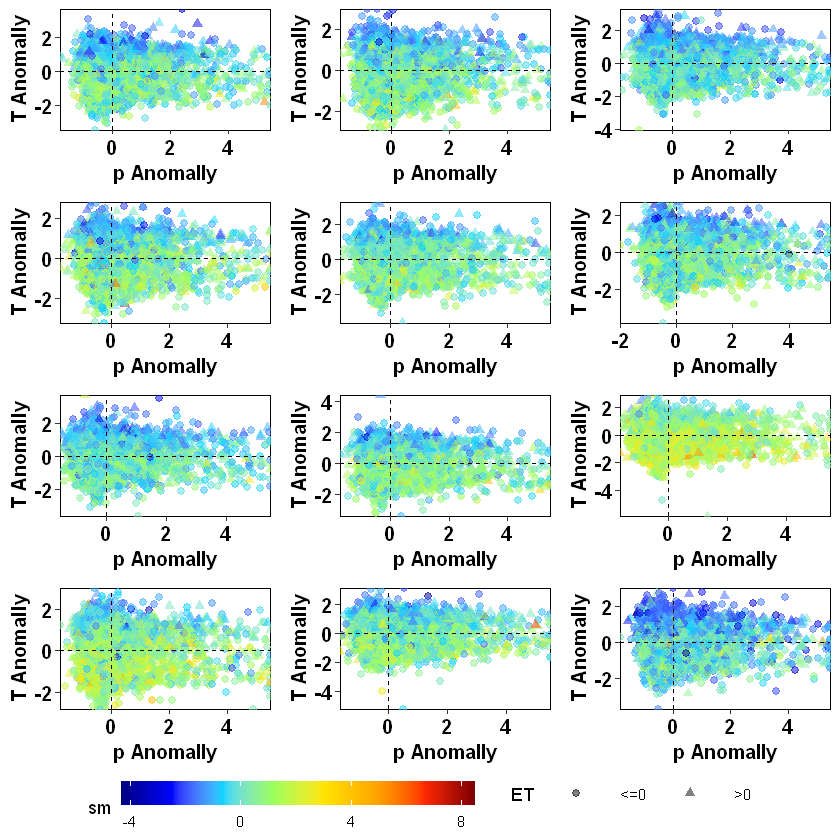

In [ ]:
ggpubr::ggarrange(p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11,p12,ncol = 3, nrow =4,common.legend = T,legend = "bottom") 


In [ ]:
pic_name=paste0("H:\\NO.1 flash drought\\5.小论文-骤旱\\论文大修12.2\\picture\\")
pdf(paste0(pic_name,"9.var_point.pdf"),width = 8, height = 6)
p
dev.off()


png 
  2

###############检查数据##################################

########################################################

16.处理T数据================================

  （1）检查插值0.5°的结果

class      : RasterBrick 
dimensions : 360, 720, 259200, 365  (nrow, ncol, ncell, nlayers)
resolution : 0.5, 0.5  (x, y)
extent     : -180, 180, -90, 90  (xmin, xmax, ymin, ymax)
crs        : +proj=longlat +datum=WGS84 +no_defs 
source     : memory
names      :   layer.1,   layer.2,   layer.3,   layer.4,   layer.5,   layer.6,   layer.7,   layer.8,   layer.9,  layer.10,  layer.11,  layer.12,  layer.13,  layer.14,  layer.15, ... 
min values : -56.44924, -60.68752, -61.41966, -61.28568, -61.83606, -60.69880, -60.74659, -62.16133, -57.49216, -56.67810, -55.95242, -55.16114, -52.85291, -53.61780, -53.42111, ... 
max values :  37.77954,  36.72701,  37.16038,  36.99219,  36.97679,  38.28465,  37.46050,  37.88535,  38.99886,  37.25054,  37.03497,  35.90719,  36.89326,  35.79448,  36.54136, ... 


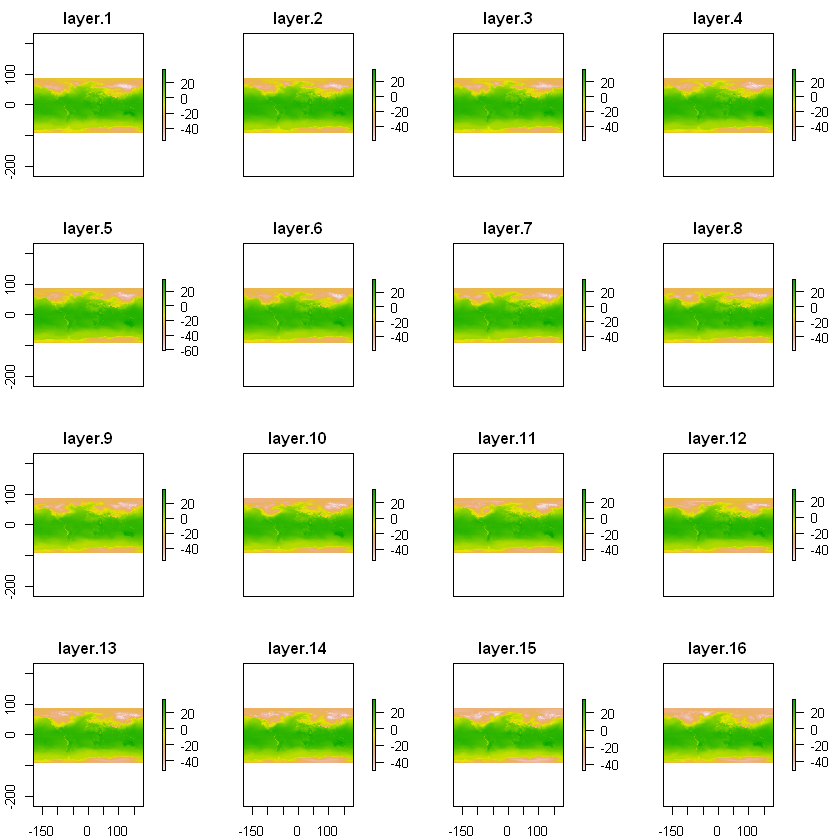

In [35]:
#1)检查插值0.5°的结果
YEAR=1982
load(paste0("I:\\1.data_file\\10气象数据\\ERA5\\T1\\et_inter_0.5_",YEAR,".RData"))
et_inter_data
plot(et_inter_data)   #插值结果没问题

（2）检查原始合成数据

In [182]:
#2）检查合成数据
#合成et_clean_inter代码（分成36个文件的1981-2020年的数据文件）
library(raster)
library(abind)
file_name_2=list.files("I:\\1.data_file\\10气象数据\\ERA5\\T1")
# file_name_1 <- grep("et_inter_0.5_.",file_name,value=T)
# file_name_2= paste0("/scratch/xtan/dsm_3/ERA5_Land/E/",file_name_1)
setwd("I:\\1.data_file\\10气象数据\\ERA5\\T1")
file_name_2

[1] "et_inter_0.5_1981.RData" "et_inter_0.5_1982.RData"
 [3] "et_inter_0.5_1983.RData" "et_inter_0.5_1984.RData"
 [5] "et_inter_0.5_1985.RData" "et_inter_0.5_1986.RData"
 [7] "et_inter_0.5_1987.RData" "et_inter_0.5_1988.RData"
 [9] "et_inter_0.5_1989.RData" "et_inter_0.5_1990.RData"
[11] "et_inter_0.5_1991.RData" "et_inter_0.5_1992.RData"
[13] "et_inter_0.5_1993.RData" "et_inter_0.5_1994.RData"
[15] "et_inter_0.5_1995.RData" "et_inter_0.5_1996.RData"
[17] "et_inter_0.5_1997.RData" "et_inter_0.5_1998.RData"
[19] "et_inter_0.5_1999.RData" "et_inter_0.5_2000.RData"
[21] "et_inter_0.5_2001.RData" "et_inter_0.5_2002.RData"
[23] "et_inter_0.5_2003.RData" "et_inter_0.5_2004.RData"
[25] "et_inter_0.5_2005.RData" "et_inter_0.5_2006.RData"
[27] "et_inter_0.5_2007.RData" "et_inter_0.5_2008.RData"
[29] "et_inter_0.5_2009.RData" "et_inter_0.5_2010.RData"
[31] "et_inter_0.5_2011.RData" "et_inter_0.5_2012.RData"
[33] "et_inter_0.5_2013.RData" "et_inter_0.5_2014.RData"
[35] "et_inter_0.5_2015.RData" "et_inter_0.5_2016.RData"
[37] "et_inter_0.5_2017.RData" "et_inter_0.5_2018.RData"
[39] "et_inter_0.5_2019.RData" "et_inter_0.5_2020.RData"

In [221]:
 load(paste0("I:\\1.data_file\\10气象数据\\ERA5\\T2\\et_clean_data_",1,".RData"))
  vardata1 = et_clean_inter_1[,1]  #提取某一天进行检查
length(vardata)

for(i_batch in 2:36){
  load(paste0("I:\\1.data_file\\10气象数据\\ERA5\\T2\\et_clean_data_",i_batch,".RData"))
   vardata = et_clean_inter_1[,1]
vardata1=c(vardata1, vardata)
print(i_batch)
}
length(vardata1)
data=data.frame(grid2,vardata1)
head(data)
save(data,file=paste0("I:\\1.data_file\\10气象数据\\ERA5\\recal\\t1.RData"))

[1] 7200

In [45]:
load(paste0("I:\\1.data_file\\10气象数据\\ERA5\\recal\\t1.RData"))
head(data)
summary(data)

,lat,lon,vardata1
,<dbl>,<dbl>,<dbl>
1,90,-180.0,-29.18575
2,90,-179.5,-29.18861
3,90,-179.0,-29.19141
4,90,-178.5,-29.19427
5,90,-178.0,-29.19634
6,90,-177.5,-29.19835


      lat              lon             vardata1      
 Min.   :-89.50   Min.   :-180.00   Min.   :-48.296  
 1st Qu.:-44.62   1st Qu.: -90.12   1st Qu.:-11.695  
 Median :  0.25   Median :  -0.25   Median :  7.246  
 Mean   :  0.25   Mean   :  -0.25   Mean   :  3.534  
 3rd Qu.: 45.12   3rd Qu.:  89.62   3rd Qu.: 22.300  
 Max.   : 90.00   Max.   : 179.50   Max.   : 37.933  

OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Warning message:
"Removed 42480 rows containing missing values (geom_tile)."


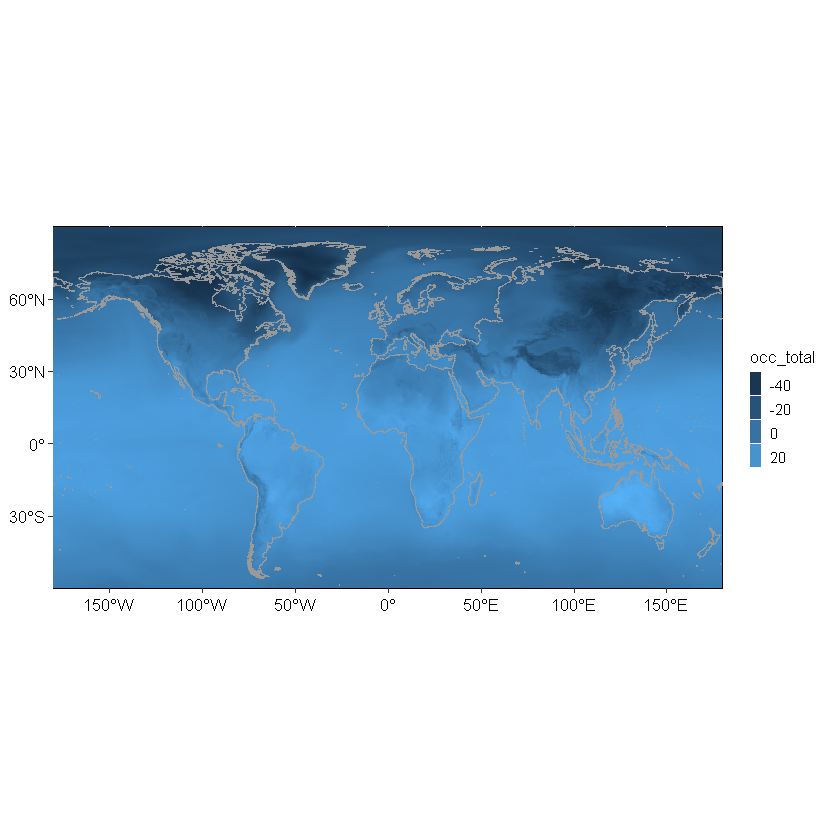

In [46]:
dat = data.frame(x=data$lon, y=data$lat, z= data$vardata1)#[(720*5*18+1):(720*5*19)]
names(dat)=c("lon","lat","occ_total")
library(raster)
library(rgdal)
library(ggplot2)
library(ggthemes)
library(rcartocolor)
library(viridis)
continent<-rgdal::readOGR('H:\\NO.1 flash drought\\02 地图文件\\continent shapefile\\continent.shp')
fontsize=10
colour <- c("#67001f","#b2182b","#d6604d","#f4a582","#fddbc7","#92c5de","#4393c3","#053061")
p=ggplot()+
  geom_hline(aes(yintercept = 60),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = 30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = -30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = -100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = 100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_tile(data = dat,aes(x=lon,y=lat,fill=occ_total))+
  geom_polygon(data = fortify(continent),aes(x = long, y = lat, group = group), colour ="grey60" ,fill = NA,size=0.1) + #
  theme(panel.background = element_rect(fill = 'transparent',color = 'black'),
        panel.grid.minor = element_blank(),
        axis.text = element_text(colour='black',size=fontsize,hjust=.5),
        #axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5),
        axis.title=element_blank(),
        legend.position=c('right'),
        legend.direction = c('vertical'),
        legend.key = element_rect(fill = 'transparent'),
        legend.title = element_text(size = fontsize)
        #legend.spacing.x = unit(0, 'cm'),
        )+#legend.title = element_blank()
  #scale_fill_viridis(option="H",discrete=F)+
  #legend.key.size = unit(0.7, "cm"))+
  #scale_fill_manual(values = colour)+
  #scale_fill_brewer(palette ="YlOrRd")+
  #scale_fill_distiller(palette = "YlOrBr")+
  #scale_fill_gradientn(colours=rev(colour),breaks=c(0,5,10,15,20,25,30,35,40,50,60,70,80,90,100))+
  #scale_fill_gradientn(colours =rev(colorspacH::diverge_hcl(7)),breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
  # scico::scale_fill_scico(palette = "lajolla",breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
  #labs(fill="% of Years with a Flash drought")+   #设置图片标题
  coord_fixed(1.3)+
  scale_y_continuous(breaks=c(-30,0,30,60),labels=c("30°S","0°","30°N","60°N"),limits =c(-60,90),expand = c(0,0))+
  scale_x_continuous(breaks=c(-150,-100,-50,0,50,100,150),labels=c("150°W","100°W","50°W","0°","50°E","100°E","150°E"),expand = c(0,0))+
  #ylim(-60,90)+
  guides(fill=guide_legend(ncol=1,label.position = "right",keyheight =1,keywidth = 0.5)) #图例分为几行或者几列展示
  p
 #}


In [ ]:
# 数据合并没问题

（3）对数据进行标准化处理

In [54]:

i_batch=20
load(paste0("I:\\1.data_file\\10气象数据\\ERA5\\T3\\pentad.data.z_1_",i_batch,".RData"))
dim(pentad.data)
head(pentad.data)
dim(pentad.data.z)
head(pentad.data.z)
summary(pentad.data[,1000])
summary(pentad.data.z[,1000])


[1] 7200 2920

27.29553,27.14847,26.87246,26.95148,27.39933,27.38169,26.49292,27.47534,27.35022,27.41916,...,28.01902,28.14577,27.65982,27.90494,27.52460,27.74002,28.04639,28.04566,27.46147,27.62547
27.28306,27.15542,26.84459,27.06547,27.43420,27.33495,26.53049,27.47120,27.35856,27.42838,...,27.99716,28.08786,27.50630,27.87289,27.53426,27.70863,27.95212,27.93449,27.46249,27.61463
27.25763,27.15723,26.82717,27.10190,27.38422,27.37945,26.48576,27.41897,27.34130,27.39318,...,27.93907,27.98173,27.36201,27.82575,27.50590,27.61395,27.87711,27.76700,27.44955,27.64113
27.25244,27.12732,26.74664,27.15014,27.28701,27.40453,26.47950,27.35878,27.35890,27.37080,...,27.88403,27.86370,27.27817,27.78265,27.46302,27.57445,27.78785,27.65223,27.44856,27.69155
27.31116,27.15083,26.68572,27.28784,27.28799,27.36655,26.55367,27.31670,27.37771,27.41229,...,27.81661,27.77302,27.19746,27.73562,27.42661,27.58768,27.64462,27.57282,27.43180,27.71218
27.37243,27.21943,26.67246,27.42678,27.43498,27.30018,26.56054,27.30805,27.44294,27.46012,...,27.70740,27.70885,27.14066,27.69161,27.38217,27.57666,27.57964,27.50138,27.42508,27.67410


[1] 7200 2920

-0.15847409,-0.4379035,-0.9623512,-0.8122120,0.03874402,0.005228033,-1.683518,0.183167926,-0.054560751,0.07642414,...,1.2162215,1.4570488,0.533702115,0.9994519,0.27678220,0.6860882,1.2682227,1.2668347,0.1568197,0.4684437
-0.17200105,-0.4143172,-1.0043799,-0.5850719,0.11491321,-0.073496496,-1.600634,0.185146565,-0.028676802,0.10386688,...,1.1836021,1.3557805,0.251772880,0.9476962,0.30486465,0.6358810,1.0981005,1.0646306,0.1686212,0.4574344
-0.20731418,-0.3974101,-1.0223006,-0.5021612,0.03235646,0.023329274,-1.668680,0.098149655,-0.048912015,0.04932819,...,1.0828391,1.1636114,-0.009694799,0.8682906,0.26273990,0.4672920,0.9655471,0.7570733,0.1560409,0.5187625
-0.20612506,-0.4423170,-1.1609274,-0.3992267,-0.14086636,0.080977500,-1.665205,-0.005388886,-0.005163494,0.01730303,...,0.9861359,0.9477659,-0.157539648,0.7947661,0.19139752,0.4017363,0.8045790,0.5485712,0.1640933,0.6227993
-0.08439508,-0.3870351,-1.2649665,-0.1284112,-0.12813259,0.020165374,-1.514211,-0.073944217,0.041222628,0.10649262,...,0.8696841,0.7874007,-0.299009993,0.7168059,0.13353352,0.4375590,0.5450464,0.4095129,0.1433191,0.6725581
0.03583247,-0.2531330,-1.2862147,0.1385006,0.15398475,-0.100620343,-1.497605,-0.085750799,0.169012806,0.20147032,...,0.6685151,0.6712385,-0.401914137,0.6386895,0.05424252,0.4215652,0.4271944,0.2793874,0.1352779,0.6056054


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  3.046  23.508  25.131  24.574  26.134  31.615 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-3.5321 -1.4034 -1.1028 -0.9858 -0.6167  1.8659 

In [1]:
#重新计算标准化的值,73*40,结果差异较小
anomaly=function(aa){
#aa=pentad.data[1,]
bb=matrix(aa,ncol=40,nrow=73,byrow = F)
fun=function(x){
   ab=(x-mean(x))/sd(x)
   return(ab)
}
cc=apply(bb,1,fun)
dd=as.vector(cc)
return(dd)
}

for(i_batch in 1:36){
load(paste0("I:\\1.data_file\\10气象数据\\ERA5\\T3\\pentad.data.z_1_",i_batch,".RData"))
pentad.data.z=apply(pentad.data,1,anomaly)
save(pentad.data.z,file=paste0("I:\\1.data_file\\10气象数据\\ERA5\\T4\\pentad.data.z_1_",i_batch,".RData"))
}

In [25]:
 #校对pentad.data.z
 #i=1
 load(paste0("I:\\1.data_file\\10气象数据\\ERA5\\T4\\pentad.data.z_1_",1,".RData"))
 dim(pentad.data.z)
 vardata1 = pentad.data.z[100,]
length(vardata1)

for(i_batch in 2:36){
  load(paste0("I:\\1.data_file\\10气象数据\\ERA5\\T4\\pentad.data.z_1_",i_batch,".RData"))
 vardata = pentad.data.z[100,]
vardata1=c(vardata1, vardata)
print(i_batch)
}
length(vardata1)

load("H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData")
data=data.frame(grid2,vardata1)
head(data)
save(data,file=paste0("I:\\1.data_file\\10气象数据\\ERA5\\recal\\t2.RData"))

[1] 2920 7200

[1] 7200

载入需要的程辑包：sp

Please note that rgdal will be retired by the end of 2023,
plan transition to sf/stars/terra functions using GDAL and PROJ
at your earliest convenience.

rgdal: version: 1.5-28, (SVN revision 1158)
Geospatial Data Abstraction Library extensions to R successfully loaded
Loaded GDAL runtime: GDAL 3.2.1, released 2020/12/29
Path to GDAL shared files: E:/R/R-4.1.2/library/rgdal/gdal
GDAL binary built with GEOS: TRUE 
Loaded PROJ runtime: Rel. 7.2.1, January 1st, 2021, [PJ_VERSION: 721]
Path to PROJ shared files: E:/R/R-4.1.2/library/rgdal/proj
PROJ CDN enabled: FALSE
Linking to sp version:1.4-6
To mute warnings of possible GDAL/OSR exportToProj4() degradation,
use options("rgdal_show_exportToProj4_warnings"="none") before loading sp or rgdal.
Overwritten PROJ_LIB was E:/R/R-4.1.2/library/rgdal/proj

载入需要的程辑包：viridisLite



OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Warning message:
"Removed 42480 rows containing missing values (geom_tile)."


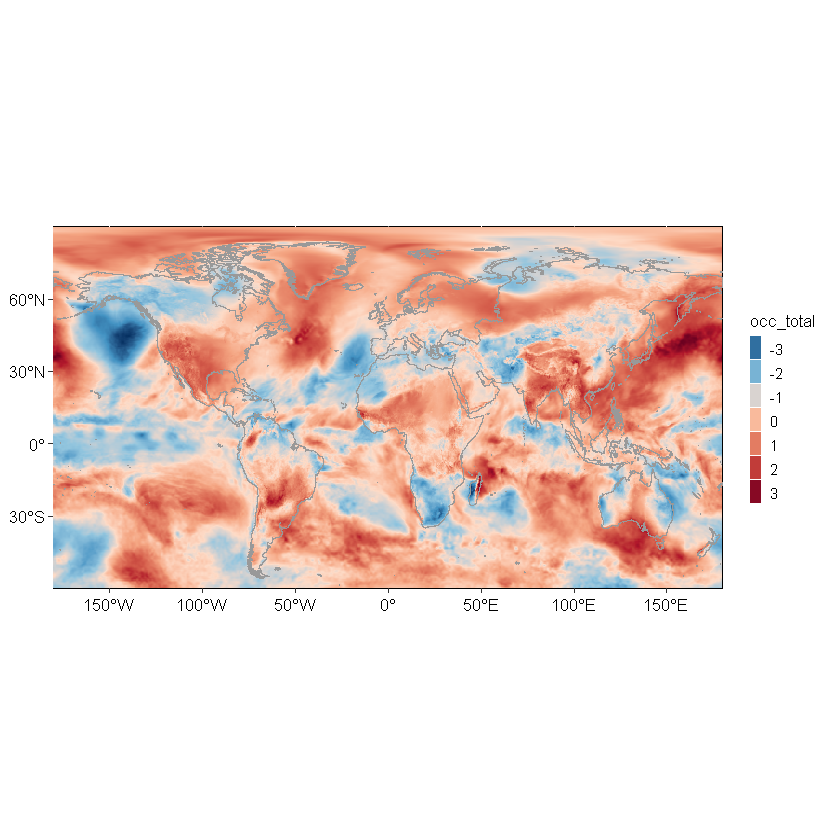

In [1]:
load("I:\\1.data_file\\10气象数据\\ERA5\\recal\\t2.RData")
dat = data.frame(x=data$lon, y=data$lat, z= data$vardata1)#[(720*5*18+1):(720*5*19)]
names(dat)=c("lon","lat","occ_total")

library(raster)
library(rgdal)
library(ggplot2)
library(ggthemes)
library(rcartocolor)
library(viridis)
continent<-rgdal::readOGR('H:\\NO.1 flash drought\\02 地图文件\\continent shapefile\\continent.shp')
fontsize=10
colour <- c("#67001f","#b2182b","#d6604d","#f4a582","#fddbc7","#92c5de","#4393c3","#053061")
p=ggplot()+
  geom_hline(aes(yintercept = 60),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = 30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = -30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = -100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = 100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_tile(data = dat,aes(x=lon,y=lat,fill=occ_total))+
  geom_polygon(data = fortify(continent),aes(x = long, y = lat, group = group), colour ="grey60" ,fill = NA,size=0.1) + #
  theme(panel.background = element_rect(fill = 'transparent',color = 'black'),
        panel.grid.minor = element_blank(),
        axis.text = element_text(colour='black',size=fontsize,hjust=.5),
        #axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5),
        axis.title=element_blank(),
        legend.position=c('right'),
        legend.direction = c('vertical'),
        legend.key = element_rect(fill = 'transparent'),
        legend.title = element_text(size = fontsize)
        #legend.spacing.x = unit(0, 'cm'),
        )+#legend.title = element_blank()
  #scale_fill_viridis(option="H",discrete=F)+
  #legend.key.size = unit(0.7, "cm"))+
  #scale_fill_manual(values = colour)+
  #scale_fill_brewer(palette ="YlOrRd")+
  #scale_fill_distiller(palette = "YlOrBr")+
  scale_fill_gradientn(colours=rev(colour),breaks=c(-5,-4,-3,-2,-1,0,1,2,3,4,5))+#scale_fill_gradientn(colours =rev(colorspacH::diverge_hcl(7)),breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
  #scale_fill_gradientn(colours =rev(colorspacH::diverge_hcl(7)),breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
  # scico::scale_fill_scico(palette = "lajolla",breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
  #labs(fill="% of Years with a Flash drought")+   #设置图片标题
  coord_fixed(1.3)+
  scale_y_continuous(breaks=c(-30,0,30,60),labels=c("30°S","0°","30°N","60°N"),limits =c(-60,90),expand = c(0,0))+
  scale_x_continuous(breaks=c(-150,-100,-50,0,50,100,150),labels=c("150°W","100°W","50°W","0°","50°E","100°E","150°E"),expand = c(0,0))+
  #ylim(-60,90)+
  guides(fill=guide_legend(ncol=1,label.position = "right",keyheight =1,keywidth = 0.5)) #图例分为几行或者几列展示
  p
 #}


In [ ]:
#感觉有些问题,但是不知道原因

In [273]:
 #校对pentad.data
 load(paste0("I:\\1.data_file\\10气象数据\\ERA5\\T3\\pentad.data.z_1_",1,".RData"))
 vardata1 = pentad.data[,100]
length(vardata1)
for(i_batch in 2:36){
  load(paste0("I:\\1.data_file\\10气象数据\\ERA5\\T3\\pentad.data.z_1_",i_batch,".RData"))
 vardata = pentad.data[,100]
vardata1=c(vardata1, vardata)
print(i_batch)
}
length(vardata1)
data=data.frame(grid2,vardata1)
head(data)
save(data,file=paste0("I:\\1.data_file\\10气象数据\\ERA5\\recal\\t3.RData"))

[1] 7200

[1] 2
[1] 3
[1] 4
[1] 5
[1] 6
[1] 7
[1] 8
[1] 9
[1] 10
[1] 11
[1] 12
[1] 13
[1] 14
[1] 15
[1] 16
[1] 17
[1] 18
[1] 19
[1] 20
[1] 21
[1] 22
[1] 23
[1] 24
[1] 25
[1] 26
[1] 27
[1] 28
[1] 29
[1] 30
[1] 31
[1] 32
[1] 33
[1] 34
[1] 35
[1] 36


[1] 259200

,lat,lon,vardata1
,<dbl>,<dbl>,<dbl>
1,90,-180.0,-7.260657
2,90,-179.5,-7.260200
3,90,-179.0,-7.259931
4,90,-178.5,-7.259274
5,90,-178.0,-7.257751
6,90,-177.5,-7.256000


OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Warning message:
"Removed 42480 rows containing missing values (geom_tile)."


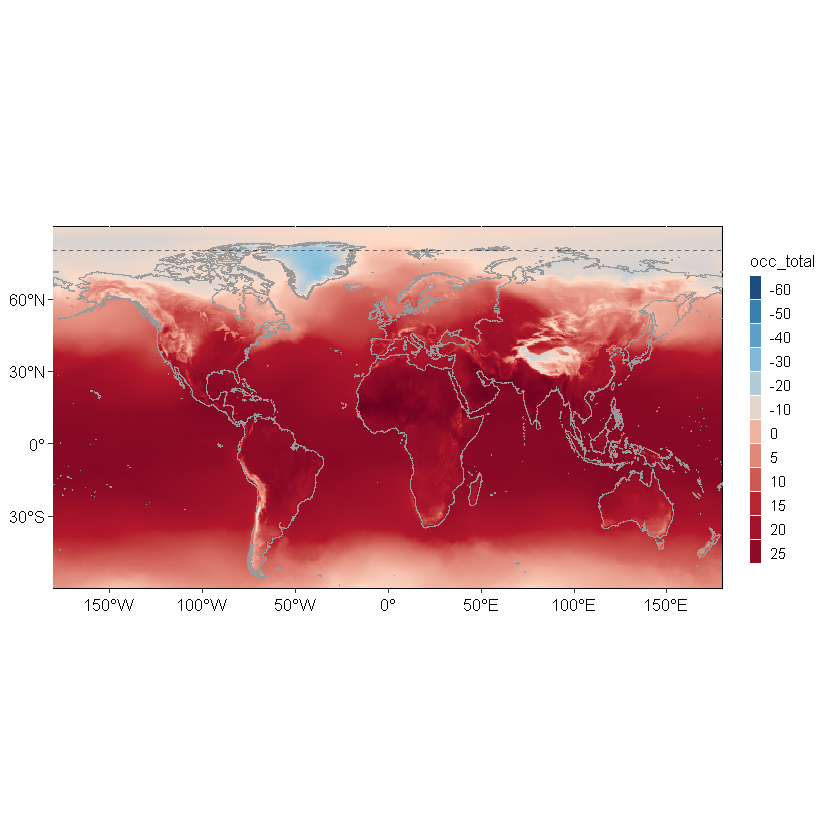

In [274]:
load("I:\\1.data_file\\10气象数据\\ERA5\\recal\\t3.RData")
dat = data.frame(x=data$lon, y=data$lat, z= data$vardata1)#[(720*5*18+1):(720*5*19)]
names(dat)=c("lon","lat","occ_total")

library(raster)
library(rgdal)
library(ggplot2)
library(ggthemes)
library(rcartocolor)
library(RColorBrewer)
library(viridis)
continent<-rgdal::readOGR('H:\\NO.1 flash drought\\02 地图文件\\continent shapefile\\continent.shp')
fontsize=10
colour <- c("#67001f","#b2182b","#fddbc7","#92c5de","#4393c3","#053061")#"#d6604d","#f4a582",
p=ggplot()+
  geom_hline(aes(yintercept = 60),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = 30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = -30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = -100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = 100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_tile(data = dat,aes(x=lon,y=lat,fill=occ_total))+
  geom_polygon(data = fortify(continent),aes(x = long, y = lat, group = group), colour ="grey60" ,fill = NA,size=0.1) + #
  theme(panel.background = element_rect(fill = 'transparent',color = 'black'),
        panel.grid.minor = element_blank(),
        axis.text = element_text(colour='black',size=fontsize,hjust=.5),
        #axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5),
        axis.title=element_blank(),
        legend.position=c('right'),
        legend.direction = c('vertical'),
        legend.key = element_rect(fill = 'transparent'),
        legend.title = element_text(size = fontsize)
        #legend.spacing.x = unit(0, 'cm'),
        )+#legend.title = element_blank()
  #scale_fill_viridis(option="H",discrete=F)+
  #legend.key.size = unit(0.7, "cm"))+
  #scale_fill_manual(values = colour)+
  #scale_fill_brewer(palette ="YlOrRd")+
  #scale_fill_distiller(palette = "YlOrBr")+rev(colour)
  scale_fill_gradientn(colours=rev(colour),breaks=c(-60,-50,-40,-30,-20,-10,0,5,10,15,20,25))+#,30,35,40
  #scale_fill_gradient2(colours=c("red","yellow"), values=c(-1,0,1))+
  #scale_fill_gradientn(colours =rev(colorspacH::diverge_hcl(7)),breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
  # scico::scale_fill_scico(palette = "lajolla",breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
  #labs(fill="% of Years with a Flash drought")+   #设置图片标题
  coord_fixed(1.3)+
  #geom_hline(aes(yintercept = 65),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = 80),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  scale_y_continuous(breaks=c(-30,0,30,60),labels=c("30°S","0°","30°N","60°N"),limits =c(-60,90),expand = c(0,0))+
  scale_x_continuous(breaks=c(-150,-100,-50,0,50,100,150),labels=c("150°W","100°W","50°W","0°","50°E","100°E","150°E"),expand = c(0,0))+
  #ylim(-60,90)+
  guides(fill=guide_legend(ncol=1,label.position = "right",keyheight =1,keywidth = 0.5)) #图例分为几行或者几列展示
  p
 #}


In [ ]:
#结果没问题

(4)数据合并(合并原始数据)

In [3]:
var=c("sm","et","pet","t2m","p")  #g
data_name=c("ERA5LAND","ERA5","GLEAM") #i
varible <- c("SM","ET","PET","T","P")

In [5]:
fun_combine=function(g,i,filename){
  load(filename)
  data_fd_total$start_pentad <- (data_fd_total$occ_year-1981)*73+data_fd_total$occ_start                        #计算骤旱发生的开始时间
  data_fd_total$end_pentad <- (data_fd_total$occ_year-1981)*73+data_fd_total$occ_start+data_fd_total$fd_length  #计算骤旱发生的结束时间
  fd_order <- unique(data_fd_total$number)  #发生骤旱的点
  #var=sm
  #var_file=sm2
  #fun_combine=function(var,var_file){
  data_var_fd=NULL
  for(i_batch in 1:36){
    #var_file="sm2"
    #需修改
    load(paste0("I:\\1.data_file\\10气象数据\\ERA5\\T3\\pentad.data.z_1_",i_batch,".RData"))
    #load(paste0("H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\",var_file,"\\pentad.data.z_1_",i_batch,".RData"))
    data=pentad.data
    number <- c((i_batch-1)*7200+1):(i_batch*7200)
    data_var <- data.frame(number,data)
    #dim(pentad.data.z)
    data_var_fd1 <- data_var[which(data_var$number%in%fd_order),]  #发生骤旱点的土壤湿度数据
    data_var_fd <- rbind(data_var_fd,data_var_fd1)
    print(i_batch)
  }
  save(data_var_fd,file=paste0("H:\\NO.1 flash drought\\03data\\meteorological\\data_",
                               var[g],"_fd_2_",data_name[i],".RData") )#所有发生骤旱点的土壤湿度数据
}


In [ ]:
filename1="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\data_fd_total.RData"
fun_combine(4,1,filename1)(未运行)


In [6]:

filename2="H:\\NO.1 flash drought\\03data\\ERA5\\2.fd_result\\data_fd_total.RData"
fun_combine(4,2,filename2)


[1] 1
[1] 2
[1] 3
[1] 4
[1] 5
[1] 6
[1] 7
[1] 8
[1] 9
[1] 10
[1] 11
[1] 12
[1] 13
[1] 14
[1] 15
[1] 16
[1] 17
[1] 18
[1] 19
[1] 20
[1] 21
[1] 22
[1] 23
[1] 24
[1] 25
[1] 26
[1] 27
[1] 28
[1] 29
[1] 30
[1] 31
[1] 32
[1] 33
[1] 34
[1] 35
[1] 36


In [ ]:

filename3="H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\data_fd_total.RData"
fun_combine(4,3,filename3)（未运行）

（4）骤旱前后

In [ ]:
fun <- function(data){   #提取骤旱的发生时变量值
  cc=NULL
  for(i in 1:dim(data)[1]){
    c1 <- (c(data[i,7]:data[i,8]))
    cc <- c(cc,c1)
  }
  return(cc)
}


In [11]:
fun <- function(data){   #提取骤旱的发生时中间变量值
  cc=NULL
  for(i in 1:dim(data)[1]){
    c1 <- ((data[i,7]+data[i,8])%/%2)
    cc <- c(cc,c1)
  }
  return(cc)
 }

var=c("sm","et","pet","t2m","p")  #g
data_name=c("ERA5LAND","ERA5","GLEAM") #i
varible <- c("SM","ET","PET","T","P")
 fun_lag=function(g,i,file_name){  #提取骤旱的发生前后变量发生的情况
  load(file_name)
  data_fd_total$start_pentad <- (data_fd_total$occ_year-1981)*73+data_fd_total$occ_start                        #计算骤旱发生的开始时间
  data_fd_total$end_pentad <- (data_fd_total$occ_year-1981)*73+data_fd_total$occ_start+data_fd_total$fd_length  #计算骤旱发生的结束时间
  fd_order <- unique(data_fd_total$number)  #发生骤旱的点
  load(paste0("H:\\NO.1 flash drought\\03data\\data_recal\\a2_arid_number_",data_name[i],".RData"))
  data_fd_total <-data_fd_total[-which(data_fd_total$number%in%arid_number),]
  fd_order <- unique(data_fd_total$number)  #发生骤旱的点

  load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\data_",
               var[g],"_fd_1_",data_name[i],".RData"))#导入发生骤旱的变量        
  data_var_fd=data_var_fd[,-1]  #把序号去掉
  

#data=filter(data_fd_total,number==fd_order[k])

  library(dplyr)
  fd_var=NULL
  fd_var_lag_1=NULL
  fd_var_lag_2=NULL
  fd_var_lag_3=NULL
  fd_var_lag_4=NULL
  data1=NULL
  for(k in 1:length(fd_order)){
    data=filter(data_fd_total,number==fd_order[k])

    data <- data[which(data$end_pentad<2919&data$start_pentad>2),]

    if(dim(data)[1]!=0){
       data1=rbind(data1,data)

    pentad_var <- fun(data)
    fd_var1=data_var_fd[k,pentad_var]   #发生骤旱时的土壤湿度
    fd_var <- c(fd_var,fd_var1)

    pentad_var <- data$start_pentad-1
    fd_var_lag1 <- data_var_fd[k,pentad_var] 
    fd_var_lag_1 <- c(fd_var_lag_1,fd_var_lag1)
    
    pentad_var <- data$start_pentad-2       #
    fd_var_lag1 <- data_var_fd[k,pentad_var]   #发生骤旱时的土壤湿度
    fd_var_lag_2 <- c(fd_var_lag_2,fd_var_lag1)
    
    pentad_var <- data$end_pentad+1
    fd_var_lag1 <- data_var_fd[k,pentad_var]   #发生骤旱时的土壤湿度
    fd_var_lag_3 <- c(fd_var_lag_3,fd_var_lag1)
    
    pentad_var <- data$end_pentad+2
    fd_var_lag1 <- data_var_fd[k,pentad_var]   #发生骤旱时的土壤湿度
    fd_var_lag_4 <- c(fd_var_lag_4,fd_var_lag1)
    }
    n=k/length(fd_order)
    print(n)
  }
    # var_data <- c(unlist(fd_var),unlist(fd_var_lag_1),unlist(fd_var_lag_2),unlist(fd_var_lag_3),unlist(fd_var_lag_4))
    # var_name <- c(rep("Onset",length(fd_var)),rep("Lag+1",length(fd_var_lag_1)),rep("Lag+2",length(fd_var_lag_2)),
    #               rep("Lag-1",length(fd_var_lag_3)),rep("Lag-2",length(fd_var_lag_4)))
    # var_data_1 <- data.frame(var_name,var_data)
    var_data=data.frame(data1,Lag_2=unlist(fd_var_lag_2),Lag_1=unlist(fd_var_lag_1),Onset=unlist(fd_var),
    Lag_3=unlist(fd_var_lag_3),Lag_4=unlist(fd_var_lag_4))
    save(var_data,file=paste0("H:\\NO.1 flash drought\\03data\\meteorological\\",
    var[g],"\\lag_",data_name[i],".RData"))
   return(var_data)
  }

In [354]:
#计算lag
file_name="H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\data_fd_total.RData"
aa=fun_lag(4,3,file_name)

file_name="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\data_fd_total.RData"
bb=fun_lag(4,1,file_name)

filename="H:\\NO.1 flash drought\\03data\\ERA5\\2.fd_result\\data_fd_total.RData"
cc=fun_lag(4,2,filename)

[1] 4.412478e-05
[1] 8.824957e-05
[1] 0.0001323744
[1] 0.0001764991
[1] 0.0002206239
[1] 0.0002647487
[1] 0.0003088735
[1] 0.0003529983
[1] 0.0003971231
[1] 0.0004412478
[1] 0.0004853726
[1] 0.0005294974
[1] 0.0005736222
[1] 0.000617747
[1] 0.0006618718
[1] 0.0007059966
[1] 0.0007501213
[1] 0.0007942461
[1] 0.0008383709
[1] 0.0008824957
[1] 0.0009266205
[1] 0.0009707453
[1] 0.00101487
[1] 0.001058995
[1] 0.00110312
[1] 0.001147244
[1] 0.001191369
[1] 0.001235494
[1] 0.001279619
[1] 0.001323744
[1] 0.001367868
[1] 0.001411993
[1] 0.001456118
[1] 0.001500243
[1] 0.001544367
[1] 0.001588492
[1] 0.001632617
[1] 0.001676742
[1] 0.001720867
[1] 0.001764991
[1] 0.001809116
[1] 0.001853241
[1] 0.001897366
[1] 0.001941491
[1] 0.001985615
[1] 0.00202974
[1] 0.002073865
[1] 0.00211799
[1] 0.002162114
[1] 0.002206239
[1] 0.002250364
[1] 0.002294489
[1] 0.002338614
[1] 0.002382738
[1] 0.002426863
[1] 0.002470988
[1] 0.002515113
[1] 0.002559238
[1] 0.002603362
[1] 0.002647487
[1] 0.002691612
[1] 0.0

,number,occ_year,occ_start,fd_length,fd_intensity,fd_mean_sesr_change,start_pentad,end_pentad,Lag_2,Lag_1,Onset,Lag_3,Lag_4
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,8920,1999,12,6,2,-0.14240502,1326,1332,-32.104897,-26.4711739,-25.858854,-21.1329277,-23.1765114
2,8920,2000,11,6,2,-0.14059396,1398,1404,-30.599025,-26.8473675,-30.914730,-25.4658333,-24.1206535
3,8921,1988,37,9,2,-0.06281983,548,557,0.927392,0.5418293,1.644240,0.6746967,-1.8521208
4,8921,1991,27,6,1,-0.14105036,757,763,-12.764223,-9.6589025,-3.121703,1.7250882,0.8952224
5,8921,2006,15,6,1,-0.09959241,1840,1846,-23.159941,-29.1226933,-20.026263,-17.5946585,-10.5324420
6,8921,2014,39,8,1,-0.04907727,2448,2456,1.407937,1.6865365,1.179767,-2.3546457,-1.6809709


No id variables; using all as measure variables



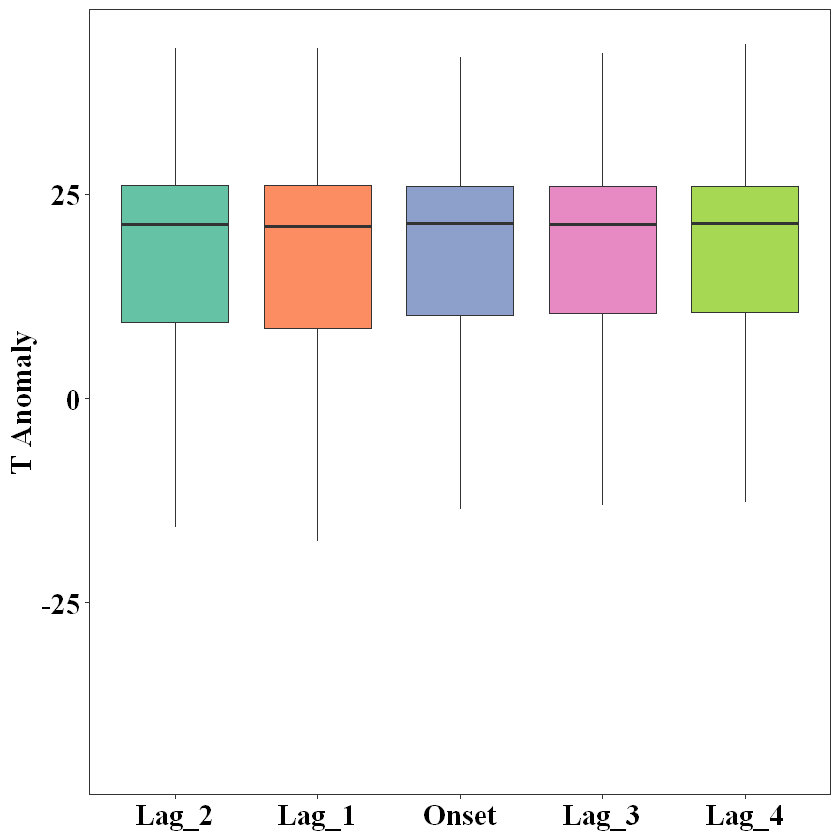

In [56]:
#查看原始数据
var=c("sm","et","pet","t2m","p")  #g
data_name=c("ERA5LAND","ERA5","GLEAM") #i
varible <- c("SM","ET","PET","T","P")
#draw_fun <- function(var,var_name,data_name){
    #load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\",var,"_data_1.RData"))
    #load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\",var,"_data_1_",data_name,".RData"))
   load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\",
    var[4],"\\lag_1_",data_name[2],".RData"))
   head(var_data)
   aa=reshape2::melt(var_data[,9:13],variable.name="lag")
   #aa

   #order_pet <- with(var_data,reorder(var_name,var_data,median))
   #order_pet <- factor(order_pet,levels = c("Lag-2","Lag-1","Onset","Lag+1","Lag+2"))
   # out <- boxplot.stats(data$PET)$out
   # out_ind <- which(data$PET %in% c(out))
   # XX <- data[-out_ind,]  
   fontsize = 18
   library(ggplot2)
   library(RColorBrewer)
   ggplot(aa)+
     geom_boxplot(aes(x=lag,y=value,fill=lag),varwidth = F,outlier.shape = NA)+
     #geom_boxplot(aes(fill=var),notch = T,varwidth = F,outlier.shape = NA)+notch = T,
     scale_fill_manual(values = c(brewer.pal(7,"Set2")[c(1,2,3,4,5)]))+
     labs(y=paste0(varible[g]," Anomaly"),family="serif")+#x="Time",
     #coord_cartesian(ylim=c(-2, 2))+
     theme_bw()+ 
     #ggtitle(data_name[i])+
     theme(legend.position = "none",
           plot.title=element_text(hjust=0.5,size=fontsize),
           axis.text = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
           axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
           axis.title.x = element_blank(),
           panel.grid.major=element_blank(),
           panel.grid.minor=element_blank())
   #theme_light()
   # ggsave(paste0("J:\\1.data_file\\09 GLEAM\\7draw\\分区\\PET\\",data_name[i],"_PET.png"),
   #        width = 14,height =12,units = "cm")
   #print(i)
#    return(p)
#  }


In [ ]:
#用原始数据画出来的变化还是很不明显

17.处理PET=====================================

（1）检查合成标准化后的数据

In [21]:
#校对pentad.data
i_batch=1
load(paste0("H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\pet2\\pentad.data.z_1_",i_batch,".RData"))
vardata1 = pentad.data[,1]
 dim(pentad.data)
length(vardata)


[1] 7200 2920

[1] 7200

In [18]:

for(i_batch in 2:36){
 load(paste0("H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\pet2\\pentad.data.z_1_",i_batch,".RData"))
 vardata = pentad.data[,1]
vardata1=c(vardata1, vardata)
print(i_batch)
}
length(vardata1)

[1] 2
[1] 3
[1] 4
[1] 5
[1] 6
[1] 7
[1] 8
[1] 9
[1] 10
[1] 11
[1] 12
[1] 13
[1] 14
[1] 15
[1] 16
[1] 17
[1] 18
[1] 19
[1] 20
[1] 21
[1] 22
[1] 23
[1] 24
[1] 25
[1] 26
[1] 27
[1] 28
[1] 29
[1] 30
[1] 31
[1] 32
[1] 33
[1] 34
[1] 35
[1] 36


[1] 259200

In [247]:
data=data.frame(grid2,vardata1)
head(data)
save(data,file=paste0("I:\\1.data_file\\10气象数据\\ERA5\\recal\\pet3.RData"))

,lat,lon,vardata1
,<dbl>,<dbl>,<dbl>
1,90,-180.0,NA
2,90,-179.5,NA
3,90,-179.0,NA
4,90,-178.5,NA
5,90,-178.0,NA
6,90,-177.5,NA


载入需要的程辑包：sp

Please note that rgdal will be retired by the end of 2023,
plan transition to sf/stars/terra functions using GDAL and PROJ
at your earliest convenience.

rgdal: version: 1.5-28, (SVN revision 1158)
Geospatial Data Abstraction Library extensions to R successfully loaded
Loaded GDAL runtime: GDAL 3.2.1, released 2020/12/29
Path to GDAL shared files: E:/R/R-4.1.2/library/rgdal/gdal
GDAL binary built with GEOS: TRUE 
Loaded PROJ runtime: Rel. 7.2.1, January 1st, 2021, [PJ_VERSION: 721]
Path to PROJ shared files: E:/R/R-4.1.2/library/rgdal/proj
PROJ CDN enabled: FALSE
Linking to sp version:1.4-6
To mute warnings of possible GDAL/OSR exportToProj4() degradation,
use options("rgdal_show_exportToProj4_warnings"="none") before loading sp or rgdal.
Overwritten PROJ_LIB was E:/R/R-4.1.2/library/rgdal/proj

载入需要的程辑包：viridisLite



OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Warning message:
"Removed 42480 rows containing missing values (geom_tile)."


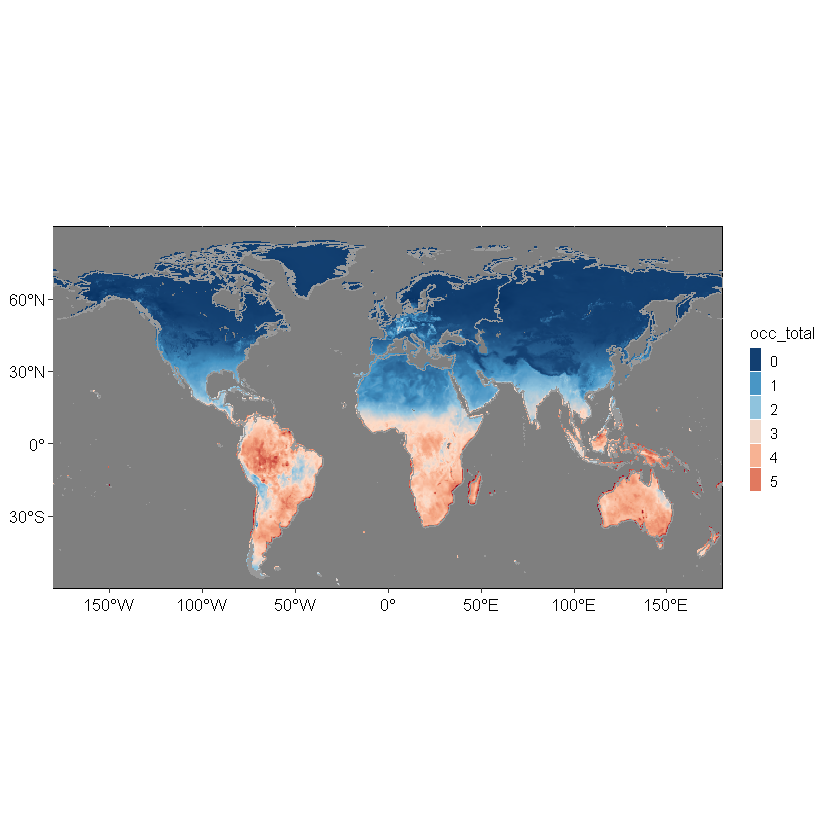

In [1]:
load("I:\\1.data_file\\10气象数据\\ERA5\\recal\\pet3.RData")
dat = data.frame(x=data$lon, y=data$lat, z= data$vardata1)#[(720*5*18+1):(720*5*19)]
names(dat)=c("lon","lat","occ_total")

library(raster)
library(rgdal)
library(ggplot2)
library(ggthemes)
library(rcartocolor)
library(viridis)
continent<-rgdal::readOGR('H:\\NO.1 flash drought\\02 地图文件\\continent shapefile\\continent.shp')
fontsize=10
colour <- c("#67001f","#b2182b","#d6604d","#f4a582","#fddbc7","#92c5de","#4393c3","#053061")
p=ggplot()+
  geom_hline(aes(yintercept = 60),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = 30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = -30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = -100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = 100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_tile(data = dat,aes(x=lon,y=lat,fill=occ_total))+
  geom_polygon(data = fortify(continent),aes(x = long, y = lat, group = group), colour ="grey60" ,fill = NA,size=0.1) + #
  theme(panel.background = element_rect(fill = 'transparent',color = 'black'),
        panel.grid.minor = element_blank(),
        axis.text = element_text(colour='black',size=fontsize,hjust=.5),
        #axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5),
        axis.title=element_blank(),
        legend.position=c('right'),
        legend.direction = c('vertical'),
        legend.key = element_rect(fill = 'transparent'),
        legend.title = element_text(size = fontsize)
        #legend.spacing.x = unit(0, 'cm'),
        )+#legend.title = element_blank()
  #scale_fill_viridis(option="H",discrete=F)+
  #legend.key.size = unit(0.7, "cm"))+
  #scale_fill_manual(values = colour)+
  #scale_fill_brewer(palette ="YlOrRd")+
  #scale_fill_distiller(palette = "YlOrBr")+
  scale_fill_gradientn(colours=rev(colour),breaks=c(-5,-4,-3,-2,-1,0,1,2,3,4,5))+
  #scale_fill_gradientn(colours =rev(colorspacH::diverge_hcl(7)),breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
  # scico::scale_fill_scico(palette = "lajolla",breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
  #labs(fill="% of Years with a Flash drought")+   #设置图片标题
  coord_fixed(1.3)+
  scale_y_continuous(breaks=c(-30,0,30,60),labels=c("30°S","0°","30°N","60°N"),limits =c(-60,90),expand = c(0,0))+
  scale_x_continuous(breaks=c(-150,-100,-50,0,50,100,150),labels=c("150°W","100°W","50°W","0°","50°E","100°E","150°E"),expand = c(0,0))+
  #ylim(-60,90)+
  guides(fill=guide_legend(ncol=1,label.position = "right",keyheight =1,keywidth = 0.5)) #图例分为几行或者几列展示
  p
 #}


In [4]:
#校对pentad.data.z
i_batch=1
 load(paste0("H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\pet2\\pentad.data.z_1_",i_batch,".RData"))
 dim(pentad.data.z)
 vardata1 = pentad.data.z[,1]
#length(vardata)


[1] 7200 2920

In [ ]:
for(i_batch in 2:36){
load(paste0("H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\pet2\\pentad.data.z_1_",i_batch,".RData"))
 vardata = pentad.data.z[,1]
vardata1=c(vardata1, vardata)
print(i_batch)
}
length(vardata1)
data=data.frame(grid2,vardata1)
head(data)
save(data,file=paste0("I:\\1.data_file\\10气象数据\\ERA5\\recal\\pet2.RData"))

OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Warning message:
"Removed 42480 rows containing missing values (geom_tile)."


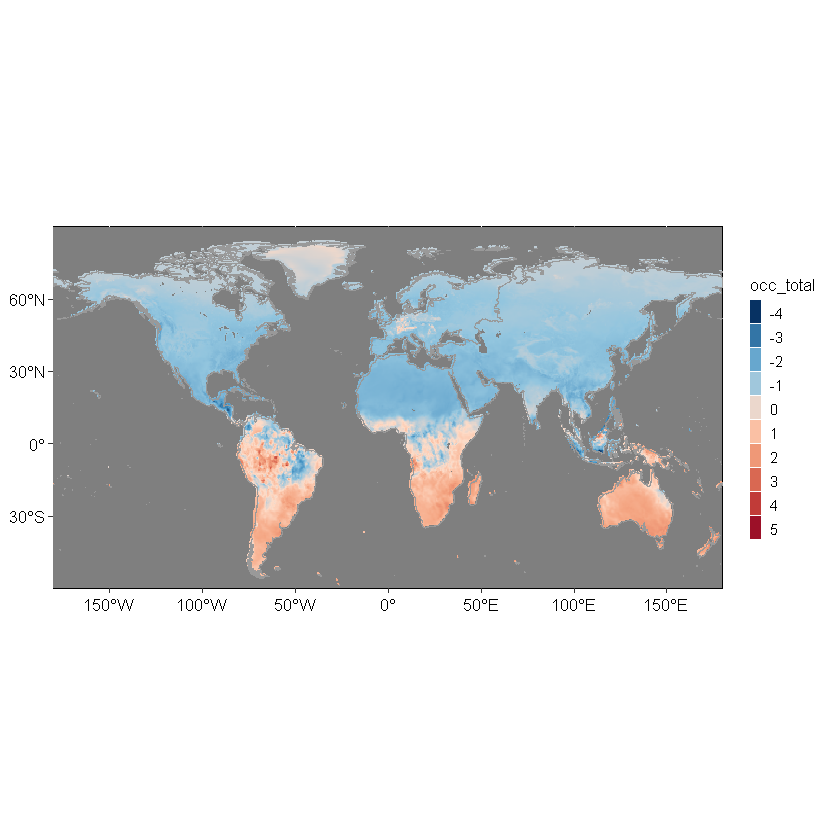

In [2]:
load(paste0("I:\\1.data_file\\10气象数据\\ERA5\\recal\\pet2.RData"))
dat = data.frame(x=data$lon, y=data$lat, z= data$vardata1)#[(720*5*18+1):(720*5*19)]
names(dat)=c("lon","lat","occ_total")

library(raster)
library(rgdal)
library(ggplot2)
library(ggthemes)
library(rcartocolor)
library(viridis)
continent<-rgdal::readOGR('H:\\NO.1 flash drought\\02 地图文件\\continent shapefile\\continent.shp')
fontsize=10
colour <- c("#67001f","#b2182b","#d6604d","#f4a582","#fddbc7","#92c5de","#4393c3","#053061")
p=ggplot()+
  geom_hline(aes(yintercept = 60),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = 30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = -30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = -100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = 100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_tile(data = dat,aes(x=lon,y=lat,fill=occ_total))+
  geom_polygon(data = fortify(continent),aes(x = long, y = lat, group = group), colour ="grey60" ,fill = NA,size=0.1) + #
  theme(panel.background = element_rect(fill = 'transparent',color = 'black'),
        panel.grid.minor = element_blank(),
        axis.text = element_text(colour='black',size=fontsize,hjust=.5),
        #axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5),
        axis.title=element_blank(),
        legend.position=c('right'),
        legend.direction = c('vertical'),
        legend.key = element_rect(fill = 'transparent'),
        legend.title = element_text(size = fontsize)
        #legend.spacing.x = unit(0, 'cm'),
        )+#legend.title = element_blank()
  #scale_fill_viridis(option="H",discrete=F)+
  #legend.key.size = unit(0.7, "cm"))+
  #scale_fill_manual(values = colour)+
  #scale_fill_brewer(palette ="YlOrRd")+
  #scale_fill_distiller(palette = "YlOrBr")+
  scale_fill_gradientn(colours=rev(colour),breaks=c(-5,-4,-3,-2,-1,0,1,2,3,4,5))+#scale_fill_gradientn(colours =rev(colorspacH::diverge_hcl(7)),breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
  # scico::scale_fill_scico(palette = "lajolla",breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
  #labs(fill="% of Years with a Flash drought")+   #设置图片标题
  coord_fixed(1.3)+
  scale_y_continuous(breaks=c(-30,0,30,60),labels=c("30°S","0°","30°N","60°N"),limits =c(-60,90),expand = c(0,0))+
  scale_x_continuous(breaks=c(-150,-100,-50,0,50,100,150),labels=c("150°W","100°W","50°W","0°","50°E","100°E","150°E"),expand = c(0,0))+
  #ylim(-60,90)+
  guides(fill=guide_legend(ncol=1,label.position = "right",keyheight =1,keywidth = 0.5)) #图例分为几行或者几列展示
  p
 #}


（2）骤旱前后

In [16]:
#计算lag（和温度一样）
file_name="H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\data_fd_total.RData"
aa=fun_lag(3,3,file_name)
file_name="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\data_fd_total.RData"
bb=fun_lag(3,1,file_name)
filename="H:\\NO.1 flash drought\\03data\\ERA5\\2.fd_result\\data_fd_total.RData"
cc=fun_lag(3,2,filename)

[1] 4.412478e-05
[1] 8.824957e-05
[1] 0.0001323744
[1] 0.0001764991
[1] 0.0002206239
[1] 0.0002647487
[1] 0.0003088735
[1] 0.0003529983
[1] 0.0003971231
[1] 0.0004412478
[1] 0.0004853726
[1] 0.0005294974
[1] 0.0005736222
[1] 0.000617747
[1] 0.0006618718
[1] 0.0007059966
[1] 0.0007501213
[1] 0.0007942461
[1] 0.0008383709
[1] 0.0008824957
[1] 0.0009266205
[1] 0.0009707453
[1] 0.00101487
[1] 0.001058995
[1] 0.00110312
[1] 0.001147244
[1] 0.001191369
[1] 0.001235494
[1] 0.001279619
[1] 0.001323744
[1] 0.001367868
[1] 0.001411993
[1] 0.001456118
[1] 0.001500243
[1] 0.001544367
[1] 0.001588492
[1] 0.001632617
[1] 0.001676742
[1] 0.001720867
[1] 0.001764991
[1] 0.001809116
[1] 0.001853241
[1] 0.001897366
[1] 0.001941491
[1] 0.001985615
[1] 0.00202974
[1] 0.002073865
[1] 0.00211799
[1] 0.002162114
[1] 0.002206239
[1] 0.002250364
[1] 0.002294489
[1] 0.002338614
[1] 0.002382738
[1] 0.002426863
[1] 0.002470988
[1] 0.002515113
[1] 0.002559238
[1] 0.002603362
[1] 0.002647487
[1] 0.002691612
[1] 0.0

In [262]:
#案例
aa=c(1:10,33,55,10,20,1:100,2,3:50)
bb=NULL
ee=NULL
for(i in 1:40){
cc=aa[((i-1)*3+1):(3*i)]
bb[i]=mean(cc)
ee[i]=sum(cc)
}
(bb-mean(bb))/sd(bb)
(ee-mean(ee))/sd(ee) #求和或是平均不会影响标准化的结果

[1] -1.34621058 -1.24947689 -1.15274319 -0.35737726 -1.07750587 -1.31396602
 [7] -1.21723232 -1.12049863 -1.02376493 -0.92703124 -0.83029754 -0.73356385
[13] -0.63683016 -0.54009646 -0.44336277 -0.34662907 -0.24989538 -0.15316168
[19] -0.05642799  0.04030571  0.13703940  0.23377310  0.33050679  0.42724048
[25]  0.52397418  0.62070787  0.71744157  0.81417526  0.91090896  1.00764265
[31]  1.10437635  1.20111004  1.29784373  1.39457743  1.49131112  1.58804482
[37]  1.68477851  1.78151221 -1.31396602 -1.21723232

[1] -1.34621058 -1.24947689 -1.15274319 -0.35737726 -1.07750587 -1.31396602
 [7] -1.21723232 -1.12049863 -1.02376493 -0.92703124 -0.83029754 -0.73356385
[13] -0.63683016 -0.54009646 -0.44336277 -0.34662907 -0.24989538 -0.15316168
[19] -0.05642799  0.04030571  0.13703940  0.23377310  0.33050679  0.42724048
[25]  0.52397418  0.62070787  0.71744157  0.81417526  0.91090896  1.00764265
[31]  1.10437635  1.20111004  1.29784373  1.39457743  1.49131112  1.58804482
[37]  1.68477851  1.78151221 -1.31396602 -1.21723232

18.检查SM数据=======================================

In [34]:
rm(list=ls())

(1)插值结果

In [123]:
load(paste0("H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\sm\\",
"sm_resample_gleam0.5_",1982,".RData"))
sm_resample
library(raster)
plot(sm_resample)#可能由于存储位置改变打不开了

class      : RasterBrick 
dimensions : 360, 720, 259200, 365  (nrow, ncol, ncell, nlayers)
resolution : 0.5, 0.5  (x, y)
extent     : -180, 180, -90, 90  (xmin, xmax, ymin, ymax)
crs        : +proj=longlat +datum=WGS84 
source     : r_tmp_2022-01-21_111635_3766_76221.grd 
names      :     layer.1,     layer.2,     layer.3,     layer.4,     layer.5,     layer.6,     layer.7,     layer.8,     layer.9,    layer.10,    layer.11,    layer.12,    layer.13,    layer.14,    layer.15, ... 
min values : 0.009136646, 0.009090991, 0.009046527, 0.009005896, 0.008969327, 0.008934901, 0.008903022, 0.008874292, 0.008847110, 0.008821717, 0.008796096, 0.008768044, 0.009610130, 0.010081152, 0.009957834, ... 
max values :   0.8241730,   0.8150927,   0.8336588,   0.8167233,   0.8148741,   0.8472280,   0.8328050,   0.8200204,   0.8146630,   0.8630700,   0.8158971,   0.8205403,   0.8485875,   0.8242031,   0.8339844, ... 


Warning message in file(fn, "rb"):
"无法打开文件'/tmp/RtmpV9jCcX/raster/r_tmp_2022-01-21_111635_3766_76221.gri': No such file or directory"


ERROR: Error in file(fn, "rb"): 无法打开链结


(2)检查合成数据

In [126]:
i_batch=1
load(paste0("H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\sm1\\sm_resample_",i_batch,".RData"))
dim(sm_resample_1)#720*10   1981-2020 daily data  #导入重采样数据
sm_resample_1

[1]  7200 14610

layer.1,layer.2,layer.3,layer.4,layer.5,layer.6,layer.7,layer.8,layer.9,layer.10,...,layer.357,layer.358,layer.359,layer.360,layer.361,layer.362,layer.363,layer.364,layer.365,layer.366
NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [135]:
load(paste0("H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\sm1\\sm_resample_",1,".RData"))
  vardata1 = sm_resample_1[,1]  #提取某一天进行检查
length(vardata1)
vardata1

for(i_batch in 2:36){
 load(paste0("H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\sm1\\sm_resample_",i_batch,".RData"))
  vardata = sm_resample_1[,1]
vardata1=c(vardata1, vardata)
print(i_batch)
}
length(vardata1)
data=data.frame(grid2,vardata1)
head(data)
save(data,file=paste0("I:\\1.data_file\\10气象数据\\ERA5\\recal\\sm1.RData"))

[1] 7200

[1] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [25] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [49] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [73] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [97] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [121] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [145] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [169] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [193] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [217] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [241] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [265] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [289] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [313] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [337] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [361] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [385] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [409] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [433] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [457] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [481] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [505] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [529] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [553] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [577] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [601] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [625] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [649] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [673] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [697] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [721] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [745] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [769] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [793] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [817] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [841] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [865] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [889] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [913] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [937] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [961] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [985] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
[1009] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
[1033] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
[1057] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
[1081] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
[1105] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
[1129] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
[1153] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
[1177] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
[1201] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA N

[1] 2
[1] 3
[1] 4
[1] 5
[1] 6
[1] 7
[1] 8
[1] 9
[1] 10
[1] 11
[1] 12
[1] 13
[1] 14
[1] 15
[1] 16
[1] 17
[1] 18
[1] 19
[1] 20
[1] 21
[1] 22
[1] 23
[1] 24
[1] 25
[1] 26
[1] 27
[1] 28
[1] 29
[1] 30
[1] 31
[1] 32
[1] 33
[1] 34
[1] 35
[1] 36


[1] 259200

,lat,lon,vardata1
,<dbl>,<dbl>,<dbl>
1,90,-180.0,NA
2,90,-179.5,NA
3,90,-179.0,NA
4,90,-178.5,NA
5,90,-178.0,NA
6,90,-177.5,NA


OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Warning message:
"Removed 42480 rows containing missing values (geom_tile)."


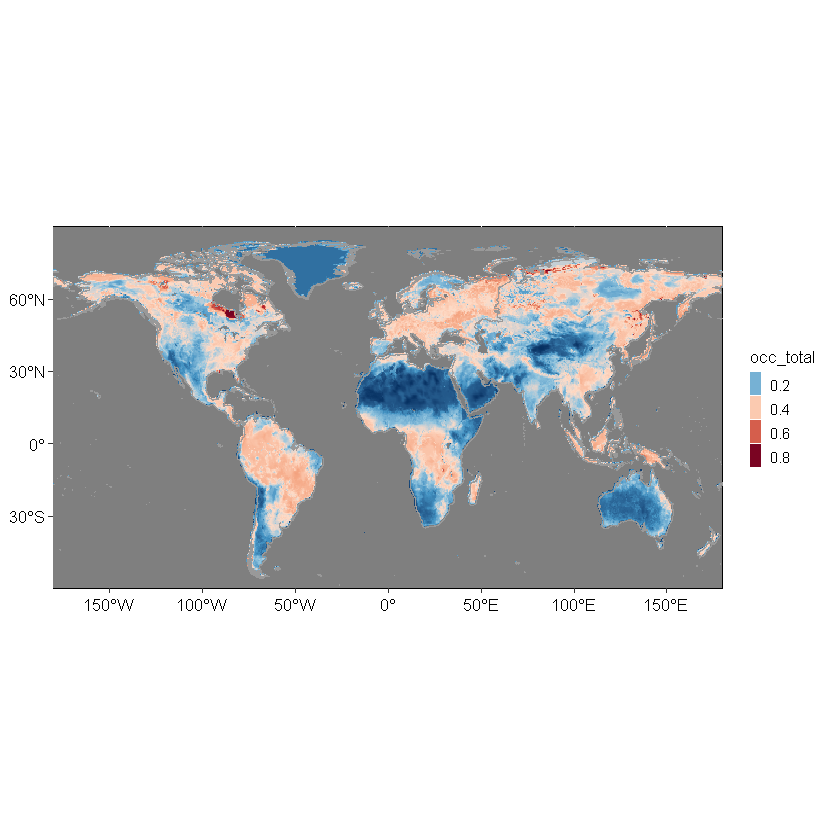

In [138]:
dat = data.frame(x=data$lon, y=data$lat, z= data$vardata1)#[(720*5*18+1):(720*5*19)]
names(dat)=c("lon","lat","occ_total")
#dat1=na.omit(data)

library(raster)
library(rgdal)
library(ggplot2)
library(ggthemes)
library(rcartocolor)
library(viridis)
continent<-rgdal::readOGR('H:\\NO.1 flash drought\\02 地图文件\\continent shapefile\\continent.shp')
fontsize=10
colour <- c("#67001f","#b2182b","#d6604d","#f4a582","#fddbc7","#92c5de","#4393c3","#053061")
p=ggplot()+
  geom_hline(aes(yintercept = 60),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = 30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = -30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = -100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = 100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_tile(data = dat,aes(x=lon,y=lat,fill=occ_total))+
  geom_polygon(data = fortify(continent),aes(x = long, y = lat, group = group), colour ="grey60" ,fill = NA,size=0.1) + #
  theme(panel.background = element_rect(fill = 'transparent',color = 'black'),
        panel.grid.minor = element_blank(),
        axis.text = element_text(colour='black',size=fontsize,hjust=.5),
        #axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5),
        axis.title=element_blank(),
        legend.position=c('right'),
        legend.direction = c('vertical'),
        legend.key = element_rect(fill = 'transparent'),
        legend.title = element_text(size = fontsize)
        #legend.spacing.x = unit(0, 'cm'),
        )+#legend.title = element_blank()
  #scale_fill_viridis(option="H",discrete=F)+
  #legend.key.size = unit(0.7, "cm"))+
  #scale_fill_manual(values = colour)+
  #scale_fill_brewer(palette ="YlOrRd")+
  #scale_fill_distiller(palette = "YlOrBr")+
  scale_fill_gradientn(colours=rev(colour),breaks=c(0.2,0.4,0.6,0.8,1))+
  #scale_fill_gradientn(colours =rev(colorspacH::diverge_hcl(7)),breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
  # scico::scale_fill_scico(palette = "lajolla",breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
  #labs(fill="% of Years with a Flash drought")+   #设置图片标题
  coord_fixed(1.3)+
  scale_y_continuous(breaks=c(-30,0,30,60),labels=c("30°S","0°","30°N","60°N"),limits =c(-60,90),expand = c(0,0))+
  scale_x_continuous(breaks=c(-150,-100,-50,0,50,100,150),labels=c("150°W","100°W","50°W","0°","50°E","100°E","150°E"),expand = c(0,0))+
  #ylim(-60,90)+
  guides(fill=guide_legend(ncol=1,label.position = "right",keyheight =1,keywidth = 0.5)) #图例分为几行或者几列展示
  p
 #}


In [ ]:
#数据合成没问题

（3）标准化数据

In [153]:
#校对pentad.data
i_batch=1
load(paste0("H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\sm2\\pentad.data.z_1_",i_batch,".RData"))
dim(pentad.data)
head(na.omit(pentad.data))
dim(pentad.data.z)
head(na.omit(pentad.data.z))

vardata1 = pentad.data[,100]#提取第100个pentad
length(vardata1)

for(i_batch in 2:36){
 load(paste0("H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\sm2\\pentad.data.z_1_",i_batch,".RData"))
 vardata = pentad.data[,100]
vardata1=c(vardata1, vardata)
print(i_batch)
}
length(vardata1)

[1] 7200 2920

Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
"number of rows of result is not a multiple of vector length (arg 2)"


[,1] [,2] [,3] [,4] [,5] [,6] [,7] [,8] [,9] [,10] [,11] [,12] [,13] [,14]
     [,15] [,16] [,17] [,18] [,19] [,20] [,21]

[1] 7200 2920

Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
"number of rows of result is not a multiple of vector length (arg 2)"


[,1] [,2] [,3] [,4] [,5] [,6] [,7] [,8] [,9] [,10] [,11] [,12] [,13] [,14]
     [,15] [,16] [,17] [,18] [,19] [,20] [,21]

[1] 7200

In [155]:
load(file="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData")
data=data.frame(grid2,vardata1)
head(data)
dim(data)
save(data,file=paste0("I:\\1.data_file\\10气象数据\\ERA5\\recal\\sm3.RData"))

,lat,lon,vardata1
,<dbl>,<dbl>,<dbl>
1,90,-180.0,NA
2,90,-179.5,NA
3,90,-179.0,NA
4,90,-178.5,NA
5,90,-178.0,NA
6,90,-177.5,NA


[1] 259200      3

In [159]:

#filename="I:\\1.data_file\\10气象数据\\ERA5\\recal\\sm3.RData"

draw_fun=function(filename){
load(filename)
dat = data.frame(x=data$lon, y=data$lat, z= data$vardata1)#[(720*5*18+1):(720*5*19)]
names(dat)=c("lon","lat","occ_total")

library(raster)
library(rgdal)
library(ggplot2)
library(ggthemes)
library(rcartocolor)
library(viridis)
continent<-rgdal::readOGR('H:\\NO.1 flash drought\\02 地图文件\\continent shapefile\\continent.shp')
fontsize=10
colour <- c("#67001f","#b2182b","#d6604d","#f4a582","#fddbc7","#92c5de","#4393c3","#053061")
p=ggplot()+
  geom_hline(aes(yintercept = 60),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = 30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = -30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = -100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = 100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_tile(data = dat,aes(x=lon,y=lat,fill=occ_total))+
  geom_polygon(data = fortify(continent),aes(x = long, y = lat, group = group), colour ="grey60" ,fill = NA,size=0.1) + #
  theme(panel.background = element_rect(fill = 'transparent',color = 'black'),
        panel.grid.minor = element_blank(),
        axis.text = element_text(colour='black',size=fontsize,hjust=.5),
        #axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5),
        axis.title=element_blank(),
        legend.position=c('right'),
        legend.direction = c('vertical'),
        legend.key = element_rect(fill = 'transparent'),
        legend.title = element_text(size = fontsize)
        #legend.spacing.x = unit(0, 'cm'),
        )+#legend.title = element_blank()
  #scale_fill_viridis(option="H",discrete=F)+
  #legend.key.size = unit(0.7, "cm"))+
  #scale_fill_manual(values = colour)+
  #scale_fill_brewer(palette ="YlOrRd")+
  #scale_fill_distiller(palette = "YlOrBr")+
  scale_fill_gradientn(colours=rev(colour),breaks=c(-5,-4,-3,-2,-1,0,1,2,3,4,5))+
  #scale_fill_gradientn(colours =rev(colorspacH::diverge_hcl(7)),breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
  # scico::scale_fill_scico(palette = "lajolla",breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
  #labs(fill="% of Years with a Flash drought")+   #设置图片标题
  coord_fixed(1.3)+
  scale_y_continuous(breaks=c(-30,0,30,60),labels=c("30°S","0°","30°N","60°N"),limits =c(-60,90),expand = c(0,0))+
  scale_x_continuous(breaks=c(-150,-100,-50,0,50,100,150),labels=c("150°W","100°W","50°W","0°","50°E","100°E","150°E"),expand = c(0,0))+
  #ylim(-60,90)+
  guides(fill=guide_legend(ncol=1,label.position = "right",keyheight =1,keywidth = 0.5)) #图例分为几行或者几列展示
  return(p)
 }


OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Warning message:
"Removed 42480 rows containing missing values (geom_tile)."


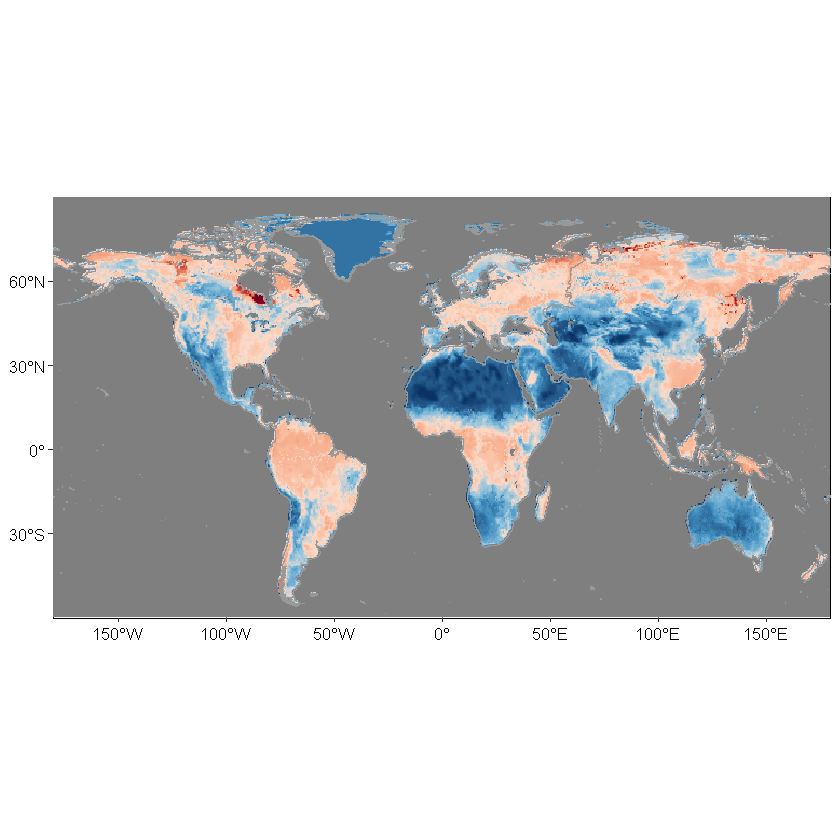

In [165]:
filename="I:\\1.data_file\\10气象数据\\ERA5\\recal\\sm3.RData"
p1=draw_fun(filename)
p1

In [ ]:
#没问题

In [157]:
#校对pentad.data.z
i_batch=1
load(paste0("H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\sm2\\pentad.data.z_1_",i_batch,".RData"))
dim(pentad.data)
head(na.omit(pentad.data))
dim(pentad.data.z)
head(na.omit(pentad.data.z))

vardata1 = pentad.data.z[,100]#提取第100个pentad
length(vardata1)

for(i_batch in 2:36){
 load(paste0("H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\sm2\\pentad.data.z_1_",i_batch,".RData"))
 vardata = pentad.data.z[,100]
vardata1=c(vardata1, vardata)
print(i_batch)
}
length(vardata1)

[1] 7200 2920

Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
"number of rows of result is not a multiple of vector length (arg 2)"


[,1] [,2] [,3] [,4] [,5] [,6] [,7] [,8] [,9] [,10] [,11] [,12] [,13] [,14]
     [,15] [,16] [,17] [,18] [,19] [,20] [,21]

[1] 7200 2920

Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
"number of rows of result is not a multiple of vector length (arg 2)"


[,1] [,2] [,3] [,4] [,5] [,6] [,7] [,8] [,9] [,10] [,11] [,12] [,13] [,14]
     [,15] [,16] [,17] [,18] [,19] [,20] [,21]

[1] 7200

[1] 2
[1] 3
[1] 4
[1] 5
[1] 6
[1] 7
[1] 8
[1] 9
[1] 10
[1] 11
[1] 12
[1] 13
[1] 14
[1] 15
[1] 16
[1] 17
[1] 18
[1] 19
[1] 20
[1] 21
[1] 22
[1] 23
[1] 24
[1] 25
[1] 26
[1] 27
[1] 28
[1] 29
[1] 30
[1] 31
[1] 32
[1] 33
[1] 34
[1] 35
[1] 36


[1] 259200

In [158]:
load(file="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\grid_lon_lat.RData")
data=data.frame(grid2,vardata1)
head(data)
dim(data)
save(data,file=paste0("I:\\1.data_file\\10气象数据\\ERA5\\recal\\sm2.RData"))

,lat,lon,vardata1
,<dbl>,<dbl>,<dbl>
1,90,-180.0,NA
2,90,-179.5,NA
3,90,-179.0,NA
4,90,-178.5,NA
5,90,-178.0,NA
6,90,-177.5,NA


[1] 259200      3

OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Warning message:
"Removed 42480 rows containing missing values (geom_tile)."


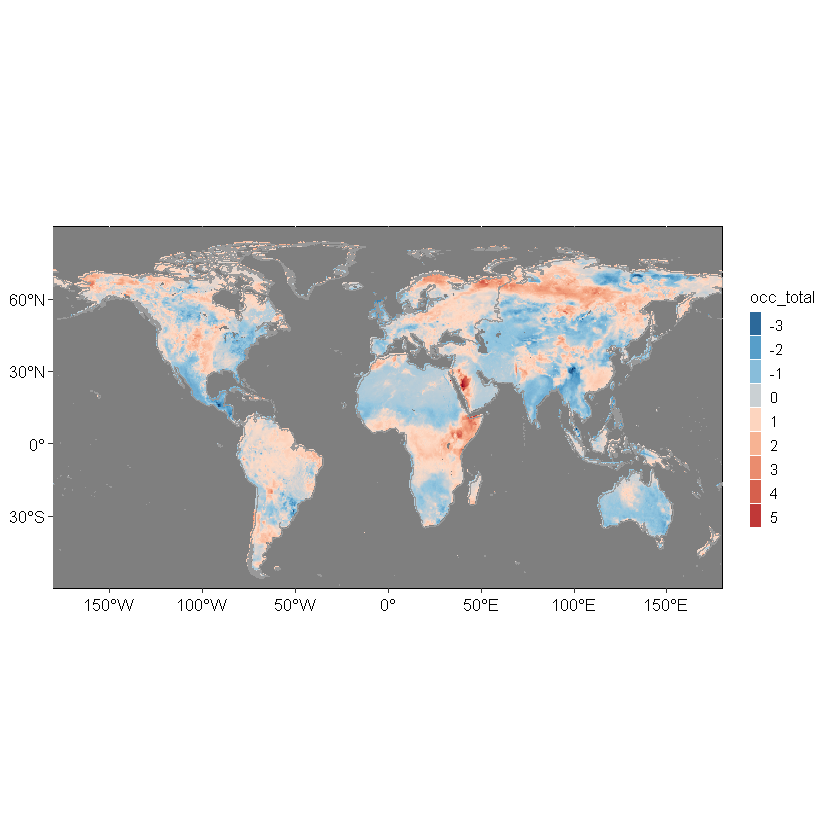

In [164]:
filename="I:\\1.data_file\\10气象数据\\ERA5\\recal\\sm2.RData"
p2=draw_fun(filename)
p2

Warning message:
"Removed 42480 rows containing missing values (geom_tile)."
Warning message:
"Removed 42480 rows containing missing values (geom_tile)."
Warning message:
"Removed 42480 rows containing missing values (geom_tile)."
Warning message:
"Removed 42480 rows containing missing values (geom_tile)."


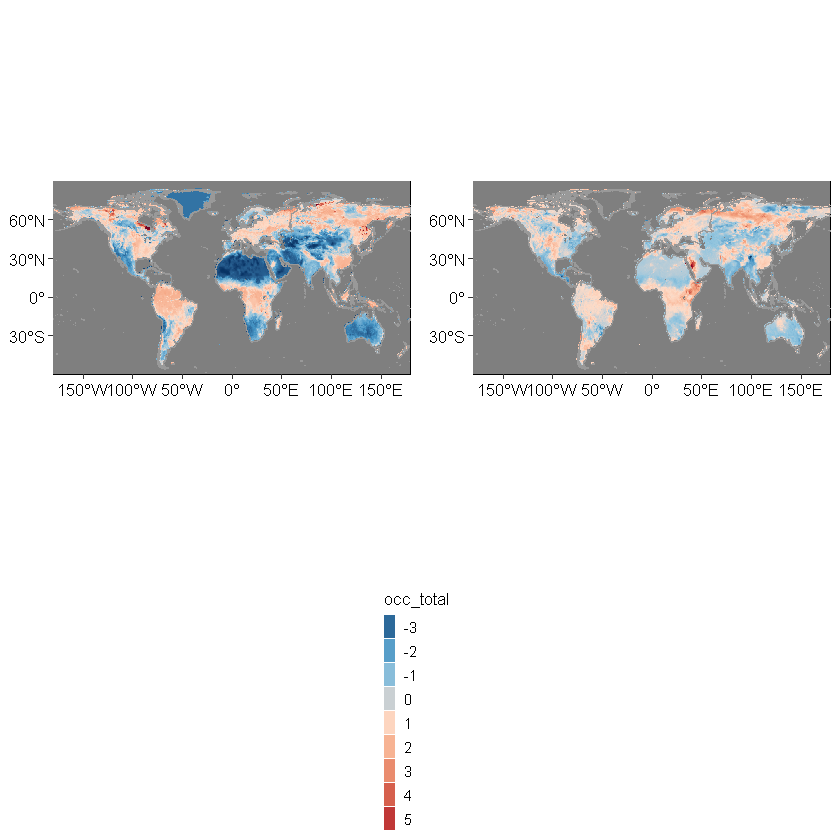

In [166]:
ggpubr::ggarrange(p1,p2,ncol =2,common.legend = T,legend = "bottom") 

（4）骤旱前后

In [177]:
var=c("sm","et","pet","t2m","p")  #g
data_name=c("ERA5LAND","ERA5","GLEAM") #i
varible <- c("SM","ET","PET","T","P")

In [178]:
#计算lag（和温度公式一样）
file_name="H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\data_fd_total.RData"
aa=fun_lag(1,3,file_name)
file_name="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\data_fd_total.RData"
bb=fun_lag(1,1,file_name)
filename="H:\\NO.1 flash drought\\03data\\ERA5\\2.fd_result\\data_fd_total.RData"
cc=fun_lag(1,2,filename)

[1] 4.412478e-05
[1] 8.824957e-05
[1] 0.0001323744
[1] 0.0001764991
[1] 0.0002206239
[1] 0.0002647487
[1] 0.0003088735
[1] 0.0003529983
[1] 0.0003971231
[1] 0.0004412478
[1] 0.0004853726
[1] 0.0005294974
[1] 0.0005736222
[1] 0.000617747
[1] 0.0006618718
[1] 0.0007059966
[1] 0.0007501213
[1] 0.0007942461
[1] 0.0008383709
[1] 0.0008824957
[1] 0.0009266205
[1] 0.0009707453
[1] 0.00101487
[1] 0.001058995
[1] 0.00110312
[1] 0.001147244
[1] 0.001191369
[1] 0.001235494
[1] 0.001279619
[1] 0.001323744
[1] 0.001367868
[1] 0.001411993
[1] 0.001456118
[1] 0.001500243
[1] 0.001544367
[1] 0.001588492
[1] 0.001632617
[1] 0.001676742
[1] 0.001720867
[1] 0.001764991
[1] 0.001809116
[1] 0.001853241
[1] 0.001897366
[1] 0.001941491
[1] 0.001985615
[1] 0.00202974
[1] 0.002073865
[1] 0.00211799
[1] 0.002162114
[1] 0.002206239
[1] 0.002250364
[1] 0.002294489
[1] 0.002338614
[1] 0.002382738
[1] 0.002426863
[1] 0.002470988
[1] 0.002515113
[1] 0.002559238
[1] 0.002603362
[1] 0.002647487
[1] 0.002691612
[1] 0.0

In [194]:
load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\",var[1],"\\lag_",data_name[1],".RData"))
    head(var_data)

,number,occ_year,occ_start,fd_length,fd_intensity,fd_mean_sesr_change,start_pentad,end_pentad,Lag_2,Lag_1,Onset,Lag_3,Lag_4
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,28493,1985,0,6,1,-0.14622781,292,298,-0.6612829,-0.66220968,-0.34305076,-0.5780453,-0.61873820
2,28493,1994,60,7,2,-0.08777121,1009,1016,1.2758943,1.47878048,-0.44777997,0.2484363,0.09270423
3,28493,1996,28,6,2,-0.14630510,1123,1129,0.6834594,1.48892110,0.91256016,-1.4281305,-0.69049821
4,28493,1998,57,9,3,-0.08807108,1298,1307,-0.8190006,-0.08884323,1.65743545,-0.3567993,0.52403454
5,28493,2010,62,6,2,-0.11412365,2179,2185,1.1698389,0.53906238,-0.06288495,-0.2110229,-0.04719372
6,28493,2014,56,6,3,-0.11311046,2465,2471,1.0074934,0.84402618,-0.26061315,1.2685470,0.48908030


19.检查降水数据===================================

（1）检查插值数据

In [37]:
YEAR=1985
load(paste0("I:\\1.data_file\\10气象数据\\1降水数据\\MSWEPV2.2\\P1\\pr_inter_",YEAR,".RData"))
    et_daily_data
    plot(et_daily_data)

class      : RasterStack 
dimensions : 360, 720, 259200, 365  (nrow, ncol, ncell, nlayers)
resolution : 0.5, 0.5  (x, y)
extent     : -180, 180, -90, 90  (xmin, xmax, ymin, ymax)
crs        : +proj=longlat +datum=WGS84 +no_defs 
names      :   X1985.01.01,   X1985.01.02,   X1985.01.03,   X1985.01.04,   X1985.01.05,   X1985.01.06,   X1985.01.07,   X1985.01.08,   X1985.01.09,   X1985.01.10,   X1985.01.11,   X1985.01.12,   X1985.01.13,   X1985.01.14,   X1985.01.15, ... 
min values :  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00, ... 
max values :      207.6751,      204.0457,      270.3683,      318.0544,      347.6548,      371.6233,      314.5821,      267.7779,      209.6790,      234.0901,      653.9182,      462.0688,      161.1345,      204.1156,      310.7422, ... 


Warning message in file(fn, "rb"):
"无法打开文件'C:\Users\dell\AppData\Local\Temp\RtmpqoUKnq\raster\r_tmp_2022-02-22_211332_17180_52452.gri': No such file or directory"


ERROR: Error in file(fn, "rb"): 无法打开链结


In [4]:
library(ncdf4)
library(raster)
library(stringr)
sample<- raster(xmn=-180, xmx=180, ymn=-90, ymx=90, 
                resolution=0.5, vals=NULL)  
ffname="I:\\1.data_file\\10气象数据\\1降水数据\\MSWEPV2.2\\P"
setwd(ffname)
file_name<-list.files(ffname)
YEAR=2012
#1-38==0.5///39-432==0.1
#ET_FUN=function(YEAR){
  filename <- str_subset(file_name, paste(YEAR, collapse = "|"))
  
  et_daily_month <- brick(filename[1],varname="precipitation")  #注意要选择变量
  et_daily_data <- resample(et_daily_month,sample,method='bilinear')
  for(file in 2:12){#
    et_daily_month <- brick(filename[file],varname="precipitation")  #注意要选择变量
    et_daily <- resample(et_daily_month,sample,method='bilinear')
    et_daily_data <- stack(et_daily_data,et_daily)
    print(file)
  }
  save(et_daily_data,file=paste0("I:\\1.data_file\\10气象数据\\1降水数据\\MSWEPV2.2\\P1\\pr_inter_1_",YEAR,".RData"))
#}
#sapply(1985:2016,ET_FUN)


[1] 2
[1] 3
[1] 4
[1] 5
[1] 6
[1] 7
[1] 8
[1] 9
[1] 10
[1] 11
[1] 12


class      : RasterStack 
dimensions : 360, 720, 259200, 366  (nrow, ncol, ncell, nlayers)
resolution : 0.5, 0.5  (x, y)
extent     : -180, 180, -90, 90  (xmin, xmax, ymin, ymax)
crs        : +proj=longlat +datum=WGS84 +no_defs 
names      :   X2012.01.01,   X2012.01.02,   X2012.01.03,   X2012.01.04,   X2012.01.05,   X2012.01.06,   X2012.01.07,   X2012.01.08,   X2012.01.09,   X2012.01.10,   X2012.01.11,   X2012.01.12,   X2012.01.13,   X2012.01.14,   X2012.01.15, ... 
min values : -2.002734e-01,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00, ... 
max values :      283.6265,      230.2808,      313.8629,      230.4013,      173.7002,      156.8976,      195.1815,      195.7451,      177.0858,      247.6638,      172.9473,      236.0617,      146.0851,      158.5847,      186.9919, ... 


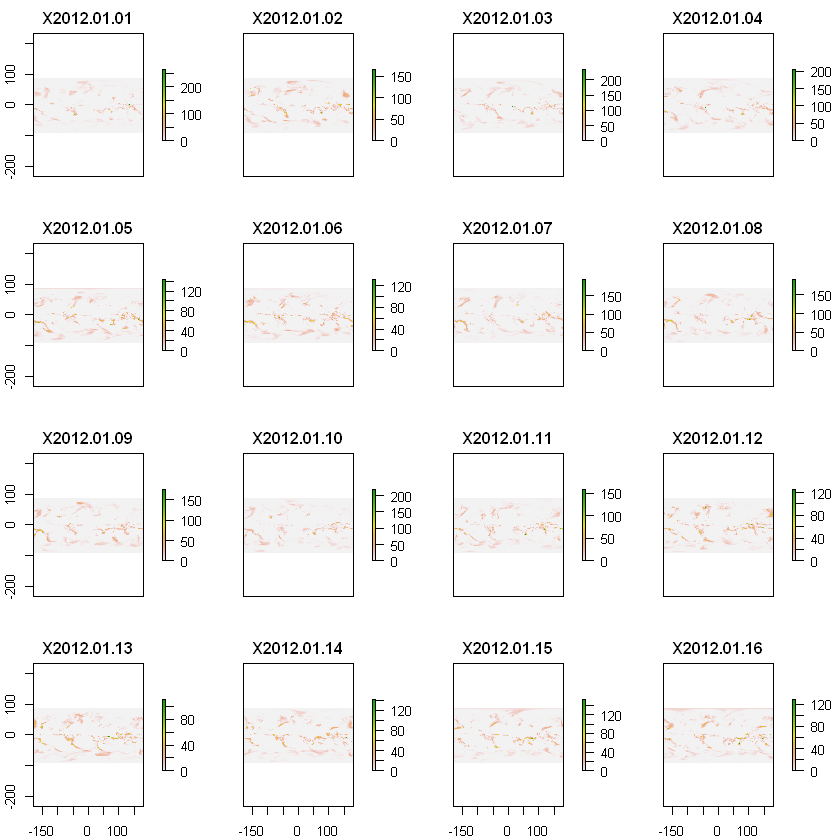

In [6]:
et_daily_data
plot(et_daily_data)

（2）检查数据合并

In [29]:
var="P"
#data_name="GLEAM"
#filename="H:\\NO.1 flash drought\\03data\\gleam_v3.5a\\6.GLEAM-0.5\\data_fd_total.RData"
#filename="H:\\NO.1 flash drought\\03data\\ERA5\\1.result\\data_fd_total1.RData"
filename="H:\\NO.1 flash drought\\03data\\ERA5\\2.fd_result\\data_fd_total1.RData"
load(filename)
head(data_fd_total)
  data_fd_total <- data_fd_total[-which(data_fd_total$occ_year<1985|data_fd_total$occ_year>2016),]  #注意：这里多一步的计算只在1985-2016年中
  data_fd_total$start_pentad <- (data_fd_total$occ_year-1981)*73+data_fd_total$occ_start                        #计算骤旱发生的开始时间
  data_fd_total$end_pentad <- (data_fd_total$occ_year-1981)*73+data_fd_total$occ_start+data_fd_total$fd_length  #计算骤旱发生的结束时间
  #fd_order <- unique(data_fd_total$number)  #发生骤旱的点
  #length(fd_order)
  order=unique(data_fd_total[,1:3]) #发生骤旱的经纬度
  dim(order)
#fd_order
load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\data_",
                               var,"_fd_1_",data_name[2],".RData")) 
head(data_var_fd)  #骤旱发生点和天数
dim(data_var_fd)


,lat,lon,number,occ_year,occ_start,fd_length,fd_intensity,fd_mean_sesr_change,DATE,month
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<date>,<chr>
1,84,-40.5,8920,1999,12,6,2,-0.14240502,1999-02-25,02
2,84,-40.5,8920,2000,11,6,2,-0.14059396,2000-02-20,02
3,84,-40.0,8921,1988,37,9,2,-0.06281983,1988-06-29,06
4,84,-40.0,8921,1991,27,6,1,-0.14105036,1991-05-11,05
5,84,-40.0,8921,2006,15,6,1,-0.09959241,2006-03-12,03
6,84,-40.0,8921,2014,39,8,1,-0.04907727,2014-07-10,07


[1] 43847     3

X1985.01.01,X1985.01.02,X1985.01.03,X1985.01.04,X1985.01.05,X1985.01.06,X1985.01.07,X1985.01.08,X1985.01.09,X1985.01.10,...,X2016.12.22,X2016.12.23,X2016.12.24,X2016.12.25,X2016.12.26,X2016.12.27,X2016.12.28,X2016.12.29,X2016.12.30,X2016.12.31
0,0,0.000,0,0,0,0,0.425,0.005,0.010,...,15.310,6.058,0.168,0.474,0.129,0.000,0.045,0.240,0,0
0,0,0.000,0,0,0,0,0.417,0.005,0.019,...,14.798,6.268,0.210,0.514,0.193,0.000,0.065,0.288,0,0
0,0,0.000,0,0,0,0,0.360,0.004,0.020,...,13.973,6.272,0.196,0.515,0.211,0.003,0.081,0.329,0,0
0,0,0.000,0,0,0,0,0.296,0.001,0.021,...,12.869,6.216,0.231,0.494,0.247,0.004,0.102,0.381,0,0
0,0,0.006,0,0,0,0,0.261,0.000,0.024,...,12.086,6.244,0.232,0.473,0.279,0.007,0.136,0.428,0,0
0,0,0.021,0,0,0,0,0.222,0.000,0.027,...,11.498,6.262,0.219,0.472,0.310,0.009,0.153,0.472,0,0


[1] 43847 11688

In [16]:
order

,lat,lon,number
,<dbl>,<dbl>,<dbl>
1,70.5,26.0,28493
8,70.0,19.0,29199
20,69.5,17.5,29916
29,69.5,18.0,29917
44,69.0,35.5,30672
48,69.0,36.5,30674
56,68.0,13.0,32067
61,68.0,15.5,32072
68,67.5,15.0,32791


In [39]:
data_name=c("ERA5LAND","ERA5","GLEAM") #i
varible <- c("SM","ET","PET","T","P")
load(paste0("I:\\1.data_file\\10气象数据\\1降水数据\\MSWEPV2.2\\P2\\pentad.data.z_",data_name[2],".RData"))
vardata1 = pentad.data[,1]
dim(na.omit(pentad.data))
head(pentad.data)


[1] 43838  2336

0.000,0.440,4.262,0,0,0.012,0,0.000,0.067,0.037,...,5.732,8.925,0.000,0.099,1.910,0.185,1.097,1.959,29.021,0.3450000
0.000,0.441,4.355,0,0,0.011,0,0.000,0.049,0.032,...,5.910,8.898,0.000,0.098,1.929,0.173,0.997,2.072,28.721,0.4550000
0.000,0.384,4.441,0,0,0.010,0,0.002,0.057,0.034,...,5.975,8.626,0.000,0.091,1.855,0.149,0.839,2.118,27.548,0.5200000
0.000,0.318,4.576,0,0,0.010,0,0.004,0.073,0.034,...,6.065,8.185,0.000,0.088,1.761,0.171,0.721,2.236,26.020,0.6116667
0.006,0.285,4.774,0,0,0.010,0,0.007,0.091,0.028,...,6.264,7.985,0.000,0.081,1.722,0.144,0.615,2.377,24.998,0.7083333
0.021,0.249,4.927,0,0,0.011,0,0.009,0.111,0.025,...,6.424,7.897,0.002,0.080,1.698,0.098,0.535,2.504,24.234,0.7866667


In [40]:
length(vardata1)
 data=data.frame(order,vardata1)
 head(data)
 dim(na.omit(data))
 

[1] 43847

,lat,lon,number,vardata1
,<dbl>,<dbl>,<dbl>,<dbl>
1,84,-40.5,8920,0.000
3,84,-40.0,8921,0.000
8,84,-39.5,8922,0.000
11,84,-39.0,8923,0.000
14,84,-38.5,8924,0.006
15,84,-38.0,8925,0.021


[1] 43838     4

In [41]:
summary(data)

      lat              lon              number          vardata1      
 Min.   :-85.00   Min.   :-180.00   Min.   :  8920   Min.   :  0.000  
 1st Qu.: -3.50   1st Qu.: -51.50   1st Qu.: 67496   1st Qu.:  0.002  
 Median : 25.00   Median :  27.50   Median : 94041   Median :  0.795  
 Mean   : 19.31   Mean   :  21.35   Mean   :102199   Mean   :  9.627  
 3rd Qu.: 43.50   3rd Qu.:  83.00   3rd Qu.:135036   3rd Qu.:  9.276  
 Max.   : 84.00   Max.   : 179.50   Max.   :252098   Max.   :316.252  
                                                     NA's   :9        

OGR data source with driver: ESRI Shapefile 
Source: "H:\NO.1 flash drought\02 地图文件\continent shapefile\continent.shp", layer: "continent"
with 8 features
It has 1 fields


Regions defined for each Polygons

Warning message:
"Removed 657 rows containing missing values (geom_tile)."


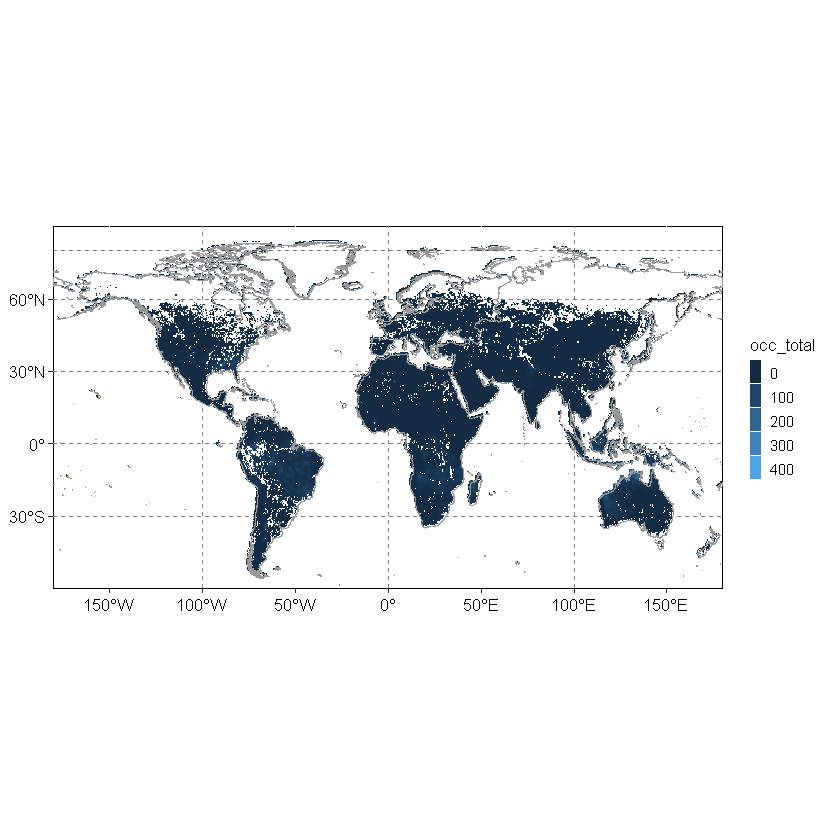

In [34]:
#load("I:\\1.data_file\\10气象数据\\ERA5\\recal\\t3.RData")
dat = data.frame(x=data$lon, y=data$lat, z= data$vardata1)#[(720*5*18+1):(720*5*19)]
names(dat)=c("lon","lat","occ_total")

library(raster)
library(rgdal)
library(ggplot2)
library(ggthemes)
library(rcartocolor)
library(RColorBrewer)
library(viridis)
continent<-rgdal::readOGR('H:\\NO.1 flash drought\\02 地图文件\\continent shapefile\\continent.shp')
fontsize=10
colour <- c("#67001f","#b2182b","#fddbc7","#92c5de","#4393c3","#053061")#"#d6604d","#f4a582",
p=ggplot()+
  geom_hline(aes(yintercept = 60),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = 30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = -30),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = -100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_vline(aes(xintercept = 100),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_tile(data = dat,aes(x=lon,y=lat,fill=occ_total))+
  geom_polygon(data = fortify(continent),aes(x = long, y = lat, group = group), colour ="grey60" ,fill = NA,size=0.1) + #
  theme(panel.background = element_rect(fill = 'transparent',color = 'black'),
        panel.grid.minor = element_blank(),
        axis.text = element_text(colour='black',size=fontsize,hjust=.5),
        #axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5),
        axis.title=element_blank(),
        legend.position=c('right'),
        legend.direction = c('vertical'),
        legend.key = element_rect(fill = 'transparent'),
        legend.title = element_text(size = fontsize)
        #legend.spacing.x = unit(0, 'cm'),
        )+#legend.title = element_blank()
  #scale_fill_viridis(option="H",discrete=F)+
  #legend.key.size = unit(0.7, "cm"))+
  #scale_fill_manual(values = colour)+
  #scale_fill_brewer(palette ="YlOrRd")+
  #scale_fill_distiller(palette = "YlOrBr")+rev(colour)
  #scale_fill_gradientn(colours=rev(colour),breaks=c(0,1,2,3,4,5,6,7,8,9))+#,30,35,40
  #scale_fill_gradient2(colours=c("red","yellow"), values=c(-1,0,1))+
  #scale_fill_gradientn(colours =rev(colorspacH::diverge_hcl(7)),breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
  # scico::scale_fill_scico(palette = "lajolla",breaks=c(0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100))+
  #labs(fill="% of Years with a Flash drought")+   #设置图片标题
  coord_fixed(1.3)+
  #geom_hline(aes(yintercept = 65),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  geom_hline(aes(yintercept = 80),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  scale_y_continuous(breaks=c(-30,0,30,60),labels=c("30°S","0°","30°N","60°N"),limits =c(-60,90),expand = c(0,0))+
  scale_x_continuous(breaks=c(-150,-100,-50,0,50,100,150),labels=c("150°W","100°W","50°W","0°","50°E","100°E","150°E"),expand = c(0,0))+
  #ylim(-60,90)+
  guides(fill=guide_legend(ncol=1,label.position = "right",keyheight =1,keywidth = 0.5)) #图例分为几行或者几列展示
  p
 #}


20.处理fd_lag数据

In [208]:
#a.计算比变量发生前两周的差值进行比较
var
data_name
fun_lag_fd=function(g,i){
load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\",
    var[g],"\\lag_",data_name[i],".RData"))
data=var_data
data$Lag_11=(data$Lag_1)-(data$Onset)
data$Lag_21=(data$Lag_2)-(data$Onset)
data$Lag_31=(data$Lag_3)-(data$Onset)
data$Lag_41=(data$Lag_4)-(data$Onset)

library(dplyr)
#data3=group_by(data,dataset,lag) #按照数据集，lag进行分组
data_0.25=quantile(data$Lag_21,0.25,na.rm=T)
data_0.5=quantile(data$Lag_21,0.5,na.rm=T)
data_0.75=quantile(data$Lag_21,0.75,na.rm=T)

data1_0.25=quantile(data$Lag_11,0.25,na.rm=T)
data1_0.5=quantile(data$Lag_11,0.5,na.rm=T)
data1_0.75=quantile(data$Lag_11,0.75,na.rm=T)

data2_0.25=quantile(data$Onset,0.25,na.rm=T)
data2_0.5=quantile(data$Onset,0.5,na.rm=T)
data2_0.75=quantile(data$Onset,0.75,na.rm=T)

data3_0.25=quantile(data$Lag_31,0.25,na.rm=T)
data3_0.5=quantile(data$Lag_31,0.5,na.rm=T)
data3_0.75=quantile(data$Lag_31,0.75,na.rm=T)

data4_0.25=quantile(data$Lag_41,0.25,na.rm=T)
data4_0.5=quantile(data$Lag_41,0.5,na.rm=T)
data4_0.75=quantile(data$Lag_41,0.75,na.rm=T)

aa=data.frame(lag_2=c(data_0.25,data_0.5,data_0.75),lag_1=c(data1_0.25,data1_0.5,
data1_0.75),onset=c(data2_0.25,data2_0.5,data2_0.75),lag_3=c(data3_0.25,data3_0.5,data3_0.75),
lag_4=c(data4_0.25,data4_0.5,data4_0.75))
bb=t(aa)
bb=data.frame(bb)
names(bb)=c("aa25","aa50","aa75")
bb$lag=c('lag_2','lag_1','onset','lag_3','lag_4')
bb$data_set=data_name[i]
return(bb)
}

[1] "sm"    "et"    "pet"   "t2m"   "P"     "p_pet"

[1] "ERA5LAND" "ERA5"     "GLEAM"

In [17]:
#b.直接用骤旱前后的值
var
data_name
fun_lag_fd=function(g,i){
load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\",
    var[g],"\\lag_1_",data_name[i],".RData"))#已修改
data=var_data

library(dplyr)
#data3=group_by(data,dataset,lag) #按照数据集，lag进行分组
data_0.25=quantile(data$Lag_2,0.25,na.rm=T)
data_0.5=quantile(data$Lag_2,0.5,na.rm=T)
data_0.75=quantile(data$Lag_2,0.75,na.rm=T)

data1_0.25=quantile(data$Lag_1,0.25,na.rm=T)
data1_0.5=quantile(data$Lag_1,0.5,na.rm=T)
data1_0.75=quantile(data$Lag_1,0.75,na.rm=T)

data2_0.25=quantile(data$Onset,0.25,na.rm=T)
data2_0.5=quantile(data$Onset,0.5,na.rm=T)
data2_0.75=quantile(data$Onset,0.75,na.rm=T)

data3_0.25=quantile(data$Lag_3,0.25,na.rm=T)
data3_0.5=quantile(data$Lag_3,0.5,na.rm=T)
data3_0.75=quantile(data$Lag_3,0.75,na.rm=T)

data4_0.25=quantile(data$Lag_4,0.25,na.rm=T)
data4_0.5=quantile(data$Lag_4,0.5,na.rm=T)
data4_0.75=quantile(data$Lag_4,0.75,na.rm=T)

aa=data.frame(lag_2=c(data_0.25,data_0.5,data_0.75),lag_1=c(data1_0.25,data1_0.5,
data1_0.75),onset=c(data2_0.25,data2_0.5,data2_0.75),lag_3=c(data3_0.25,data3_0.5,data3_0.75),
lag_4=c(data4_0.25,data4_0.5,data4_0.75))
bb=t(aa)
bb=data.frame(bb)
names(bb)=c("aa25","aa50","aa75")
bb$lag=c('lag_2','lag_1','onset','lag_3','lag_4')
bb$data_set=data_name[i]
return(bb)
}

[1] "sm"  "et"  "pet" "t2m" "p"

[1] "ERA5LAND" "ERA5"     "GLEAM"

In [221]:
#g=1/'sm''et''pet''t2m''P''p_pet'
fun=function(g){
bb=fun_lag_fd(g,1)
#bb
cc=fun_lag_fd(g,2)
#cc
dd=fun_lag_fd(g,3)
#dd

data=rbind(bb,cc,dd)
data$order=c(0.8,1.8,2.8,3.8,4.8,1,2,3,4,5,1.2,2.2,3.2,4.2,5.2)
#data

var=c("sm","et","pet","t2m","P","p_pet")
varname=c("SM","ET","PET","T","P","P-PET")
data_name=c("ERA5LAND","ERA5","GLEAM")
order_pet <- with(data,reorder(lag,aa50,median))
order_pet <- factor(order_pet,levels = c("Lag_2","Lag_1","onset",
                                         "Lag_3","Lag_4"))
data4=data
fontsize=18
library(ggplot2)
library(RColorBrewer)
colour1 = c(brewer.pal(7,"Set2")[c(2,1,3,4,5)])
p=ggplot(data4)+
  geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  labs(y=paste0(varname[g]," Anomaly"),family="serif",fill="Data Set")+#x="Time",
  theme_bw()+ 
   annotate("segment",x=c(0.8,1,1.2),xend =c(0.8,1,1.2) ,y=c(data4$aa25[1],data4$aa25[6],data4$aa25[11]),
            yend= c(data4$aa75[1],data4$aa75[6],data4$aa75[11]),size=4,colour=colour1[1:3])+
  annotate("segment",x=c(1.8,2,2.2),xend =c(1.8,2,2.2),y=c(data4$aa25[2],data4$aa25[7],data4$aa25[12]),
           yend= c(data4$aa75[2],data4$aa75[7],data4$aa75[12]),size=4,colour=colour1[1:3])+
  annotate("segment",x=c(2.8,3,3.2),xend =c(2.8,3,3.2),y=c(data4$aa25[3],data4$aa25[8],data4$aa25[13]),
           yend= c(data4$aa75[3],data4$aa75[8],data4$aa75[13]),size=4,colour=colour1[1:3])+
  annotate("segment",x=c(3.8,4.0,4.2),xend =c(3.8,4.0,4.2),y=c(data4$aa25[4],data4$aa25[9],data4$aa25[14]),
           yend= c(data4$aa75[4],data4$aa75[9],data4$aa75[14]),size=4,colour=colour1[1:3])+
  annotate("segment",x=c(4.8,5.0,5.2),xend =c(4.8,5.0,5.2),y=c(data4$aa25[5],data4$aa25[10],data4$aa25[15]),
           yend= c(data4$aa75[5],data4$aa75[10],data4$aa75[15]),size=4,colour=colour1[1:3])+
  #ggtitle(data_name[i])+
  geom_point(aes(x=order, y=aa50,shape=data_set,colour=data_set),size=5)+#,colour=data_set
  theme(legend.position = "top",
        #legend.justification = c(0.5,1),
        legend.title = element_text(face='bold',colour='black',size=(fontsize+4),hjust=.5,family="serif"),#size=fontsize
        legend.key.height = unit(1,"cm"),
        plot.title=element_text(hjust=0.5,size=fontsize),
        axis.text = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
        axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
        axis.title.x = element_blank(),
        panel.grid.major=element_blank(),
        panel.grid.minor=element_blank())
return(p)
}

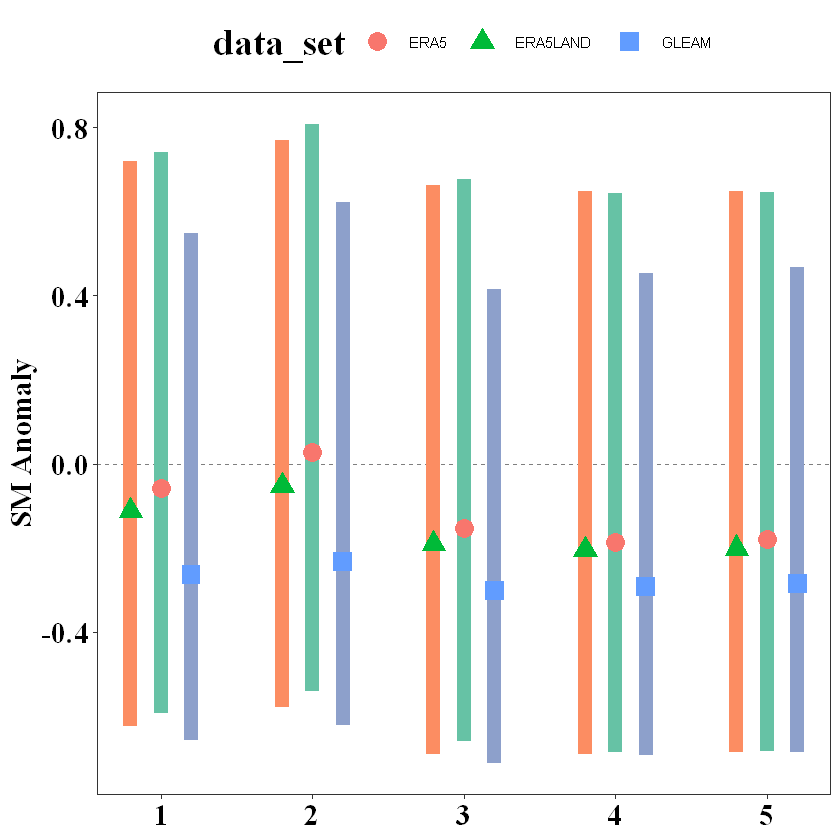

In [222]:
fun(1)

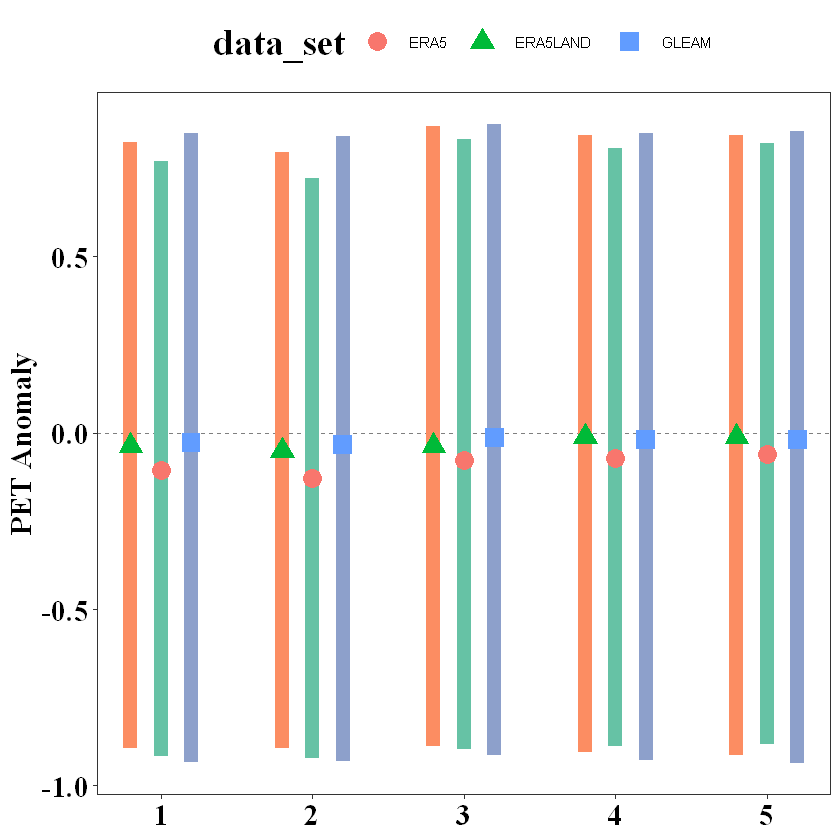

In [223]:
fun(3)

21.综合分析不同气候LAGT图

In [192]:
var=c("sm","et","pet","t2m","P","p_pet")
varname=c("SM","ET","PET","T","P","P-PET")
data_name=c("ERA5LAND","ERA5","GLEAM")

lag_fun=function(i){
load(paste0("H:\\NO.1 flash drought\\03data\\meteorological\\",var[i],
            "_lag_total_data.RData"))
data=var_data
#data=var_data[which(var_data$dataset=="ERA5LAND"),]

library(magrittr)
library(dplyr)
data3=group_by(data,dataset,lag) #按照数据集，lag进行分组
data_0.25=summarise(data3,quantile(value,0.25))
data_0.5=summarise(data3,quantile(value,0.5))
data_0.75=summarise(data3,quantile(value,0.75))

data4=data.frame(data_0.25,data_0.5[,3],data_0.75[,3])
names(data4)=c("data_set","lag","aa25","aa50","aa75")
#data4$Lag=paste0(data4$data_set,"_",data4$lag)
data4$order=c(1.8,0.8,4.8,2.8,3.8,2,1,5,3,4,2.2,1.2,5.2,3.2,4.2)
#head(data4)
fontsize=18
library(ggplot2)
library(RColorBrewer)
colour1 = c(brewer.pal(7,"Set2")[c(2,1,3,4,5)])
p=ggplot(data4) +
  geom_hline(aes(yintercept = 0),linetype = 'dashed',alpha = 0.5,lwd = 0.5,color = 'black')+
  labs(y=paste0(varname[i]," Anomaly"),family="serif",fill="Data Set")+#x="Time",
  theme_bw()+ 
  #coord_cartesian(ylim=c(-2, 2))+
   annotate("segment",x=c(1.8,2,2.2),xend =c(1.8,2,2.2) ,y=c(data4$aa25[1],data4$aa25[6],data4$aa25[11]),
            yend= c(data4$aa75[1],data4$aa75[6],data4$aa75[11]),size=4,colour=colour1[1:3])+
  annotate("segment",x=c(0.8,1,1.2),xend =c(0.8,1,1.2),y=c(data4$aa25[2],data4$aa25[7],data4$aa25[12]),
           yend= c(data4$aa75[2],data4$aa75[7],data4$aa75[12]),size=4,colour=colour1[1:3])+
  annotate("segment",x=c(4.8,5.0,5.2),xend =c(4.8,5.0,5.2),y=c(data4$aa25[3],data4$aa25[8],data4$aa25[13]),
           yend= c(data4$aa75[3],data4$aa75[8],data4$aa75[13]),size=4,colour=colour1[1:3])+
  annotate("segment",x=c(2.8,3,3.2),xend =c(2.8,3,3.2),y=c(data4$aa25[4],data4$aa25[9],data4$aa25[14]),
           yend= c(data4$aa75[4],data4$aa75[9],data4$aa75[14]),size=4,colour=colour1[1:3])+
  annotate("segment",x=c(3.8,4.0,4.2),xend =c(3.8,4.0,4.2),y=c(data4$aa25[5],data4$aa25[10],data4$aa25[15]),
           yend= c(data4$aa75[5],data4$aa75[10],data4$aa75[15]),size=4,colour=colour1[1:3])+
  #ggtitle(data_name[i])+
  geom_point(aes(x=order, y=aa50,shape=data_set,colour=data_set),size=5)+#,colour=data_set
  theme(legend.position = "top",
        #legend.justification = c(0.5,1),
        legend.title = element_text(face='bold',colour='black',size=(fontsize+4),hjust=.5,family="serif"),#size=fontsize
        legend.key.height = unit(1,"cm"),
        plot.title=element_text(hjust=0.5,size=fontsize),
        axis.text = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
        axis.title = element_text(face='bold',colour='black',size=fontsize,hjust=.5,family="serif"),
        axis.title.x = element_blank(),
        panel.grid.major=element_blank(),
        panel.grid.minor=element_blank())
return(p)
}

`summarise()` has grouped output by 'dataset'. You can override using the `.groups` argument.

`summarise()` has grouped output by 'dataset'. You can override using the `.groups` argument.

`summarise()` has grouped output by 'dataset'. You can override using the `.groups` argument.



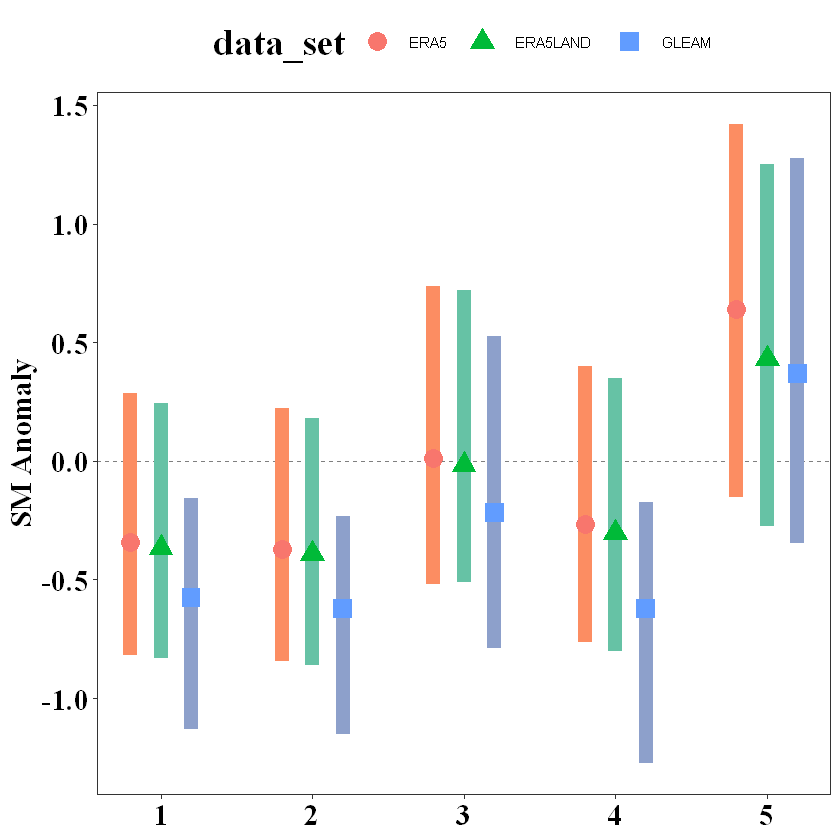

In [193]:
lag_fun(1)

In [32]:
p1=lag_fun(1)
p2=lag_fun(2)
p3=lag_fun(3)
p4=lag_fun(4)
p5=lag_fun(5)
p6=lag_fun(6)

`summarise()` has grouped output by 'dataset'. You can override using the `.groups` argument.

`summarise()` has grouped output by 'dataset'. You can override using the `.groups` argument.

`summarise()` has grouped output by 'dataset'. You can override using the `.groups` argument.

`summarise()` has grouped output by 'dataset'. You can override using the `.groups` argument.

`summarise()` has grouped output by 'dataset'. You can override using the `.groups` argument.

`summarise()` has grouped output by 'dataset'. You can override using the `.groups` argument.

`summarise()` has grouped output by 'dataset'. You can override using the `.groups` argument.

`summarise()` has grouped output by 'dataset'. You can override using the `.groups` argument.

`summarise()` has grouped output by 'dataset'. You can override using the `.groups` argument.

`summarise()` has grouped output by 'dataset'. You can override using the `.groups` argument.

`summarise()` has grouped output by 'dataset'. You

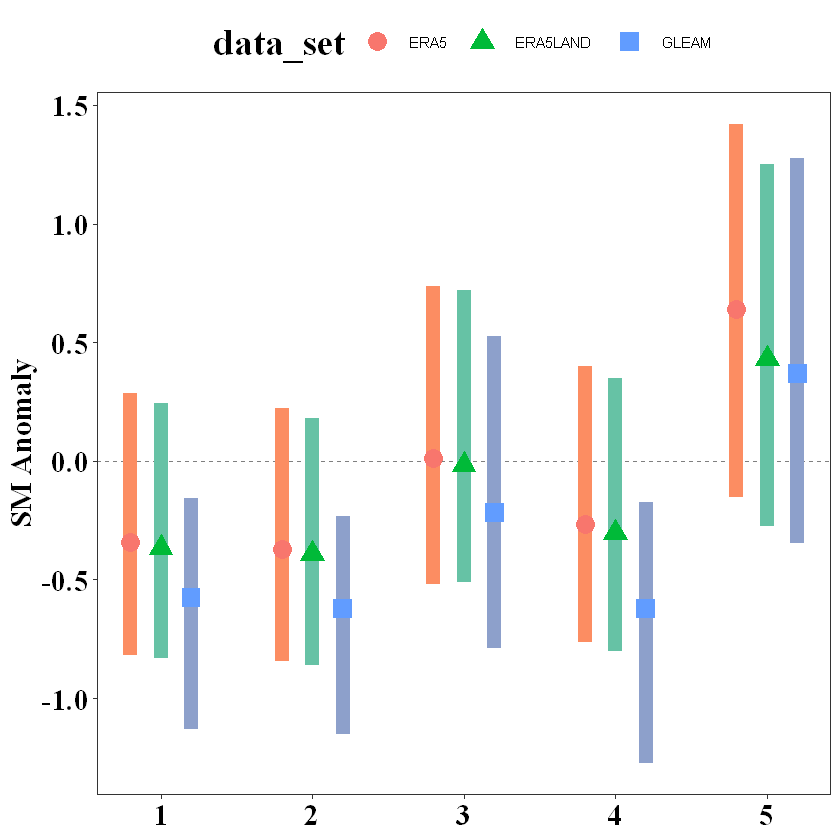

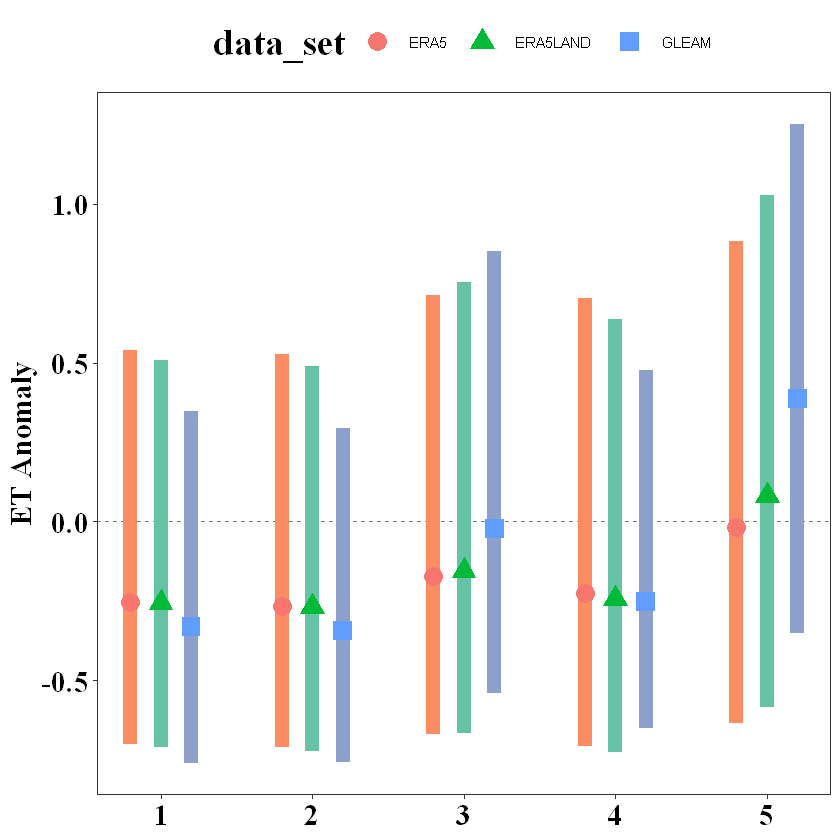

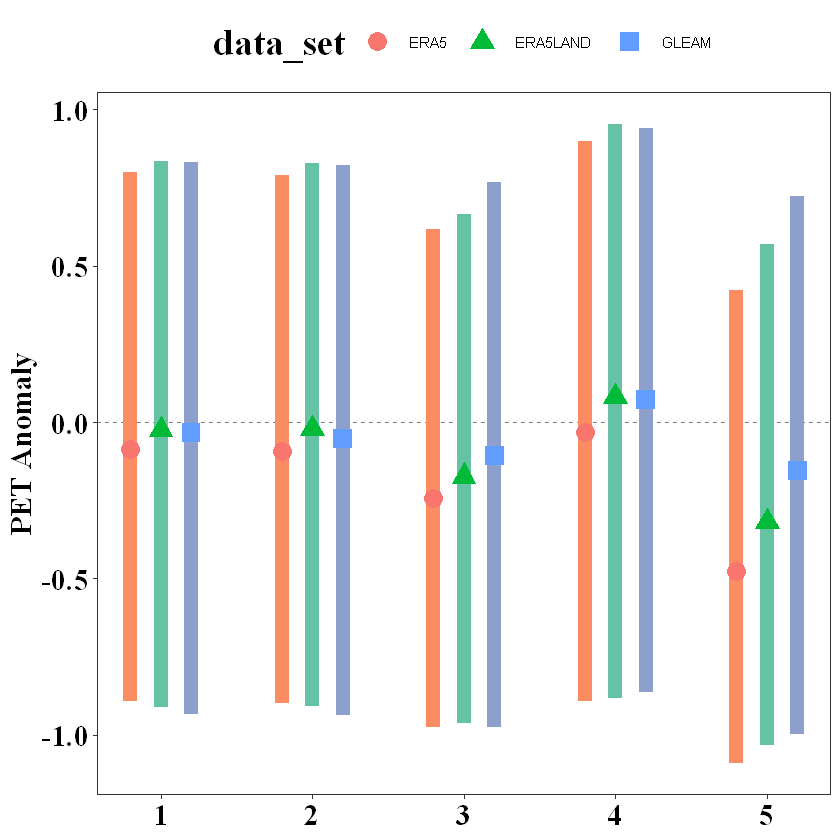

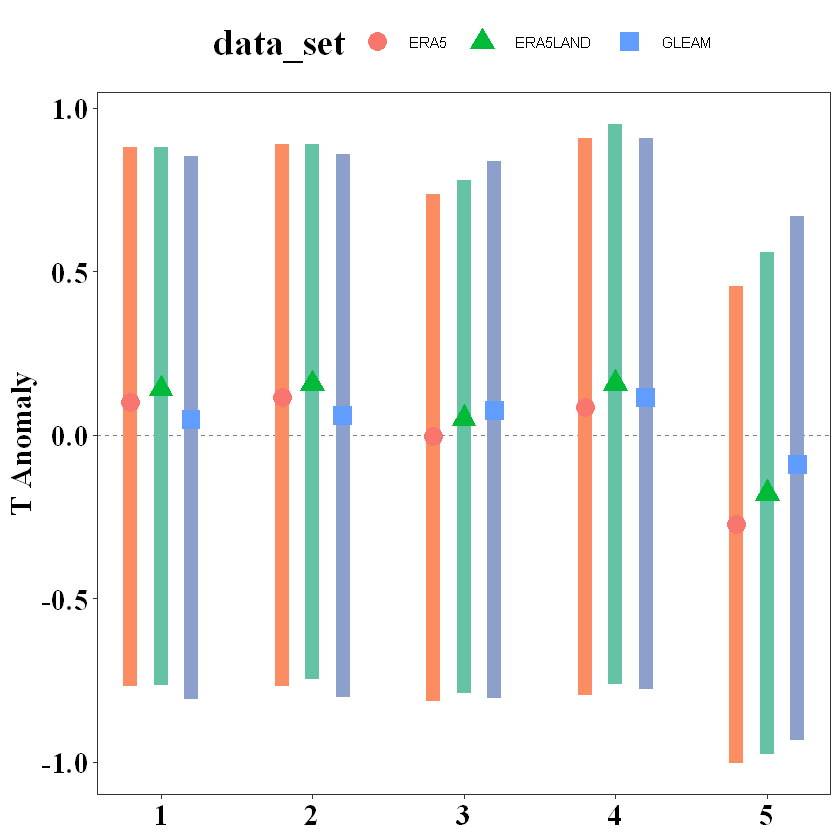

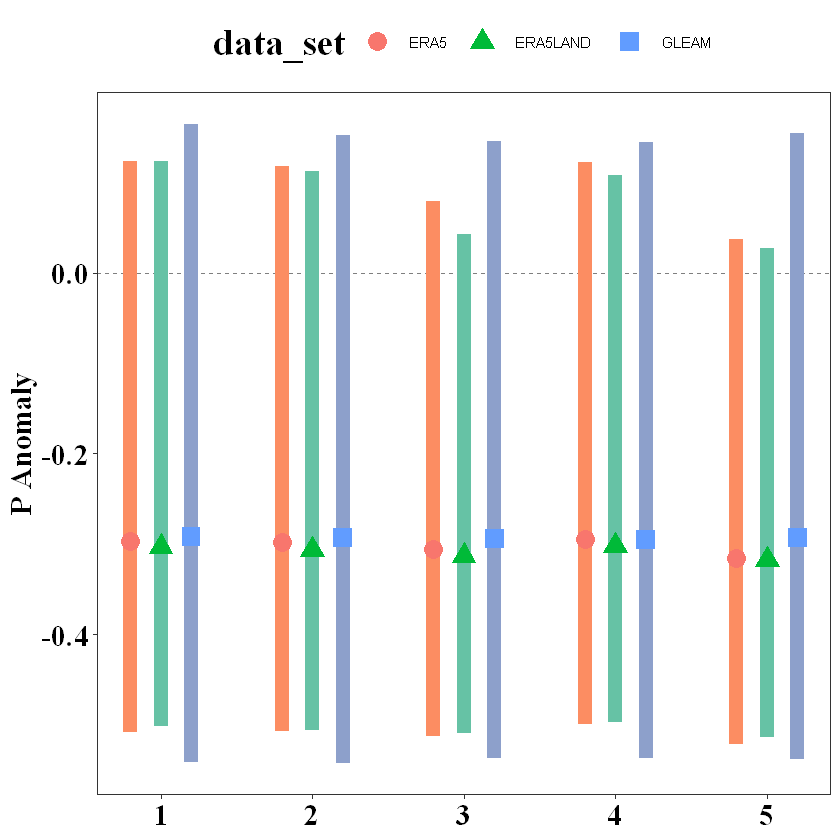

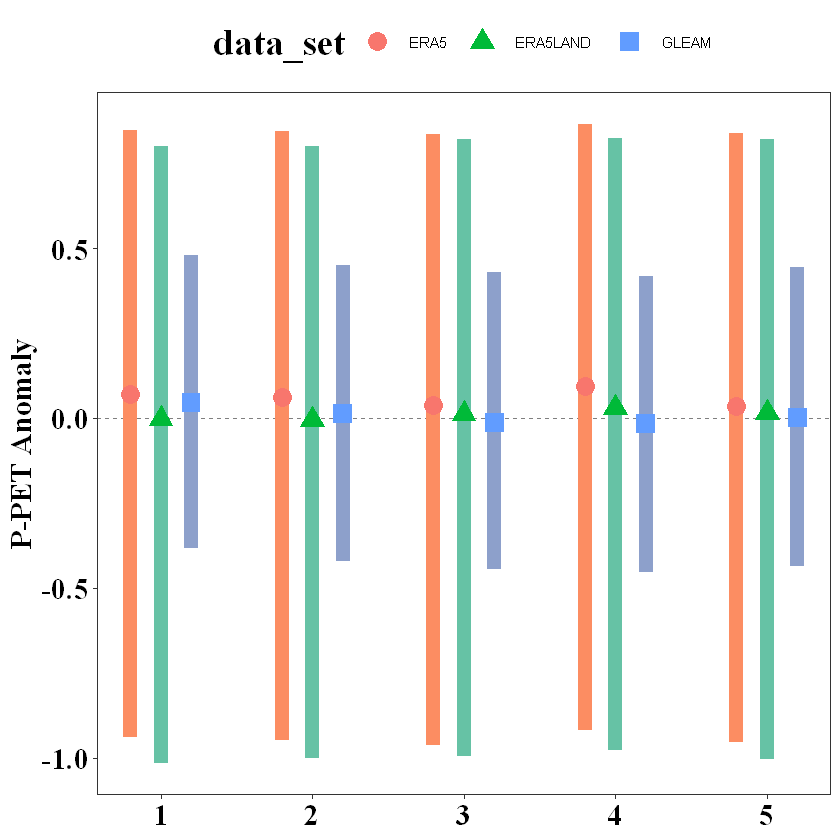

In [33]:
p1
p2
p3
p4
p5
p6

`summarise()` has grouped output by 'dataset'. You can override using the `.groups` argument.

`summarise()` has grouped output by 'dataset'. You can override using the `.groups` argument.

`summarise()` has grouped output by 'dataset'. You can override using the `.groups` argument.



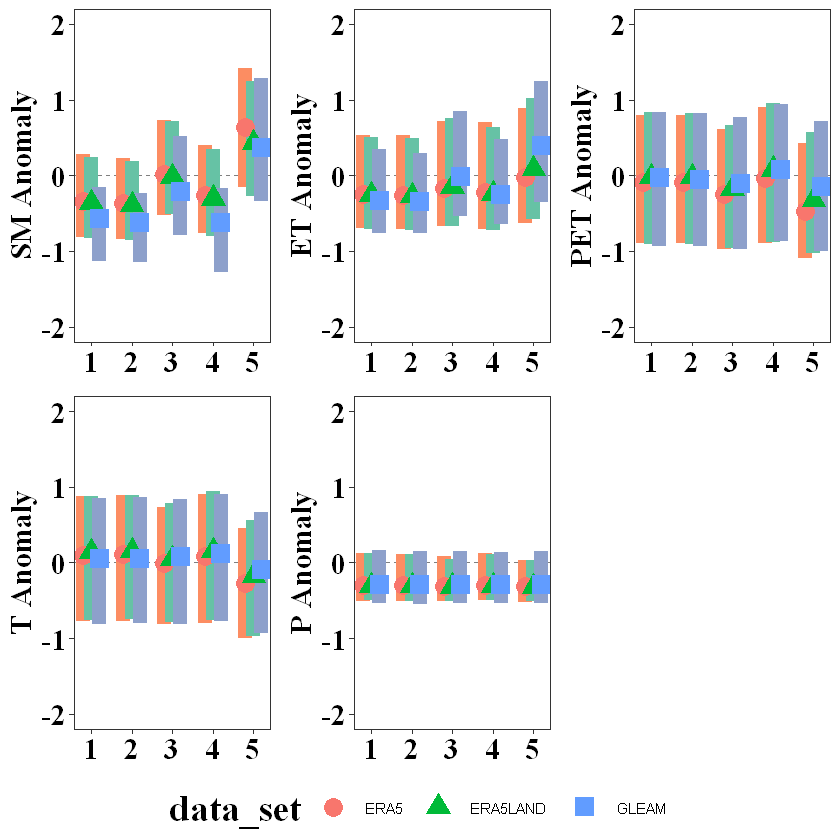

In [28]:

ggpubr::ggarrange(p1,p2,p3,p4,p5,ncol = 3, nrow =2,common.legend = T,legend = "bottom") 
